In [4]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

In [5]:
pwd

'C:\\Users\\harsh\\OneDrive\\Desktop'

In [6]:
data = pd.read_excel("Milk Data Complete.xlsx")

In [7]:
data

,Conc.(mg/ml),Type of Milk,Foamability(ml),Foam height(mm),RMI 30(ml),t(s),Height(mm),Temperature(°C),Adulterant
0,0,Fresh,48.30,38.40,44.40,33.00,20.10,26,SDS
1,0,Fresh,52.50,41.50,50.50,67.80,20.20,26,SDS
2,0,Fresh,49.70,39.60,25.40,32.80,20.20,26,SDS
3,0,Fresh,50.17,39.83,40.10,44.53,20.17,26,SDS
4,10,Fresh,51.60,41.10,49.60,41.10,20.10,26,SDS
...,...,...,...,...,...,...,...,...,...
413,70,Raw,39.57,31.50,37.87,73.97,20.13,60,Tween80
414,150,Raw,42.30,33.70,41.50,615.10,20.20,60,Tween80
415,150,Raw,45.60,36.30,44.50,95.10,20.30,60,Tween80
416,150,Raw,41.70,33.20,39.10,67.70,20.10,60,Tween80


In [8]:
data.columns

Index(['Conc.(mg/ml)', 'Type of Milk', 'Foamability(ml)', 'Foam height(mm)',
       'RMI 30(ml)', 't(s)', 'Height(mm)', 'Temperature(°C)', 'Adulterant'],
      dtype='object')

In [9]:
data.dtypes

Conc.(mg/ml)         int64
Type of Milk        object
Foamability(ml)    float64
Foam height(mm)    float64
RMI 30(ml)         float64
t(s)               float64
Height(mm)         float64
Temperature(°C)      int64
Adulterant          object
dtype: object

In [10]:
np.unique(data['Conc.(mg/ml)'])

array([  0,  10,  70, 150], dtype=int64)

In [11]:
np.unique(data['Temperature(°C)'])

array([10, 26, 60], dtype=int64)

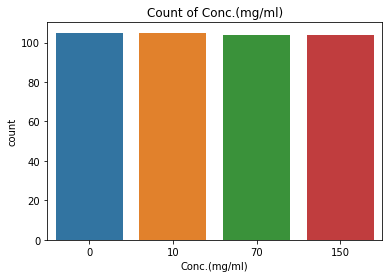

In [12]:
fig , ax = plt.subplots(figsize=(6,4))
sns.countplot(x='Conc.(mg/ml)', data=data)
plt.title("Count of Conc.(mg/ml)")
plt.show()

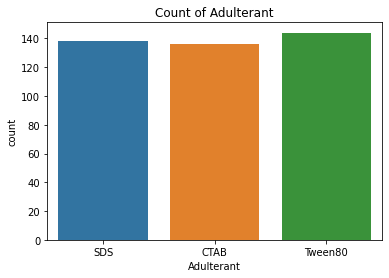

In [13]:
fig , ax = plt.subplots(figsize=(6,4))
sns.countplot(x='Adulterant', data=data)
plt.title("Count of Adulterant")
plt.show()

Plotting distplot and probability plot of numerical feature for controlling skewness in the features

In [14]:
# Skewness and Kurtosis of the feature
print("Skewness: {:.3f}".format(data['Foamability(ml)'].skew()))
print("Kurtosis: {:.3f}". format(data['Foamability(ml)'].kurt()))

Skewness: 0.152
Kurtosis: -1.279


C:\Users\harsh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


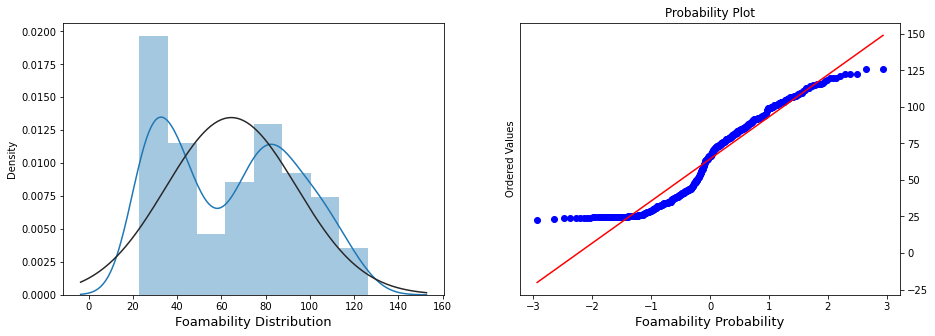

In [15]:
from scipy import stats

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
sns.distplot(data['Foamability(ml)'], fit= stats.norm, ax=ax[0])
stats.probplot(data['Foamability(ml)'], plot=plt)
ax[0].set_xlabel('Foamability Distribution', fontsize = 13)
ax[1].set_xlabel('Foamability Probability', fontsize = 13)
ax[1].yaxis.tick_right() # where the y axis marks will be

C:\Users\harsh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


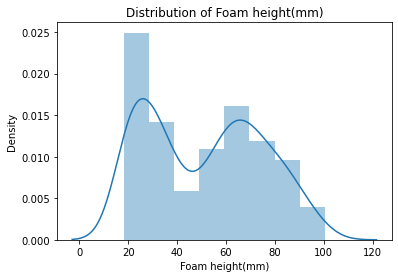

In [16]:
plt.title("Distribution of Foam height(mm)")
ax = sns.distplot(data["Foam height(mm)"])

In [17]:
print("Skewness: {:.3f}".format(data["Foam height(mm)"].skew()))
print("Kurtosis: {:.3f}". format(data["Foam height(mm)"].kurt()))

Skewness: 0.148
Kurtosis: -1.283


C:\Users\harsh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


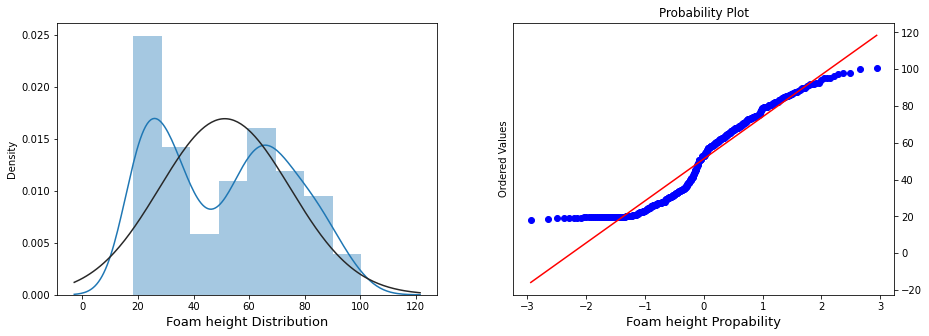

In [18]:
from scipy import stats

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
sns.distplot(data["Foam height(mm)"], fit= stats.norm, ax=ax[0])
stats.probplot(data["Foam height(mm)"], plot=plt)
ax[0].set_xlabel('Foam height Distribution', fontsize = 13)
ax[1].set_xlabel('Foam height Propability', fontsize = 13)
ax[1].yaxis.tick_right() # where the y axis marks will be

In [19]:
print("Skewness: {:.3f}".format(data["t(s)"].skew()))
print("Kurtosis: {:.3f}". format(data["t(s)"].kurt()))

Skewness: 2.037
Kurtosis: 3.246


C:\Users\harsh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


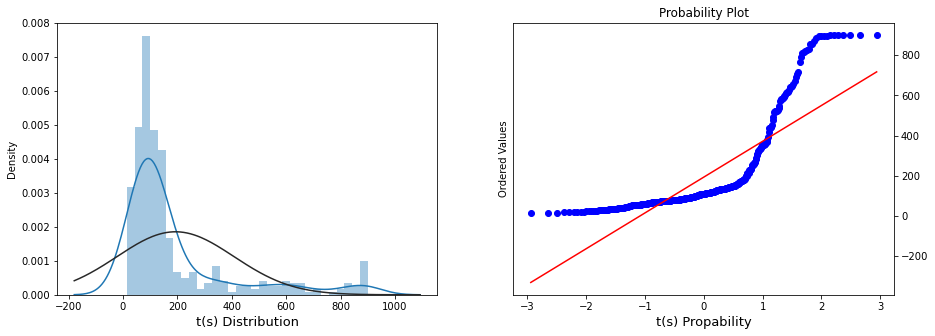

In [20]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
sns.distplot(data["t(s)"], fit= stats.norm, ax=ax[0])
stats.probplot(data["t(s)"], plot=plt)
ax[0].set_xlabel('t(s) Distribution', fontsize = 13)
ax[1].set_xlabel('t(s) Propability', fontsize = 13)
ax[1].yaxis.tick_right() # where the y axis marks will be

C:\Users\harsh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


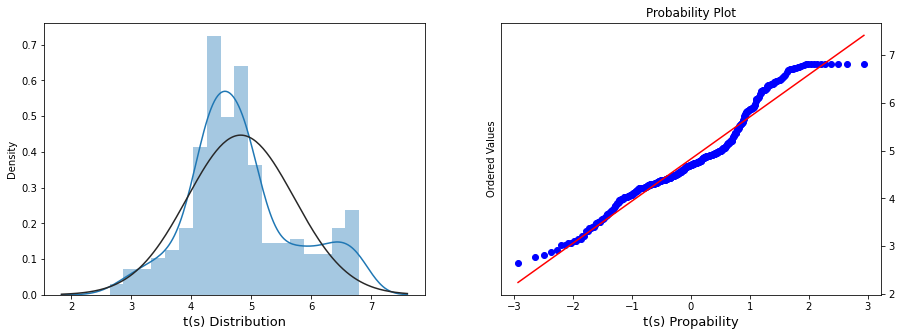

In [21]:
#Skewness and Kurtosis is much high therefore we have to take log of the values of the feature in order to compress the scale

data['t(s)'] = np.log(data['t(s)'])

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
sns.distplot(data['t(s)'], fit=stats.norm, ax=ax[0])
stats.probplot(data['t(s)'], plot=plt)
ax[0].set_xlabel('t(s) Distribution', fontsize = 13)
ax[1].set_xlabel('t(s) Propability', fontsize = 13)
ax[1].yaxis.tick_right() # where the y axis marks will be

In [22]:
print("Skewness: {:.3f}".format(data["t(s)"].skew()))
print("Kurtosis: {:.3f}". format(data["t(s)"].kurt()))

Skewness: 0.460
Kurtosis: -0.024


In [23]:
print("Skewness: {:.3f}".format(data["Height(mm)"].skew()))
print("Kurtosis: {:.3f}". format(data["Height(mm)"].kurt()))

Skewness: 16.750
Kurtosis: 309.080


C:\Users\harsh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


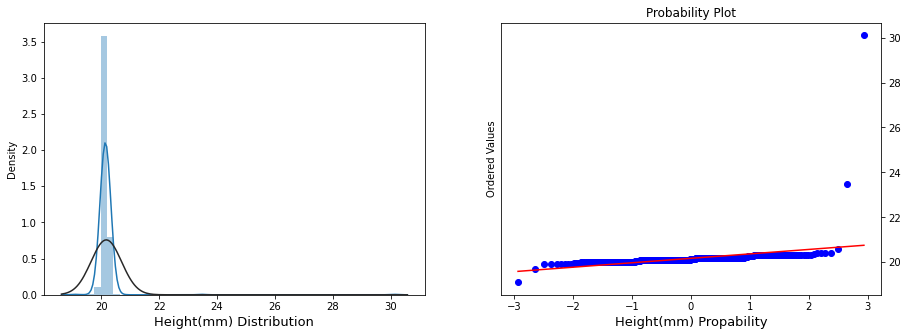

In [24]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
sns.distplot(data["Height(mm)"], fit= stats.norm, ax=ax[0])
stats.probplot(data["Height(mm)"], plot=plt)
ax[0].set_xlabel('Height(mm) Distribution', fontsize = 13)
ax[1].set_xlabel('Height(mm) Propability', fontsize = 13)
ax[1].yaxis.tick_right() # where the y axis marks will be

C:\Users\harsh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


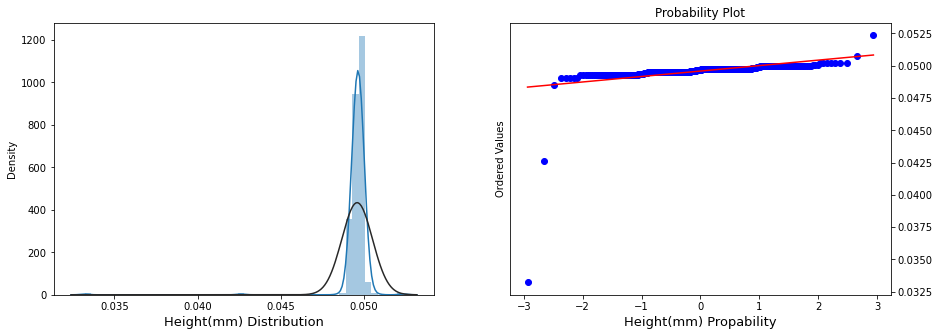

In [25]:
data['Height(mm)'] = np.reciprocal(data['Height(mm)'])

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
sns.distplot(data['Height(mm)'], fit=stats.norm, ax=ax[0])
stats.probplot(data['Height(mm)'], plot=plt)
ax[0].set_xlabel('Height(mm) Distribution', fontsize = 13)
ax[1].set_xlabel('Height(mm) Propability', fontsize = 13)
ax[1].yaxis.tick_right() # where the y axis marks will be

In [26]:
print("Skewness: {:.3f}".format(data["Height(mm)"].skew()))
print("Kurtosis: {:.3f}". format(data["Height(mm)"].kurt()))

Skewness: -14.558
Kurtosis: 249.316


C:\Users\harsh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\harsh\anaconda3\lib\site-packages\seaborn\distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


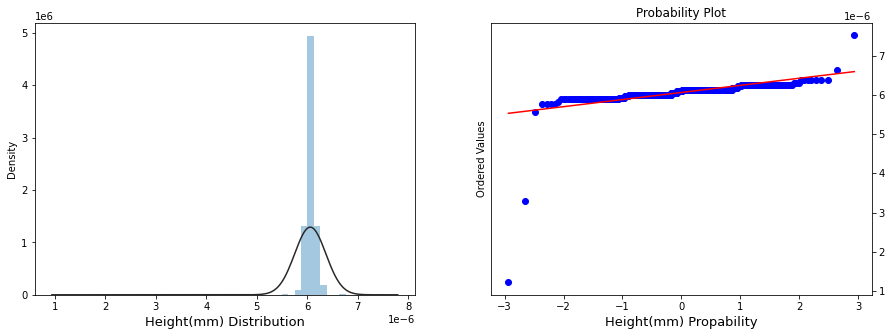

In [27]:
data['Height(mm)'] = np.power(data['Height(mm)'], 4)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
sns.distplot(data['Height(mm)'], fit=stats.norm, ax=ax[0])
stats.probplot(data['Height(mm)'], plot=plt)
ax[0].set_xlabel('Height(mm) Distribution', fontsize = 13)
ax[1].set_xlabel('Height(mm) Propability', fontsize = 13)
ax[1].yaxis.tick_right() # where the y axis marks will be

In [28]:
print("Skewness: {:.3f}".format(data["Height(mm)"].skew()))
print("Kurtosis: {:.3f}". format(data["Height(mm)"].kurt()))

Skewness: 0.000
Kurtosis: 0.000


In [29]:
print("Skewness: {:.3f}".format(data["RMI 30(ml)"].skew()))
print("Kurtosis: {:.3f}". format(data["RMI 30(ml)"].kurt()))

Skewness: 0.353
Kurtosis: -1.179


In [30]:
corr_df=data  #New dataframe to calculate correlation between features
cor= corr_df.corr(method='pearson')
print(cor)

                 Conc.(mg/ml)  Foamability(ml)  Foam height(mm)  RMI 30(ml)  \
Conc.(mg/ml)         1.000000         0.177949         0.178180    0.235269   
Foamability(ml)      0.177949         1.000000         0.999859    0.964727   
Foam height(mm)      0.178180         0.999859         1.000000    0.964710   
RMI 30(ml)           0.235269         0.964727         0.964710    1.000000   
t(s)                -0.013935         0.167509         0.168151    0.138676   
Height(mm)          -0.027036        -0.079991        -0.079914   -0.102121   
Temperature(°C)      0.004903         0.166727         0.165069    0.182234   

                     t(s)  Height(mm)  Temperature(°C)  
Conc.(mg/ml)    -0.013935   -0.027036         0.004903  
Foamability(ml)  0.167509   -0.079991         0.166727  
Foam height(mm)  0.168151   -0.079914         0.165069  
RMI 30(ml)       0.138676   -0.102121         0.182234  
t(s)             1.000000    0.066219         0.019804  
Height(mm)       0.066219

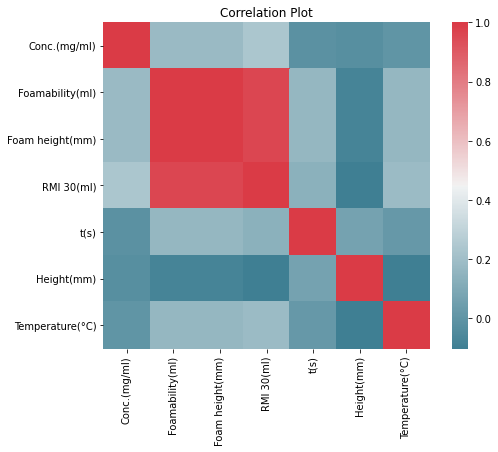

In [31]:
fig, ax =plt.subplots(figsize=(8, 6))
plt.title("Correlation Plot")
sns.heatmap(cor, mask=np.zeros_like(cor, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)
plt.show()

First Let's check the impact of feature Foamability(ml) on Adulterant

In [32]:
np.unique(data['Temperature(°C)'])

array([10, 26, 60], dtype=int64)

In [33]:
np.unique(data['Conc.(mg/ml)'])

array([  0,  10,  70, 150], dtype=int64)

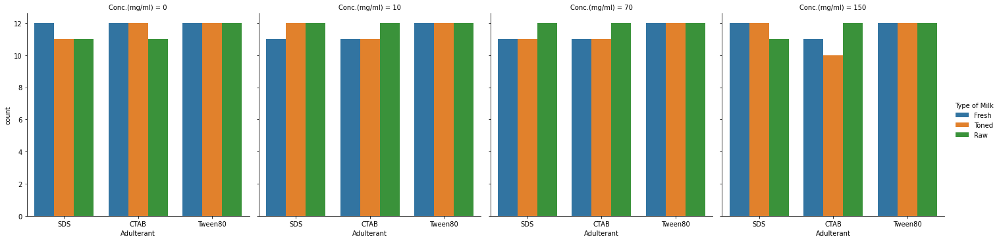

In [34]:
sns.catplot(x="Adulterant", hue="Type of Milk", col="Conc.(mg/ml)", data=data, kind="count", height=5, aspect=1)

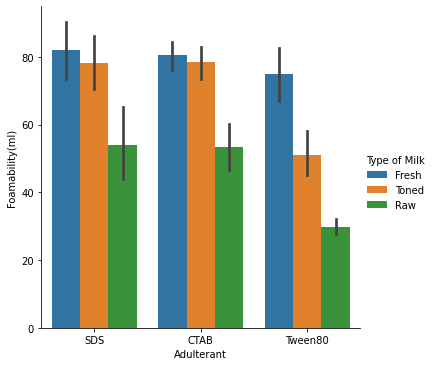

In [31]:
sns.catplot(data=data, y="Foamability(ml)", x="Adulterant", hue="Type of Milk" ,kind='bar')     #
plt.show()

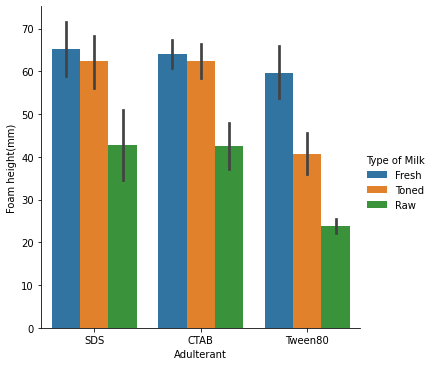

In [32]:
sns.catplot(data=data, y="Foam height(mm)", x="Adulterant", hue="Type of Milk" ,kind='bar')   #
plt.show()

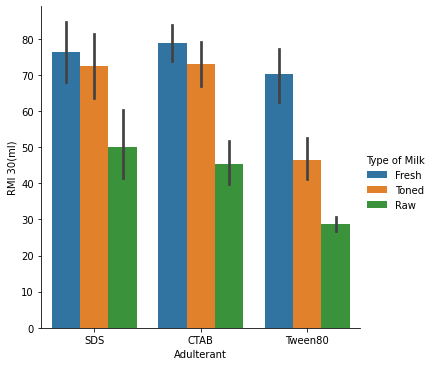

In [33]:
sns.catplot(data=data, y="RMI 30(ml)", x="Adulterant", hue="Type of Milk" ,kind='bar')            #
plt.show()

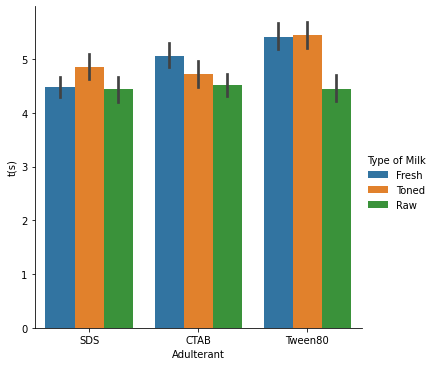

In [34]:
sns.catplot(data=data, y="t(s)", x="Adulterant", hue="Type of Milk" ,kind='bar')           #
plt.show()

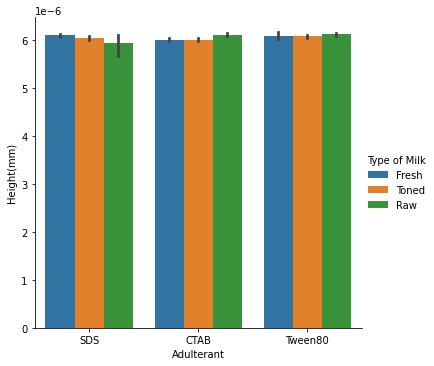

In [35]:
sns.catplot(data=data, y="Height(mm)", x="Adulterant", hue="Type of Milk" ,kind='bar')
plt.show()

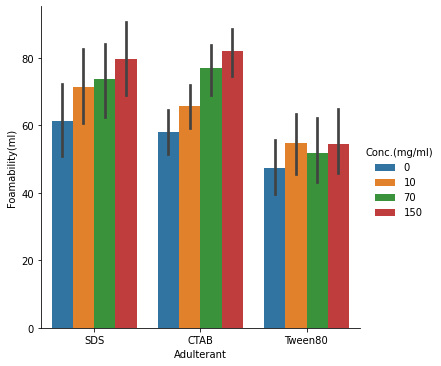

In [36]:
sns.catplot(data=data, y="Foamability(ml)", x="Adulterant", hue="Conc.(mg/ml)" ,kind='bar')   #
plt.show()

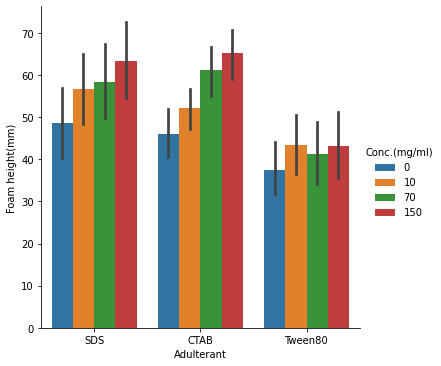

In [37]:
sns.catplot(data=data, y="Foam height(mm)", x="Adulterant", hue="Conc.(mg/ml)" ,kind='bar')            #
plt.show()

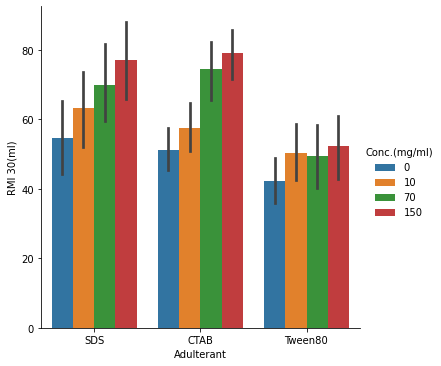

In [38]:
sns.catplot(data=data, y="RMI 30(ml)", x="Adulterant", hue="Conc.(mg/ml)" ,kind='bar')      #
plt.show()

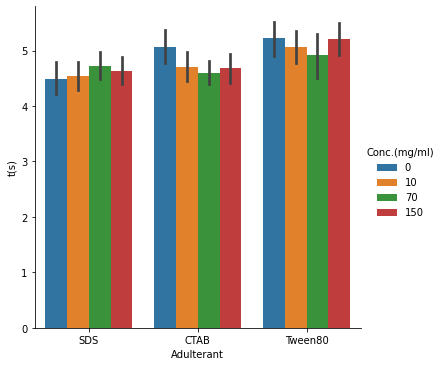

In [39]:
sns.catplot(data=data, y="t(s)", x="Adulterant", hue="Conc.(mg/ml)" ,kind='bar')             #
plt.show()

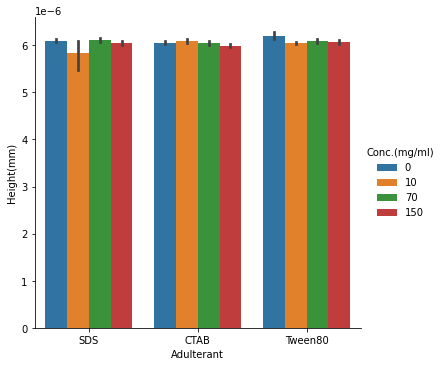

In [40]:
sns.catplot(data=data, y="Height(mm)", x="Adulterant", hue="Conc.(mg/ml)" ,kind='bar')           #
plt.show()

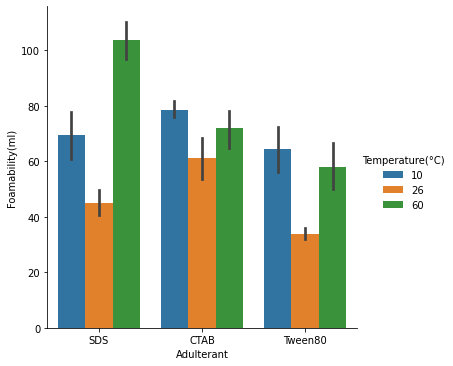

In [41]:
sns.catplot(data=data, y="Foamability(ml)", x="Adulterant", hue="Temperature(°C)" ,kind='bar')         #
plt.show()

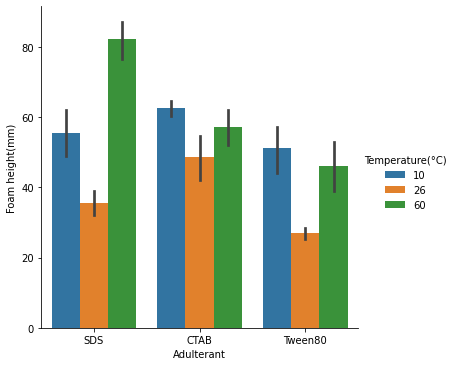

In [42]:
sns.catplot(data=data, y="Foam height(mm)", x="Adulterant", hue="Temperature(°C)" ,kind='bar')       #
plt.show()

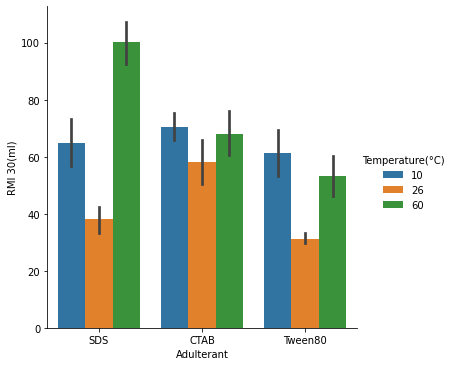

In [43]:
sns.catplot(data=data, y="RMI 30(ml)", x="Adulterant", hue="Temperature(°C)" ,kind='bar')          #
plt.show()

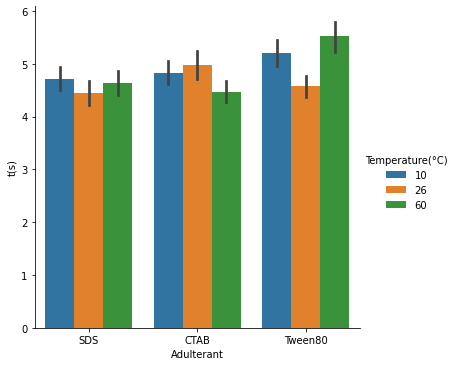

In [44]:
sns.catplot(data=data, y="t(s)", x="Adulterant", hue="Temperature(°C)" ,kind='bar')         #
plt.show()

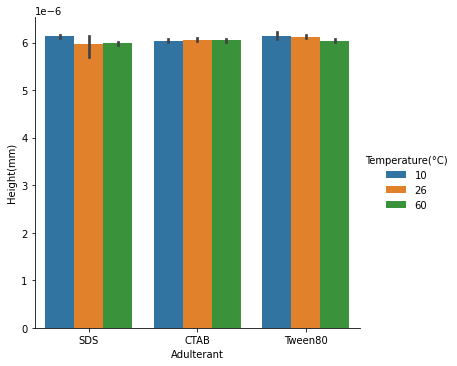

In [45]:
sns.catplot(data=data, y="Height(mm)", x="Adulterant", hue="Temperature(°C)" ,kind='bar')           #
plt.show()

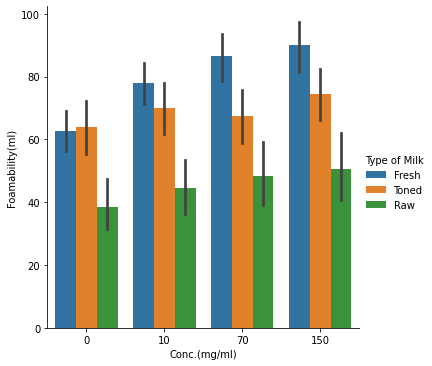

In [46]:
sns.catplot(data=data, y="Foamability(ml)", x="Conc.(mg/ml)", hue="Type of Milk" ,kind='bar')       #
plt.show()

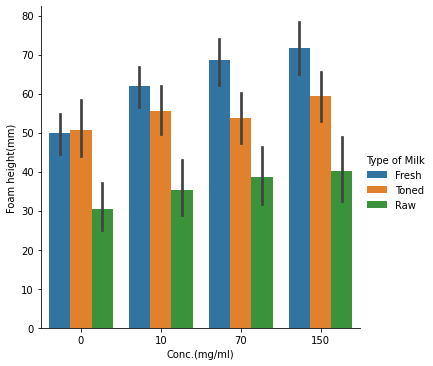

In [47]:
sns.catplot(data=data, y="Foam height(mm)", x="Conc.(mg/ml)", hue="Type of Milk" ,kind='bar')   #
plt.show()

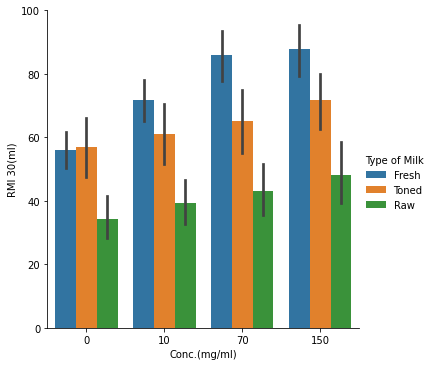

In [48]:
sns.catplot(data=data, y="RMI 30(ml)", x="Conc.(mg/ml)", hue="Type of Milk" ,kind='bar')     #
plt.show()

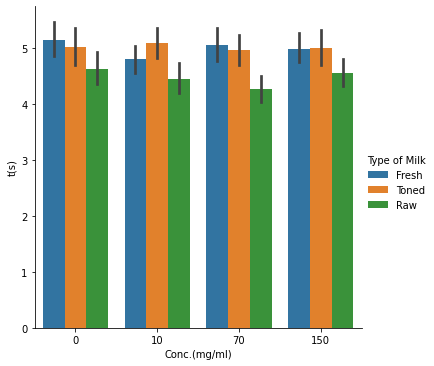

In [49]:
sns.catplot(data=data, y="t(s)", x="Conc.(mg/ml)", hue="Type of Milk" ,kind='bar')          #
plt.show()

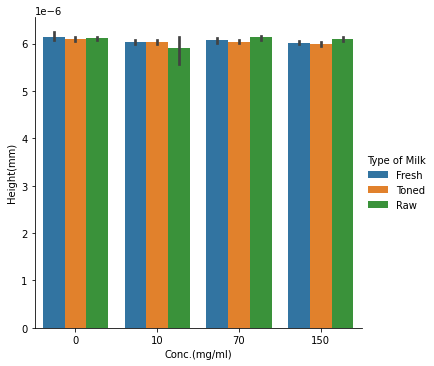

In [50]:
sns.catplot(data=data, y="Height(mm)", x="Conc.(mg/ml)", hue="Type of Milk" ,kind='bar')        #
plt.show()

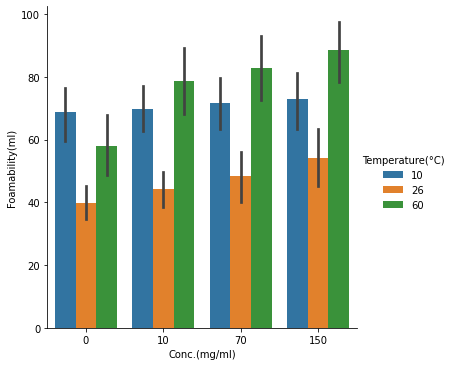

In [51]:
sns.catplot(data=data, y="Foamability(ml)", x="Conc.(mg/ml)", hue="Temperature(°C)" ,kind='bar')  #
plt.show()

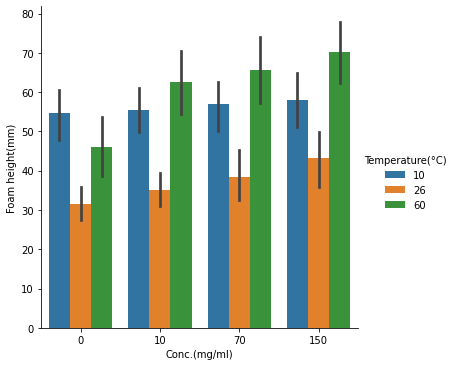

In [52]:
sns.catplot(data=data, y="Foam height(mm)", x="Conc.(mg/ml)", hue="Temperature(°C)" ,kind='bar')       #
plt.show()

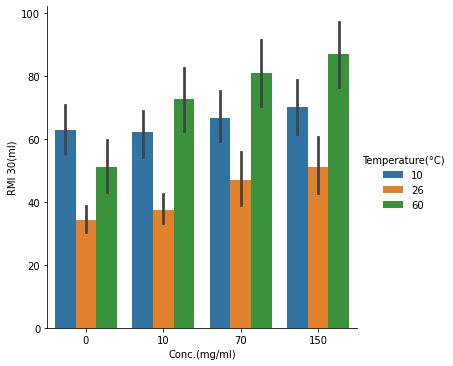

In [53]:
sns.catplot(data=data, y="RMI 30(ml)", x="Conc.(mg/ml)", hue="Temperature(°C)" ,kind='bar')          #
plt.show()

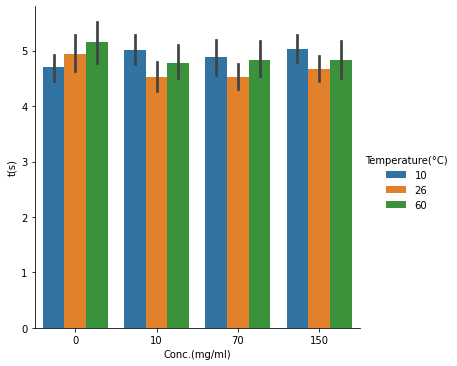

In [54]:
sns.catplot(data=data, y="t(s)", x="Conc.(mg/ml)", hue="Temperature(°C)" ,kind='bar')           #
plt.show()

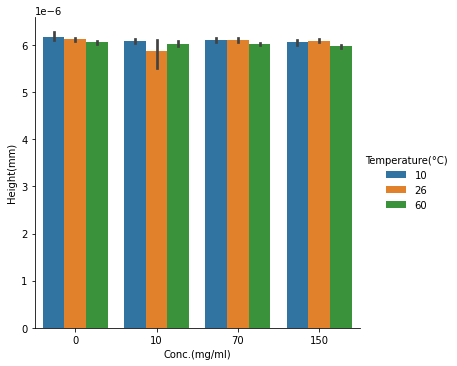

In [55]:
sns.catplot(data=data, y="Height(mm)", x="Conc.(mg/ml)", hue="Temperature(°C)" ,kind='bar')          #
plt.show()

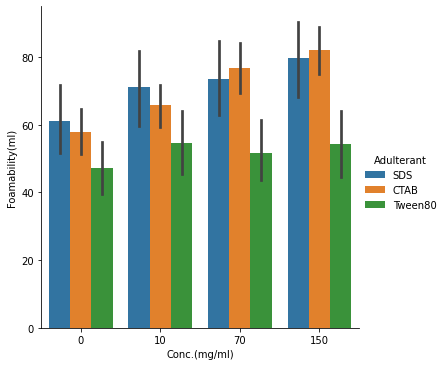

In [56]:
sns.catplot(data=data, y="Foamability(ml)", x="Conc.(mg/ml)", hue="Adulterant" ,kind='bar')        #
plt.show()

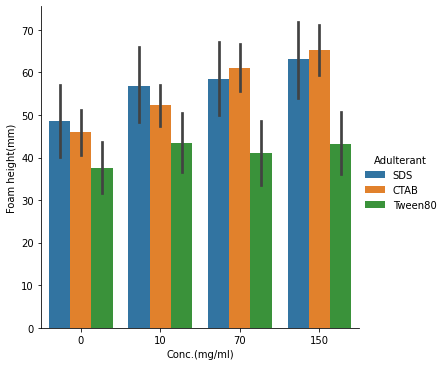

In [57]:
sns.catplot(data=data, y="Foam height(mm)", x="Conc.(mg/ml)", hue="Adulterant" ,kind='bar')         #
plt.show()

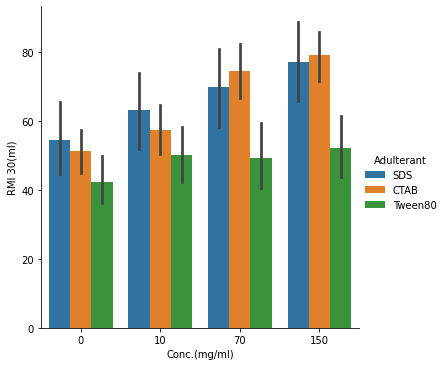

In [58]:
sns.catplot(data=data, y="RMI 30(ml)", x="Conc.(mg/ml)", hue="Adulterant" ,kind='bar')          #
plt.show()

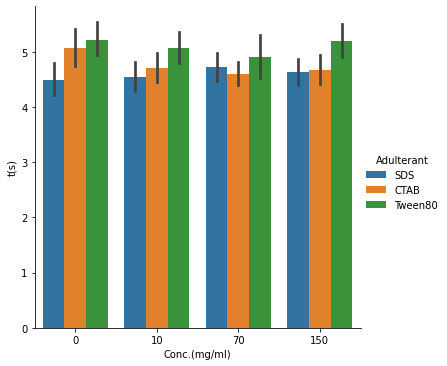

In [59]:
sns.catplot(data=data, y="t(s)", x="Conc.(mg/ml)", hue="Adulterant" ,kind='bar')        #
plt.show()

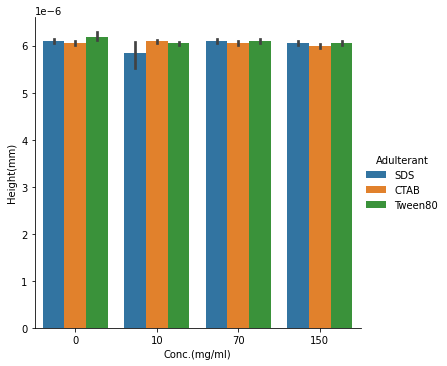

In [60]:
sns.catplot(data=data, y="Height(mm)", x="Conc.(mg/ml)", hue="Adulterant" ,kind='bar')           #
plt.show()

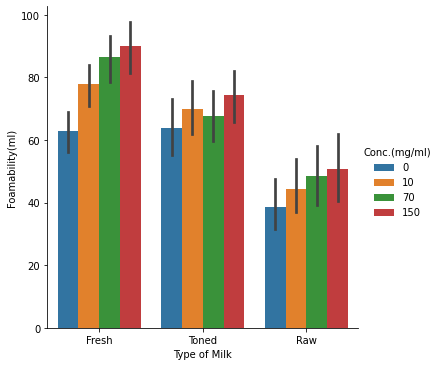

In [61]:
sns.catplot(data=data, y="Foamability(ml)", x="Type of Milk", hue="Conc.(mg/ml)" ,kind='bar')       #
plt.show()

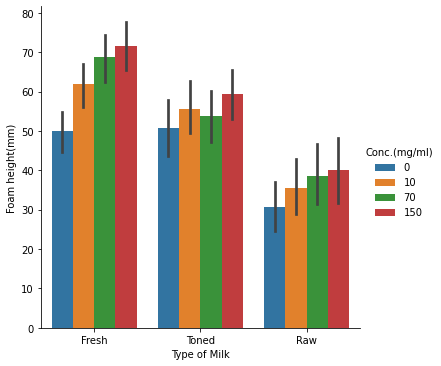

In [62]:
sns.catplot(data=data, y="Foam height(mm)", x="Type of Milk", hue="Conc.(mg/ml)" ,kind='bar')        #
plt.show()

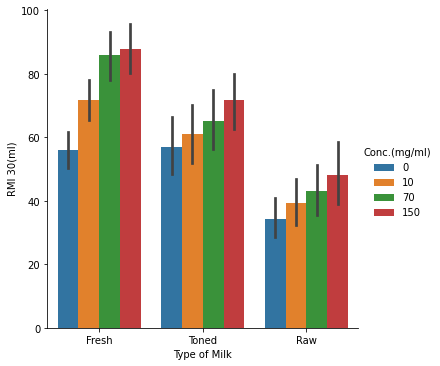

In [63]:
sns.catplot(data=data, y="RMI 30(ml)", x="Type of Milk", hue="Conc.(mg/ml)" ,kind='bar')        #
plt.show()

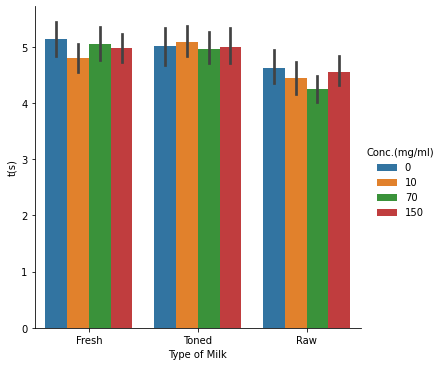

In [64]:
sns.catplot(data=data, y="t(s)", x="Type of Milk", hue="Conc.(mg/ml)" ,kind='bar')       #
plt.show()

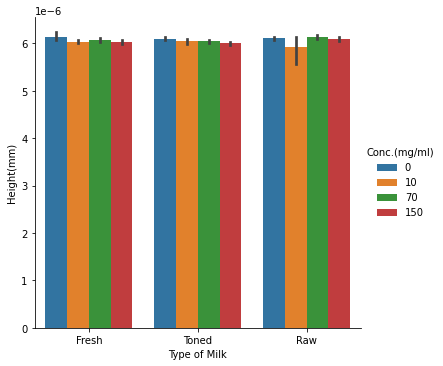

In [65]:
sns.catplot(data=data, y="Height(mm)", x="Type of Milk", hue="Conc.(mg/ml)" ,kind='bar')         #
plt.show()

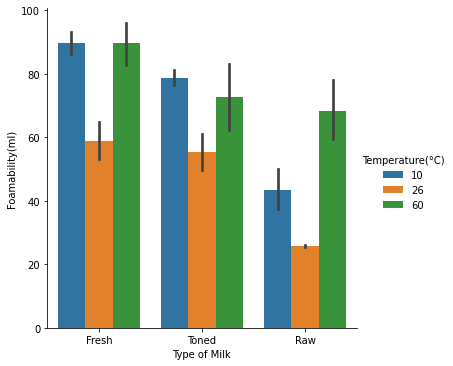

In [66]:
sns.catplot(data=data, y="Foamability(ml)", x="Type of Milk", hue="Temperature(°C)" ,kind='bar')      #
plt.show()

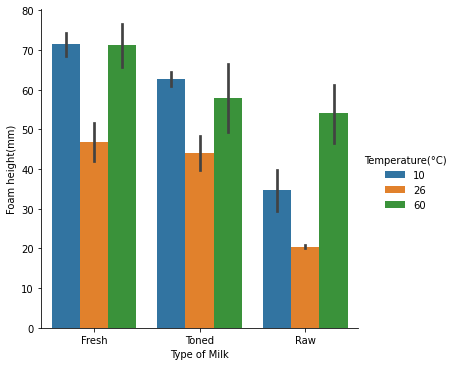

In [67]:
sns.catplot(data=data, y="Foam height(mm)", x="Type of Milk", hue="Temperature(°C)" ,kind='bar')
plt.show()

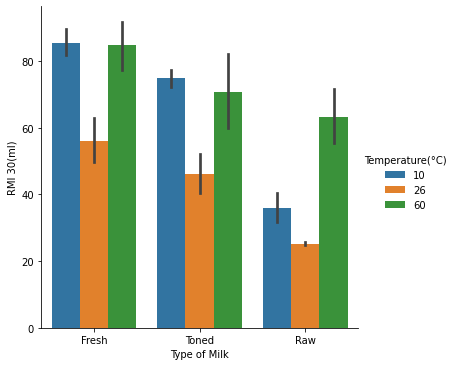

In [68]:
sns.catplot(data=data, y="RMI 30(ml)", x="Type of Milk", hue="Temperature(°C)" ,kind='bar')
plt.show()

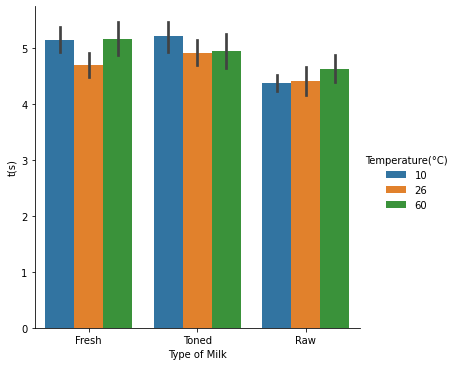

In [69]:
sns.catplot(data=data, y="t(s)", x="Type of Milk", hue="Temperature(°C)" ,kind='bar')
plt.show()

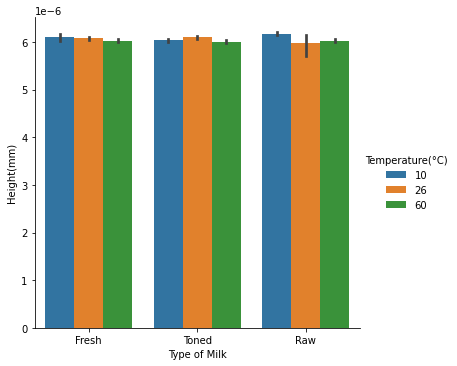

In [70]:
sns.catplot(data=data, y="Height(mm)", x="Type of Milk", hue="Temperature(°C)" ,kind='bar')
plt.show()

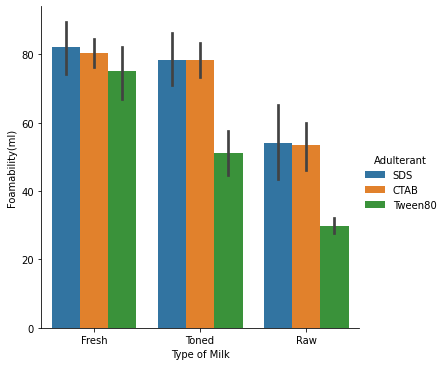

In [71]:
sns.catplot(data=data, y="Foamability(ml)", x="Type of Milk", hue="Adulterant" ,kind='bar')
plt.show()

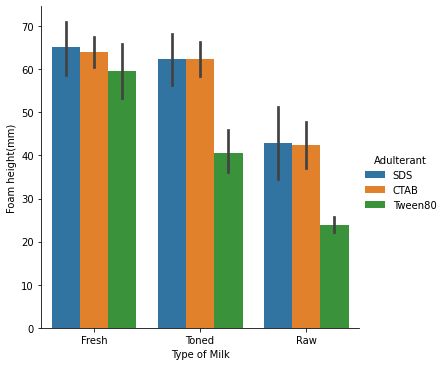

In [72]:
sns.catplot(data=data, y="Foam height(mm)", x="Type of Milk", hue="Adulterant" ,kind='bar')
plt.show()

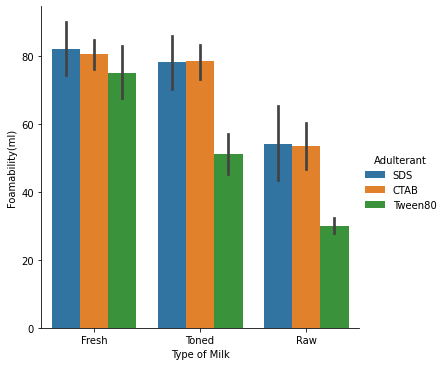

In [73]:
sns.catplot(data=data, y="Foamability(ml)", x="Type of Milk", hue="Adulterant" ,kind='bar')
plt.show()

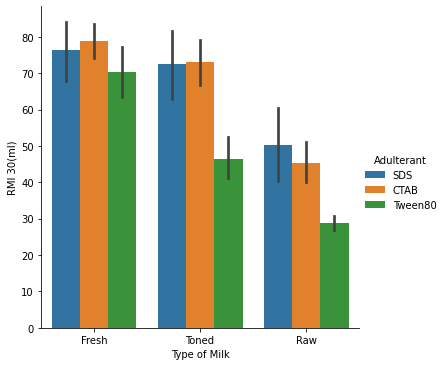

In [74]:
sns.catplot(data=data, y="RMI 30(ml)", x="Type of Milk", hue="Adulterant" ,kind='bar')
plt.show()

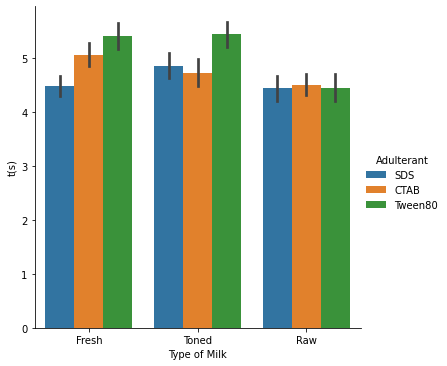

In [75]:

sns.catplot(data=data, y="t(s)", x="Type of Milk", hue="Adulterant" ,kind='bar')
plt.show()

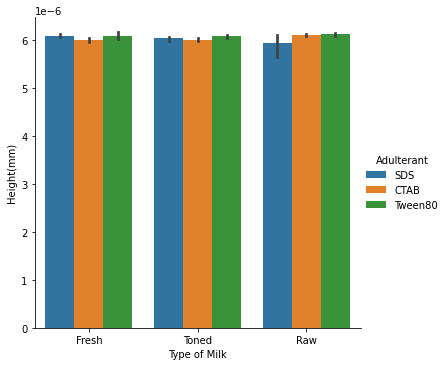

In [76]:
sns.catplot(data=data, y="Height(mm)", x="Type of Milk", hue="Adulterant" ,kind='bar')
plt.show()

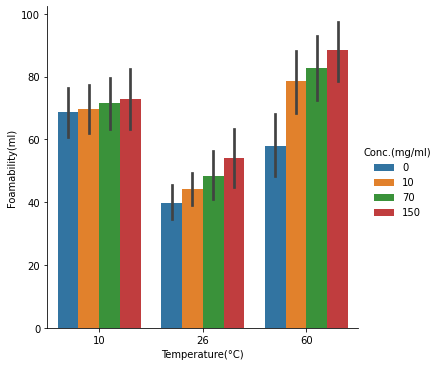

In [77]:
sns.catplot(data=data, y="Foamability(ml)", x="Temperature(°C)", hue="Conc.(mg/ml)" ,kind='bar')
plt.show()

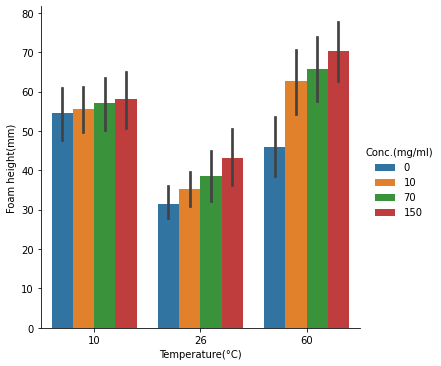

In [78]:
sns.catplot(data=data, y="Foam height(mm)", x="Temperature(°C)", hue="Conc.(mg/ml)" ,kind='bar')
plt.show()

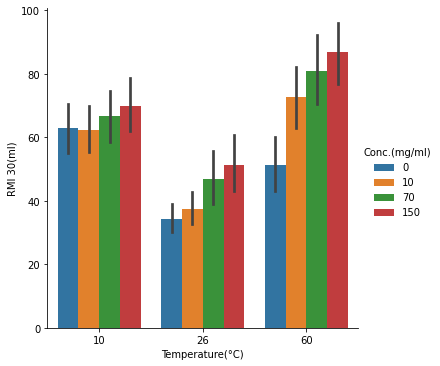

In [79]:
sns.catplot(data=data, y="RMI 30(ml)", x="Temperature(°C)", hue="Conc.(mg/ml)" ,kind='bar')
plt.show()

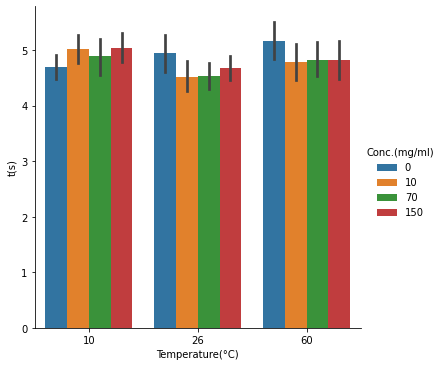

In [80]:
sns.catplot(data=data, y="t(s)", x="Temperature(°C)", hue="Conc.(mg/ml)" ,kind='bar')
plt.show()

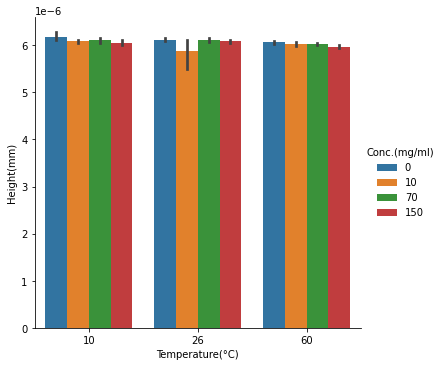

In [81]:
sns.catplot(data=data, y="Height(mm)", x="Temperature(°C)", hue="Conc.(mg/ml)" ,kind='bar')
plt.show()

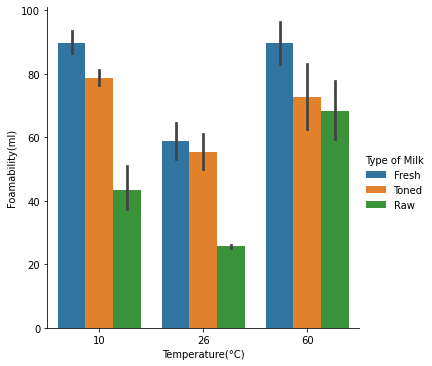

In [82]:
sns.catplot(data=data, y="Foamability(ml)", x="Temperature(°C)", hue="Type of Milk" ,kind='bar')
plt.show()

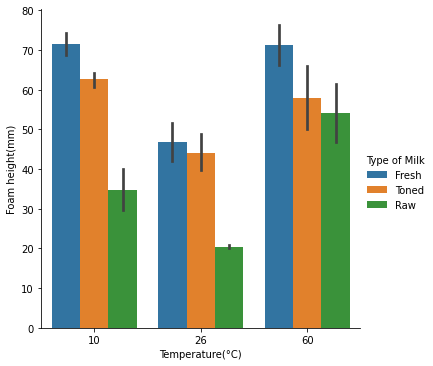

In [83]:
sns.catplot(data=data, y="Foam height(mm)", x="Temperature(°C)", hue="Type of Milk" ,kind='bar')
plt.show()

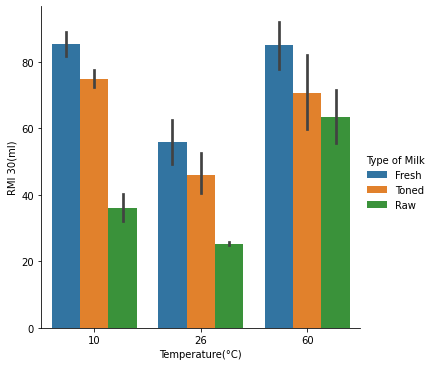

In [84]:
sns.catplot(data=data, y="RMI 30(ml)", x="Temperature(°C)", hue="Type of Milk" ,kind='bar')
plt.show()

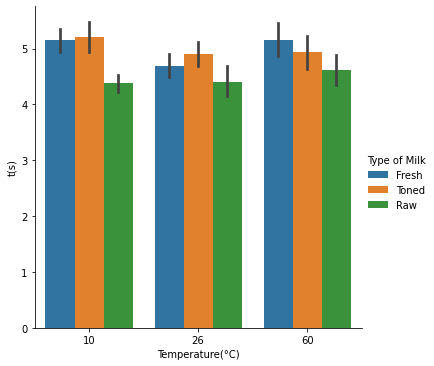

In [85]:
sns.catplot(data=data, y="t(s)", x="Temperature(°C)", hue="Type of Milk" ,kind='bar')
plt.show()

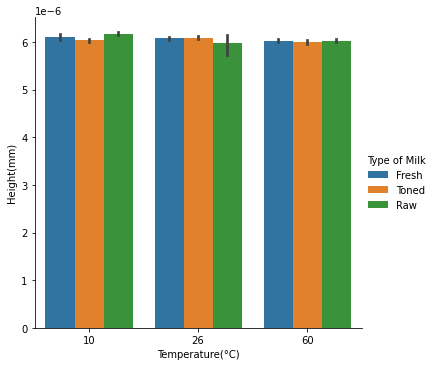

In [86]:
sns.catplot(data=data, y="Height(mm)", x="Temperature(°C)", hue="Type of Milk" ,kind='bar')
plt.show()

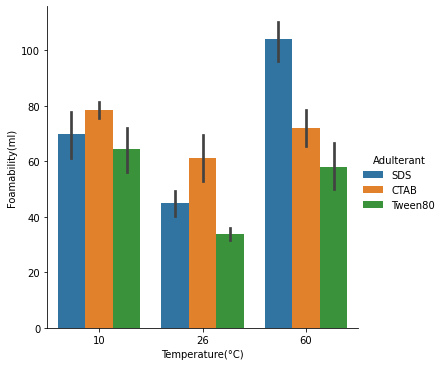

In [87]:
sns.catplot(data=data, y="Foamability(ml)", x="Temperature(°C)", hue="Adulterant" ,kind='bar')
plt.show()

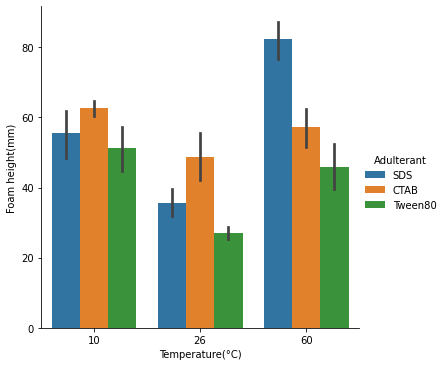

In [88]:
sns.catplot(data=data, y="Foam height(mm)", x="Temperature(°C)", hue="Adulterant" ,kind='bar')
plt.show()

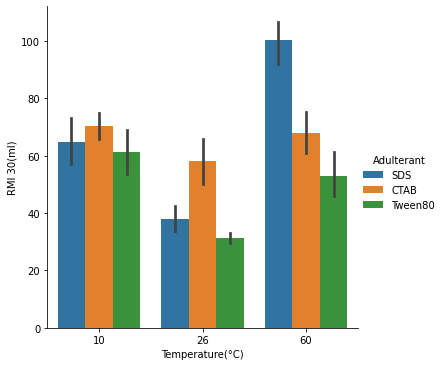

In [89]:
sns.catplot(data=data, y="RMI 30(ml)", x="Temperature(°C)", hue="Adulterant" ,kind='bar')
plt.show()

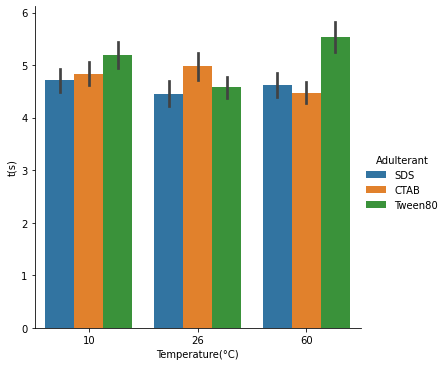

In [90]:
sns.catplot(data=data, y="t(s)", x="Temperature(°C)", hue="Adulterant" ,kind='bar')
plt.show()

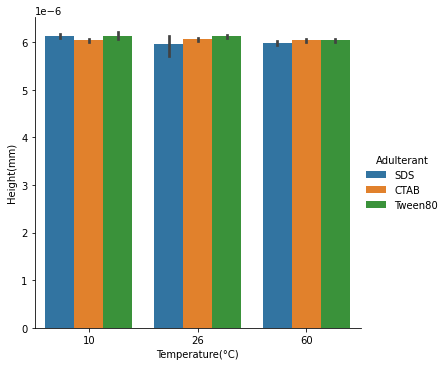

In [91]:
sns.catplot(data=data, y="Height(mm)", x="Temperature(°C)", hue="Adulterant" ,kind='bar')
plt.show()

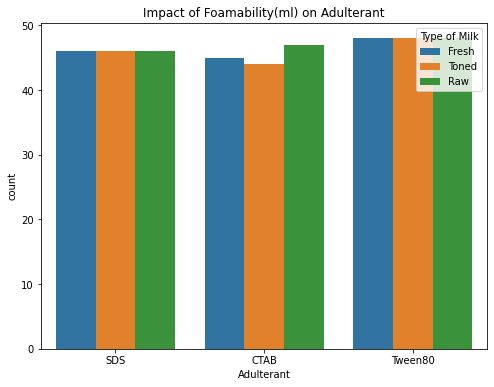

In [92]:
fig, ax=plt.subplots(figsize=(8,6))
sns.countplot(x='Adulterant', data=data, hue='Type of Milk')
plt.title("Impact of Foamability(ml) on Adulterant")
plt.show()

C:\Users\harsh\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


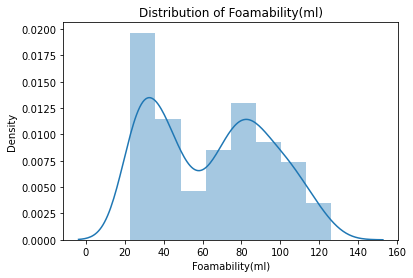

In [93]:
plt.title("Distribution of Foamability(ml)")
ax = sns.distplot(data["Foamability(ml)"])

In [94]:
def box_plot(column):
    data.boxplot(by="Adulterant",column=[column],grid=True)

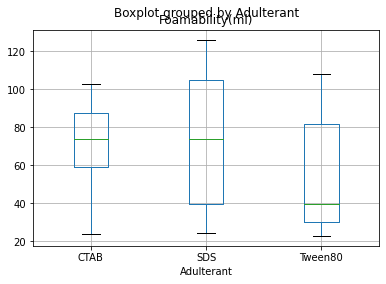

In [95]:
box_plot("Foamability(ml)")

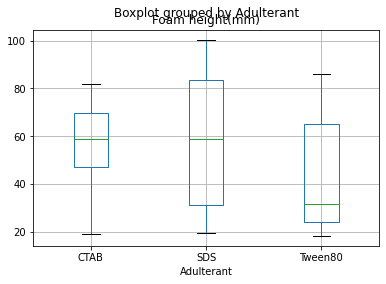

In [96]:
box_plot("Foam height(mm)")

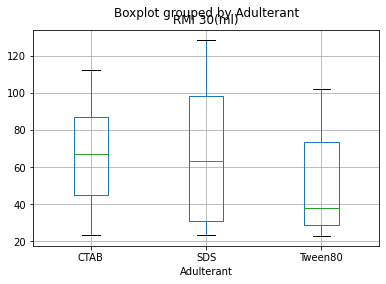

In [97]:
box_plot("RMI 30(ml)")

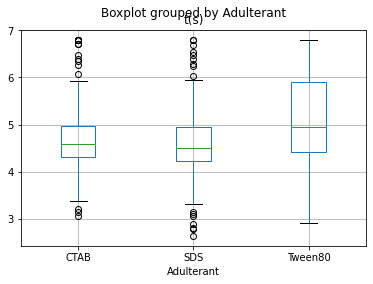

In [98]:
box_plot("t(s)")

In [99]:
data.nlargest(10,["t(s)"])

,Conc.(mg/ml),Type of Milk,Foamability(ml),Foam height(mm),RMI 30(ml),t(s),Height(mm),Temperature(°C),Adulterant
163,70,Fresh,91.9,73.1,91.4,6.801505,0.000006,10,CTAB
299,70,Fresh,90.8,72.2,90.1,6.801505,0.000006,10,Tween80
372,0,Raw,24.9,19.8,24.2,6.801505,0.000006,26,Tween80
47,0,Toned,43.8,34.8,25.1,6.801394,0.000006,26,SDS
209,150,Toned,91.9,73.2,82.5,6.801394,0.000006,10,CTAB
229,0,Raw,24.5,19.5,24.4,6.801394,0.000006,26,CTAB
314,70,Fresh,103.2,82.1,98.0,6.801394,0.000006,60,Tween80
368,150,Toned,39.8,31.7,39.9,6.800393,0.000006,60,Tween80
169,0,Fresh,66.6,53.0,57.0,6.800281,0.000006,60,CTAB
187,10,Toned,71.8,57.1,62.4,6.800281,0.000006,26,CTAB


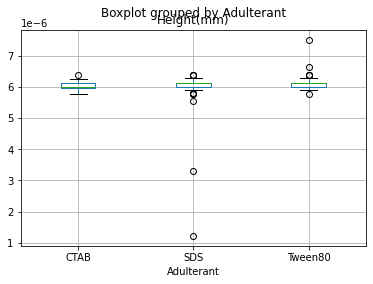

In [100]:
box_plot("Height(mm)")

In [101]:
data.nlargest(50,["Height(mm)"])

,Conc.(mg/ml),Type of Milk,Foamability(ml),Foam height(mm),RMI 30(ml),t(s),Height(mm),Temperature(°C),Adulterant
290,0,Fresh,75.90,60.40,73.20,5.298817,0.000008,10,Tween80
293,0,Fresh,78.33,62.33,75.57,5.282340,0.000007,10,Tween80
26,70,Fresh,108.90,86.70,106.90,4.906755,0.000006,10,SDS
116,70,Raw,34.00,27.10,31.80,4.768988,0.000006,10,SDS
120,150,Raw,32.80,26.10,32.70,4.332048,0.000006,10,SDS
146,70,Fresh,93.90,74.70,93.30,4.970508,0.000006,26,CTAB
378,70,Raw,25.80,20.50,24.40,3.765840,0.000006,26,Tween80
380,70,Raw,23.50,18.70,24.00,4.053523,0.000006,26,Tween80
400,150,Raw,24.80,19.70,25.10,4.146304,0.000006,10,Tween80
119,70,Raw,33.90,27.00,32.80,4.400971,0.000006,10,SDS


In [102]:
# Dropping some of the points which are considered as outliers
#data=data.drop([98], axis=0)
#data.shape

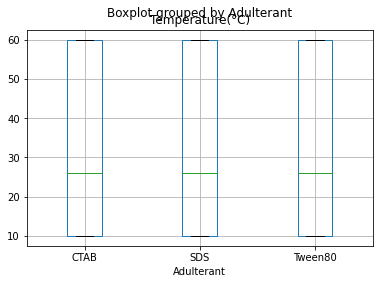

In [103]:
box_plot("Temperature(°C)")

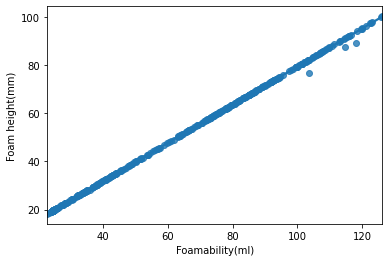

In [104]:
sns.regplot(data=data, x='Foamability(ml)', y='Foam height(mm)')
plt.show()

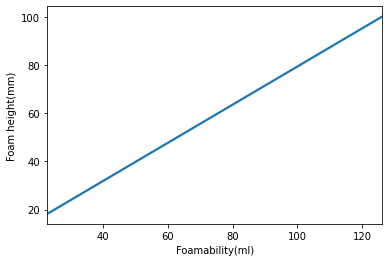

In [105]:
sns.regplot(data=data, x='Foamability(ml)', y='Foam height(mm)', scatter=False)
plt.show()

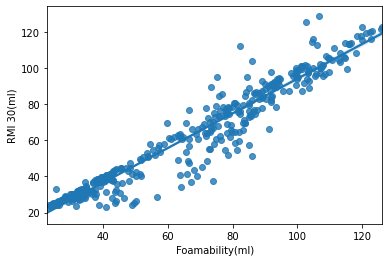

In [106]:
sns.regplot(data=data, x='Foamability(ml)', y='RMI 30(ml)')
plt.show()

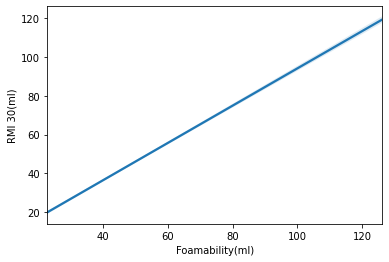

In [107]:
sns.regplot(data=data, x='Foamability(ml)', y='RMI 30(ml)', scatter = False)
plt.show()

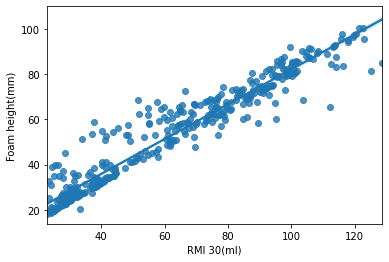

In [108]:
sns.regplot(data=data, x='RMI 30(ml)', y='Foam height(mm)')
plt.show()

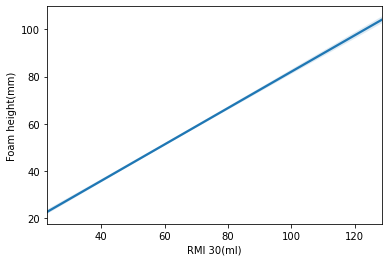

In [109]:
sns.regplot(data=data, x='RMI 30(ml)', y='Foam height(mm)', scatter=False)
plt.show()

Neural Network

In [35]:
import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten, BatchNormalization
from keras.layers.advanced_activations import ELU
import os
from keras.optimizers import RMSprop, SGD, Adam
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

In [36]:
def getModel (row_length, num_class):
    model = Sequential()
    model.add(Dense(512, activation='relu', input_dim = row_length))
    model.add(BatchNormalization())
    model.add(Dropout (0.3))

    model.add(Dense(512, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout (0.3))

    model.add(Dense(256, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout (0.3))

    model.add(Dense(256, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout (0.3))

    model.add(Dense(128, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout (0.3))

    model.add(Dense(128, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout (0.3))

    model.add(Dense(64, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout (0.3))

    model.add(Dense(32, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout (0.3))

    model.add(Dense(num_class, activation='softmax'))

    model.compile (loss = 'categorical_crossentropy',
        optimizer = 'adam',
        metrics=['accuracy'])
    return model

In [37]:
Classification = ['svm', 'randomForestClassifier', 'naiveBayes', 'gbm', 'nn']

In [38]:
import lightgbm as lgb

In [39]:
from sklearn.svm import SVC, SVR
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, GradientBoostingClassifier
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import StratifiedKFold, KFold, GridSearchCV, ParameterGrid, train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, accuracy_score, mean_squared_error, confusion_matrix
import numpy as np
#import cPickle as cpkl
import argparse
import keras
from keras import regularizers
from keras.models import Model, Sequential
from keras.layers import Input, Dense, Dropout, Activation, BatchNormalization
from keras.wrappers.scikit_learn import KerasClassifier, KerasRegressor
from keras.callbacks import EarlyStopping
from sys import argv
from collections import defaultdict
#import ConfigParser


def factory(model):
       
        
    if model == 'svm':
        param_grid = [{"kernel": ["linear","rbf"],"gamma":[1, 0.1, 0.01],"C":[0.001, 0.1, 1]}]
        svc = SVC(probability = True)
        return param_grid, svc
    elif model == 'randomForestClassifier':
        param_grid = [{'max_depth': [ 25,50,100], 'min_samples_leaf': [1, 2, 4], 'min_samples_split': [2, 5, 10] , 
                       'n_estimators': [600, 800, 1200]  }]
        rfc = RandomForestClassifier(random_state=42)
        return param_grid, rfc
    elif model == "naiveBayes":
        param_grid = [ ]
        gnb = GaussianNB()
        return param_grid, gnb
    elif model == 'gbm':
        param_grid = [{"learning_rate": [0.1, 1, 10], "min_samples_split": [300, 400, 100],
                      "max_depth":[5,10, 15], "n_estimators":[300, 400, 100] }]
        gbm = GradientBoostingClassifier()
        return param_grid, gbm
    elif model == 'xgb':
        param_grid = [{'gamma': [0, 1, 2], 'subsample': [0.6, 0.8, 1.0], 'n_estimators': [100, 200, 500],       
                      'max_depth': [1, 2, 3], 'learning_rate': [10,3,1,0.1, 0.01]}]
        xgb = XGBClassifier(nthread =4,   #when use hyperthread, xgboost may become slower
             #objective ='binary:logistic'  , min_child_weight= 11, silent = 1, colsample_bytree = 0.7, 
              seed =1337)
        return param_grid, xgb
    elif model == 'DecTree':
        param_grid = [{"criterion": ['gini', 'entropy'], 'max_depth': [10, 50, 100], 'min_samples_split': [10,50,100],  'min_samples_leaf': [10,50,100]} ]
        dec = DecisionTreeClassifier()
        return param_grid, dec
    elif model == 'nn':
        param_grid = [ ]
        nn = getModel(row_len, num_classes)
        return param_grid, nn
    elif model == 'LogisticRegression':
        param_grid = [{"penalty":['l2'],"C":[ 10, 1.0, 0.1, 0.01] , "solver":['saga']}]
        logreg = LogisticRegression()
        return param_grid, logreg
    elif model == 'lgb':
        param_grid = {
                  'num_leaves': [31, 127],
                  'reg_alpha': [0.1, 0.5],
                  'min_data_in_leaf': [30, 300, 400],
                  'lambda_l1': [0, 1, 1.5],
                   'lambda_l2': [0, 1]}
        lgb_estimator = lgb.LGBMClassifier(boosting_type='gbdt',  objective='binary', num_boost_round=2000, learning_rate=0.01)
        return param_grid, lgb_estimator
    else:
        assert 0, "Choose from : " + "'svm', 'randomForestClassifier', 'naiveBayes', 'gbm', 'xgb','nn'" 

In [40]:
from sklearn import metrics
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.multiclass import OneVsRestClassifier


https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-imbalanced-classification/
https://medium.com/apprentice-journal/evaluating-multi-class-classifiers-12b2946e755b#:~:text=Cohen's%20Kappa,the%20actual%20and%20predicted%20classes


In [72]:
# function to run grid search cv and stratified kfold on the model
def run_cv(model, X, y,label_names,param_grid,outer_folds = 5):
    i=1
    kf = StratifiedKFold(n_splits=outer_folds,random_state=1,shuffle=True)
    train_acc = []
    validation_acc = [] 
    X_tr, X_te, y_tr, y_te = train_test_split(X,y,test_size=0.2)

        
    for train_index,test_index in kf.split(X_tr,y_tr):
        print('\n{} of kfold {}'.format(i,kf.n_splits))
        xtr,xvl = X_tr.iloc[train_index],X_tr.iloc[test_index]
        ytr,yvl = y_tr[train_index],y_tr[test_index]
        
        model_grid = GridSearchCV( model, param_grid, cv=10,scoring=None,iid=True)
        model1 = OneVsRestClassifier(model_grid)
        model1.fit(xtr, ytr)
        
        train_pred = model1.predict(xtr)
        validation_pred = model1.predict(xvl)
        test_pred = model1.predict(X_te)
        
        print('Train_accuracy_score',accuracy_score(ytr,train_pred))        
        print('Validation_accuracy_score',accuracy_score(yvl,validation_pred))
        print('Test_accuracy_score',accuracy_score(y_te, test_pred))
        
        train_acc.append(accuracy_score(ytr,train_pred))
        validation_acc.append(accuracy_score(yvl,validation_pred))        
        i+=1
        train_accuracy = train_acc
        validation_accuracy = validation_acc
        train_accuracy_mean = np.mean(train_acc)
        validation_accuracy_mean = np.mean(validation_acc)
        
        test_accuracy = accuracy_score(y_te, test_pred)
        
        # Output Confusion Matrix of the testset
        conf_matrix = metrics.confusion_matrix(y_te, test_pred)
        sns.heatmap(conf_matrix, annot=True)
        plt.show()
        
        target_names = list(map(str, label_names))
        print(target_names)
        print(metrics.classification_report(y_te, test_pred, target_names=target_names))  
        
        y_prob = model1.predict_proba(X_te)     
        
        
        
        macro_roc_auc_ovo = roc_auc_score(y_te, y_prob, multi_class="ovo",
                                          average="macro")
        weighted_roc_auc_ovo = roc_auc_score(y_te, y_prob, multi_class="ovo",
                                             average="weighted")
        macro_roc_auc_ovr = roc_auc_score(y_te, y_prob, multi_class="ovr",
                                          average="macro")
        weighted_roc_auc_ovr = roc_auc_score(y_te, y_prob, multi_class="ovr",
                                             average="weighted")
        print("One-vs-One ROC AUC scores:\n{:.6f} (macro),\n{:.6f} "
              "(weighted by prevalence)"
              .format(macro_roc_auc_ovo, weighted_roc_auc_ovo))
        print("One-vs-Rest ROC AUC scores:\n{:.6f} (macro),\n{:.6f} "
              "(weighted by prevalence)"
              .format(macro_roc_auc_ovr, weighted_roc_auc_ovr))

                
        
        fpr = {}
        tpr = {}
        thresh ={}
        roc_auc = {}

        n_class = len(label_names)

        for i in range(n_class):    
            fpr[i], tpr[i], thresh[i] = roc_curve(y_te, y_prob[:,i], pos_label=i)
            roc_auc[i] = auc(fpr[i],tpr[i])
    
        print(roc_auc)
        # plotting    
        plt.plot(fpr[0], tpr[0], linestyle='--',color='orange', label= str(label_names[0]) + ' vs Rest')
        plt.plot(fpr[1], tpr[1], linestyle='--',color='green', label= str(label_names[1]) + ' vs Rest')
        plt.plot(fpr[2], tpr[2], linestyle='--',color='blue', label= str(label_names[2]) + ' vs Rest')
 #       plt.plot(fpr[3], tpr[3], linestyle='--',color='red', label= str(label_names[3])+ ' mg/ml' + ' vs Rest')
        plt.title('Multiclass ROC curve')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive rate')
        plt.legend(loc='best')
        plt.show()
        
    # Printing Roc auc score again after completing folds    
        
    test_pred_final = model1.predict(X_te)
    print('Test_accuracy_score',accuracy_score(y_te, test_pred_final))
    # Output Confusion Matrix of the testset
    conf_matrix_final = metrics.confusion_matrix(y_te, test_pred_final)
    sns.heatmap(conf_matrix_final, annot=True)
    plt.show()
        
    target_names = list(map(str, label_names))
    print(metrics.classification_report(y_te, test_pred_final, target_names=target_names))
        
    y_prob_final = model1.predict_proba(X_te)
    
    macro_roc_auc_ovo_final = roc_auc_score(y_te, y_prob_final, multi_class="ovo",
                                          average="macro")
    weighted_roc_auc_ovo_final = roc_auc_score(y_te, y_prob_final, multi_class="ovo",
                                         average="weighted")
    macro_roc_auc_ovr_final = roc_auc_score(y_te, y_prob_final, multi_class="ovr",
                                      average="macro")
    weighted_roc_auc_ovr_final = roc_auc_score(y_te, y_prob_final, multi_class="ovr",
                                         average="weighted")
    print("One-vs-One ROC AUC scores:\n{:.6f} (macro),\n{:.6f} "
          "(weighted by prevalence)"
          .format(macro_roc_auc_ovo_final, weighted_roc_auc_ovo_final))
    print("One-vs-Rest ROC AUC scores:\n{:.6f} (macro),\n{:.6f} "
          "(weighted by prevalence)"
          .format(macro_roc_auc_ovr_final, weighted_roc_auc_ovr_final))
    
    # roc curve for classes
    fpr_final = {}
    tpr_final = {}
    thresh_final ={}
    roc_auc_final = {}

    n_class = len(label_names)

    for i in range(n_class):    
        fpr_final[i], tpr_final[i], thresh_final[i] = roc_curve(y_te, y_prob_final[:,i], pos_label=i)
        roc_auc_final[i] = auc(fpr_final[i],tpr_final[i])
    
    print(roc_auc_final)
    # plotting    
    plt.plot(fpr_final[0], tpr_final[0], linestyle='--',color='orange', label= str(label_names[0])+ ' vs Rest')
    plt.plot(fpr_final[1], tpr_final[1], linestyle='--',color='green', label= str(label_names[1]) + ' vs Rest')
    plt.plot(fpr_final[2], tpr_final[2], linestyle='--',color='blue', label= str(label_names[2]) + ' vs Rest')
#    plt.plot(fpr_final[3], tpr_final[3], linestyle='--',color='red', label= str(label_names[3])+ ' mg/ml' + ' vs Rest')
    plt.title('Multiclass ROC curve')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive rate')
    plt.legend(loc='best')
    plt.show()
   
    
    
    
    return train_accuracy , validation_accuracy, train_accuracy_mean, validation_accuracy_mean, test_accuracy

In [57]:
# function to run neural network

def run_nn(model1, X, y, label_names,batch_size = 32, epochs = 500,shuffle=True):
      
    # Train model using 5 fold cross_validation
    accs = []
    cross_val_n_splits = 5
    curr_split = 1
    skf = KFold(n_splits=cross_val_n_splits, random_state = 12345)
    X_tr, X_te, y_tr, y_te = train_test_split(X,y,test_size=0.2)
    
    for train_index, test_index in skf.split(X_tr, y_tr):
        print ('-----Cross Validation {0}/{1}-----'.format(curr_split, cross_val_n_splits))
        X_train, y_train = X_tr.iloc[train_index], y_tr[train_index]
        X_test, y_test = X_tr.iloc[test_index], y_tr[test_index]
        Y_train = y_train
        Y_test = y_test
#        nn_model = OneVsRestClassifier(model1)       #getModel(row_len, num_classes)
        nn_model = model1 
#       cp_callback = ModelCheckpoint (cp_filepath, monitor="val_acc", save_best_only=True)
        history = nn_model.fit(X_train, Y_train, epochs = epochs , batch_size = batch_size, validation_data = (X_test, Y_test))
    
    y_true = np.argmax(y_te, axis = -1)
   
    y_pred = np.argmax(nn_model.predict(X_te, batch_size=1), axis=-1)
    print('Test_accuracy_score',accuracy_score(y_true, y_pred))
    print ("Confusion Matrix, cross val split {}".format(curr_split))
    
    # Output Confusion Matrix of the testset
    conf_matrix = confusion_matrix(y_true, y_pred)
    sns.heatmap(conf_matrix, annot=True)
    plt.show()
    
    # Plotting accuracy and validation accuracy 
    acc_train = history.history['accuracy']
    acc_val = history.history['val_accuracy']
    epochs = range(1,501)
    plt.plot(epochs, acc_train, 'g', label='Training accuracy')
    plt.plot(epochs, acc_val, 'b', label='validation accuracy')
    plt.title('Training and Validation acuracy')
    plt.xlabel('Epochs')
    plt.ylabel('accuracy')
    plt.legend()
    plt.show()
    
    curr_split += 1
    
    
    target_names = list(map(str, label_names))
    print(metrics.classification_report(y_true, y_pred, target_names=target_names))

    y_prob = nn_model.predict_proba(X_te)     



    macro_roc_auc_ovo = roc_auc_score(y_true, y_prob, multi_class="ovo",
                                      average="macro")
    weighted_roc_auc_ovo = roc_auc_score(y_true, y_prob, multi_class="ovo",
                                         average="weighted")
    macro_roc_auc_ovr = roc_auc_score(y_true, y_prob, multi_class="ovr",
                                      average="macro")
    weighted_roc_auc_ovr = roc_auc_score(y_true, y_prob, multi_class="ovr",
                                         average="weighted")
    print("One-vs-One ROC AUC scores:\n{:.6f} (macro),\n{:.6f} "
          "(weighted by prevalence)"
          .format(macro_roc_auc_ovo, weighted_roc_auc_ovo))
    print("One-vs-Rest ROC AUC scores:\n{:.6f} (macro),\n{:.6f} "
          "(weighted by prevalence)"
          .format(macro_roc_auc_ovr, weighted_roc_auc_ovr))



    fpr = {}
    tpr = {}
    thresh ={}
    roc_auc = {}

    n_class = len(target_names)
    

    for i in range(n_class):    
        fpr[i], tpr[i], thresh[i] = roc_curve(y_true, y_prob[:,i], pos_label=i)
        roc_auc[i] = auc(fpr[i],tpr[i])

    print(roc_auc)
    # plotting    
    plt.plot(fpr[0], tpr[0], linestyle='--',color='orange', label= str(label_names[0]) + ' vs Rest')  # + ' mg/ml'
    plt.plot(fpr[1], tpr[1], linestyle='--',color='green', label= str(label_names[1]) + ' vs Rest')
    plt.plot(fpr[2], tpr[2], linestyle='--',color='blue', label= str(label_names[2]) + ' vs Rest')
#    plt.plot(fpr[3], tpr[3], linestyle='--',color='red', label= str(label_names[3])+ ' mg/ml' + ' vs Rest')
    plt.title('Multiclass ROC curve')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive rate')
    plt.legend(loc='best')
    plt.show()

print ('----- Done -----')

----- Done -----


In [58]:
numerical_features = ['Foamability(ml)', 'Foam height(mm)', 'RMI 30(ml)', 't(s)', 'Height(mm)']
categorical_features = ['Conc.(mg/ml)', 'Type of Milk', 'Temperature(°C)', 'Adulterant']

In [59]:
Classification = ['svm', 'randomForestClassifier', 'naiveBayes', 'gbm', 'xgb','nn']

In [60]:
# Label Encoder on target variable for classification
from sklearn.preprocessing import label_binarize

def transform_y(y):
    le = preprocessing.LabelEncoder()
    w = le.fit(y)
    y = le.transform(y)
    label_names = list(le.classes_)
    return y, label_names    

In [61]:
# Onehot Encoder on target variable for neural network  

def transform_y_nn(y):
    
    values = np.array(y)
    # integer encode
    label_encoder = LabelEncoder()
    integer_encoded = label_encoder.fit_transform(values)
    label_names = list(label_encoder.classes_)
    # binary encode
    onehot_encoder = OneHotEncoder(sparse=False)
    integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
    onehot_encoded = onehot_encoder.fit_transform(integer_encoded)
    
    return onehot_encoded, label_names


In [62]:
def prep_data(data, feat):
    y = data[feat]
    cat_feat = categorical_features.copy()
    cat_feat.remove(feat)
    data = pd.get_dummies(data, columns = cat_feat)
    X = data.copy()
    X = X.drop(feat, axis=1)
    scaler = StandardScaler().fit(X)
    x_transformed= pd.DataFrame(scaler.transform(X))
    y, label_names = transform_y(y)
    
    return x_transformed, y, label_names        

In [63]:
def prep_data_nn(data, feat):
    cat_feat = categorical_features.copy()
    y = data[feat]
    cat_feat.remove(feat)
    data = pd.get_dummies(data, columns = cat_feat)
    X = data.copy()
    X = X.drop(feat, axis=1)
    scaler = StandardScaler().fit(X)
    x_transformed= pd.DataFrame(scaler.transform(X))
    y, label_names = transform_y_nn(y)
    
    return x_transformed, y, label_names

In [64]:
# Function to train data when gridsearch is not used for model
from sklearn.model_selection import train_test_split

def training(classifier, X, y, label_names):
    X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.30, random_state=42)
    classifier.fit(X_train, y_train)
    y_train_pred = classifier.predict(X_train)
    y_test_pred = classifier.predict(X_test)
    train_acc = accuracy_score(y_train_pred, y_train,)
    test_acc = accuracy_score(y_test_pred, y_test)
    
    # Output Confusion Matrix of the testset
    conf_matrix = confusion_matrix(y_test_pred, y_test)
    sns.heatmap(conf_matrix, annot=True)
    plt.show()
    
    target_names = list(map(str, label_names))
    print(metrics.classification_report(y_test, y_test_pred, target_names=target_names))

    y_prob = classifier.predict_proba(X_test)     



    macro_roc_auc_ovo = roc_auc_score(y_test, y_prob, multi_class="ovo",
                                      average="macro")
    weighted_roc_auc_ovo = roc_auc_score(y_test, y_prob, multi_class="ovo",
                                         average="weighted")
    macro_roc_auc_ovr = roc_auc_score(y_test, y_prob, multi_class="ovr",
                                      average="macro")
    weighted_roc_auc_ovr = roc_auc_score(y_test, y_prob, multi_class="ovr",
                                         average="weighted")
    print("One-vs-One ROC AUC scores:\n{:.6f} (macro),\n{:.6f} "
          "(weighted by prevalence)"
          .format(macro_roc_auc_ovo, weighted_roc_auc_ovo))
    print("One-vs-Rest ROC AUC scores:\n{:.6f} (macro),\n{:.6f} "
          "(weighted by prevalence)"
          .format(macro_roc_auc_ovr, weighted_roc_auc_ovr))



    fpr = {}
    tpr = {}
    thresh ={}

    n_class = len(label_names)

    for i in range(n_class):    
        fpr[i], tpr[i], thresh[i] = roc_curve(y_test, y_prob[:,i], pos_label=i)
        

    # plotting    
    plt.plot(fpr[0], tpr[0], linestyle='--',color='orange', label= str(label_names[0])+ ' mg/ml' + ' vs Rest')
    plt.plot(fpr[1], tpr[1], linestyle='--',color='green', label= str(label_names[1])+ ' mg/ml' + ' vs Rest')
    plt.plot(fpr[2], tpr[2], linestyle='--',color='blue', label= str(label_names[2])+ ' mg/ml' + ' vs Rest')
#    plt.plot(fpr[3], tpr[3], linestyle='--',color='red', label= str(label_names[3])+ ' mg/ml' + ' vs Rest')
    plt.title('Multiclass ROC curve')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive rate')
    plt.legend(loc='best')
    plt.show()
    
    return train_acc, test_acc

In [65]:
def run(model, use_grid):
    
    
    if model == 'nn':
        
        
        X, y, label_names = prep_data_nn(data, feat)
        
        
        row_len = X.shape[1]
        num_classes = y.shape[1]
        mod = getModel(row_len, num_classes)
        run_nn(mod, X, y, label_names)
    
    else:
        param_grid, model1 = factory(model)
        X, y, label_names = prep_data(data, feat)
                
        if use_grid == True and len(param_grid)!=0:     # Use gridsearch cv if param_grid is not empty 
            tr_acc, valid_acc, tr_acc_mean, valid_acc_mean, test_acc = run_cv(model1, X, y, label_names, param_grid)
            print(tr_acc)
            print(valid_acc)
            print(tr_acc_mean)
            print(valid_acc_mean)
            print(test_acc)
        else:
            X, y, label_names = prep_data(data, feat)
            tr_acc, te_acc = training( model1, X, y, label_names)
            print(tr_acc)
            print(te_acc)
 

Using models for classification of Adulterant feature

In [73]:
model = 'DecTree'
feat = 'Adulterant'


1 of kfold 5


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.8164794007490637
Validation_accuracy_score 0.6567164179104478
Test_accuracy_score 0.6190476190476191


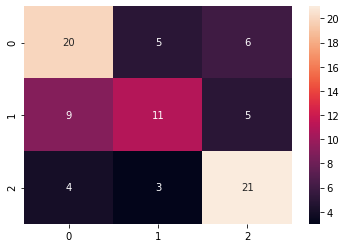

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.61      0.65      0.62        31
         SDS       0.58      0.44      0.50        25
     Tween80       0.66      0.75      0.70        28

    accuracy                           0.62        84
   macro avg       0.61      0.61      0.61        84
weighted avg       0.61      0.62      0.61        84

One-vs-One ROC AUC scores:
0.746805 (macro),
0.746466 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.746464 (macro),
0.746061 (weighted by prevalence)
{0: 0.7121119902617163, 1: 0.7233898305084746, 2: 0.8038903061224489}


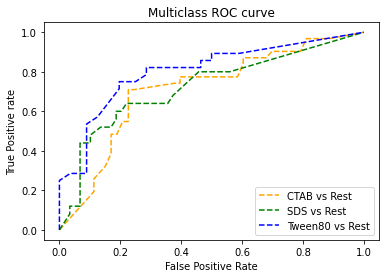


2 of kfold 5


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.8352059925093633
Validation_accuracy_score 0.6268656716417911
Test_accuracy_score 0.5595238095238095


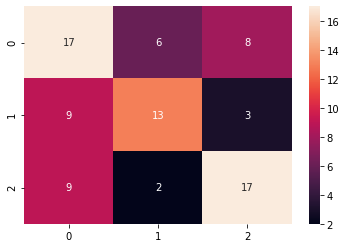

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.49      0.55      0.52        31
         SDS       0.62      0.52      0.57        25
     Tween80       0.61      0.61      0.61        28

    accuracy                           0.56        84
   macro avg       0.57      0.56      0.56        84
weighted avg       0.57      0.56      0.56        84



C:\Users\harsh\anaconda3\lib\site-packages\sklearn\multiclass.py:382: RuntimeWarning: invalid value encountered in true_divide
  Y /= np.sum(Y, axis=1)[:, np.newaxis]


ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

In [74]:
if __name__ == '__main__':
    run(model, use_grid=True)


1 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.7733333333333333
Validation_accuracy_score 0.5882352941176471
Test_accuracy_score 0.6666666666666666


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


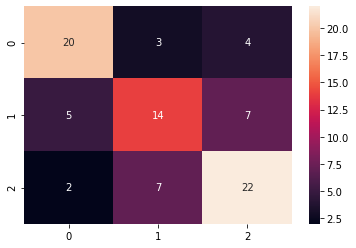

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.74      0.74      0.74        27
         SDS       0.58      0.54      0.56        26
     Tween80       0.67      0.71      0.69        31

    accuracy                           0.67        84
   macro avg       0.66      0.66      0.66        84
weighted avg       0.66      0.67      0.67        84

One-vs-One ROC AUC scores:
0.835489 (macro),
0.835321 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.835098 (macro),
0.835398 (weighted by prevalence)
{0: 0.8879142300194932, 1: 0.7877984084880637, 2: 0.8295800365185637}


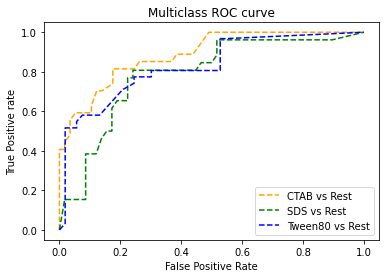


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.7966666666666666
Validation_accuracy_score 0.7058823529411765
Test_accuracy_score 0.6904761904761905


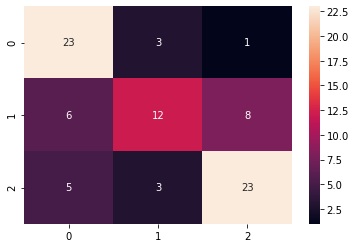

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.68      0.85      0.75        27
         SDS       0.67      0.46      0.55        26
     Tween80       0.72      0.74      0.73        31

    accuracy                           0.69        84
   macro avg       0.69      0.69      0.68        84
weighted avg       0.69      0.69      0.68        84

One-vs-One ROC AUC scores:
0.861111 (macro),
0.862721 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.863229 (macro),
0.865323 (weighted by prevalence)
{0: 0.9152046783625731, 1: 0.7864721485411141, 2: 0.8880097382836276}


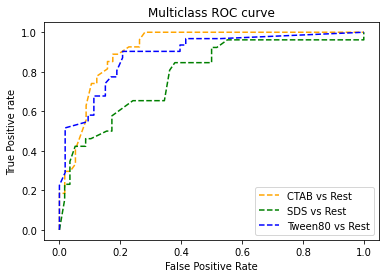


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.78
Validation_accuracy_score 0.6470588235294118
Test_accuracy_score 0.6547619047619048


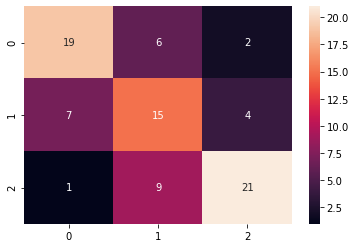

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.70      0.70      0.70        27
         SDS       0.50      0.58      0.54        26
     Tween80       0.78      0.68      0.72        31

    accuracy                           0.65        84
   macro avg       0.66      0.65      0.65        84
weighted avg       0.67      0.65      0.66        84

One-vs-One ROC AUC scores:
0.822374 (macro),
0.823874 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.824124 (macro),
0.826568 (weighted by prevalence)
{0: 0.903183885640026, 1: 0.7198275862068966, 2: 0.8493609251369446}


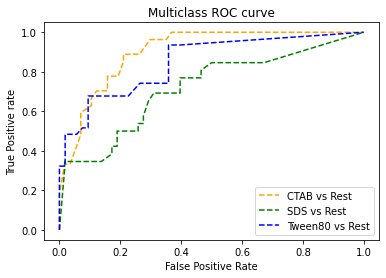


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.8033333333333333
Validation_accuracy_score 0.6470588235294118
Test_accuracy_score 0.7261904761904762


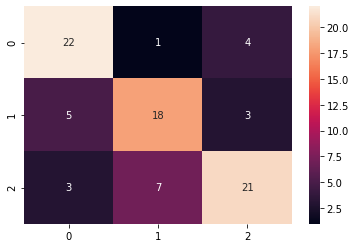

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.73      0.81      0.77        27
         SDS       0.69      0.69      0.69        26
     Tween80       0.75      0.68      0.71        31

    accuracy                           0.73        84
   macro avg       0.73      0.73      0.73        84
weighted avg       0.73      0.73      0.73        84

One-vs-One ROC AUC scores:
0.859059 (macro),
0.859398 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.858932 (macro),
0.860652 (weighted by prevalence)
{0: 0.9113060428849902, 1: 0.7881299734748012, 2: 0.8773584905660379}


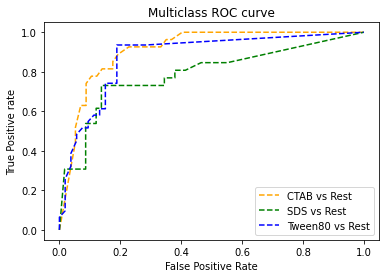


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.813953488372093
Validation_accuracy_score 0.6060606060606061
Test_accuracy_score 0.7142857142857143


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


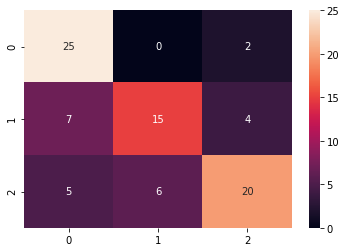

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.68      0.93      0.78        27
         SDS       0.71      0.58      0.64        26
     Tween80       0.77      0.65      0.70        31

    accuracy                           0.71        84
   macro avg       0.72      0.72      0.71        84
weighted avg       0.72      0.71      0.71        84

One-vs-One ROC AUC scores:
0.821064 (macro),
0.821579 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.821302 (macro),
0.823005 (weighted by prevalence)
{0: 0.8788174139051331, 1: 0.746684350132626, 2: 0.8384053560559952}


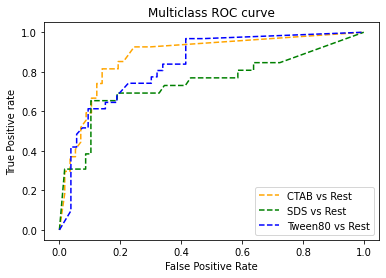


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.8239202657807309
Validation_accuracy_score 0.5757575757575758
Test_accuracy_score 0.75


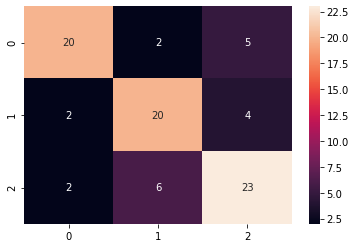

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.83      0.74      0.78        27
         SDS       0.71      0.77      0.74        26
     Tween80       0.72      0.74      0.73        31

    accuracy                           0.75        84
   macro avg       0.76      0.75      0.75        84
weighted avg       0.75      0.75      0.75        84

One-vs-One ROC AUC scores:
0.899301 (macro),
0.898755 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.898772 (macro),
0.897742 (weighted by prevalence)
{0: 0.9223521767381416, 1: 0.8972148541114058, 2: 0.8767498478393183}


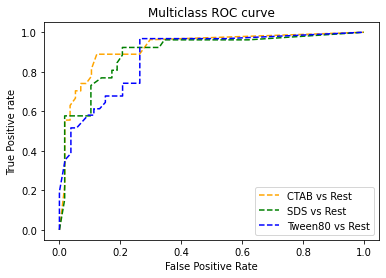


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.7940199335548173
Validation_accuracy_score 0.5757575757575758
Test_accuracy_score 0.6666666666666666


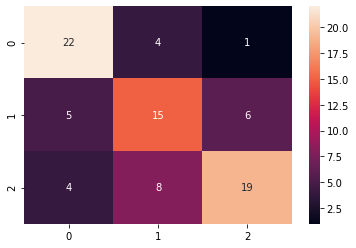

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.71      0.81      0.76        27
         SDS       0.56      0.58      0.57        26
     Tween80       0.73      0.61      0.67        31

    accuracy                           0.67        84
   macro avg       0.67      0.67      0.66        84
weighted avg       0.67      0.67      0.67        84

One-vs-One ROC AUC scores:
0.831120 (macro),
0.831957 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.831990 (macro),
0.833612 (weighted by prevalence)
{0: 0.9041585445094217, 1: 0.7470159151193634, 2: 0.844796104686549}


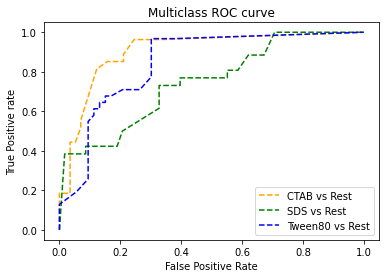


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.8006644518272426
Validation_accuracy_score 0.6060606060606061
Test_accuracy_score 0.7261904761904762


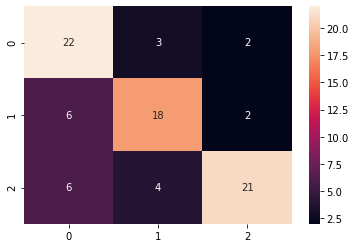

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.65      0.81      0.72        27
         SDS       0.72      0.69      0.71        26
     Tween80       0.84      0.68      0.75        31

    accuracy                           0.73        84
   macro avg       0.74      0.73      0.73        84
weighted avg       0.74      0.73      0.73        84

One-vs-One ROC AUC scores:
0.871783 (macro),
0.872649 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.872598 (macro),
0.874378 (weighted by prevalence)
{0: 0.8674463937621832, 1: 0.846816976127321, 2: 0.9035301278149728}


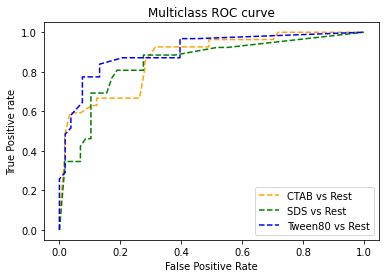


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.7508305647840532
Validation_accuracy_score 0.7575757575757576
Test_accuracy_score 0.6309523809523809


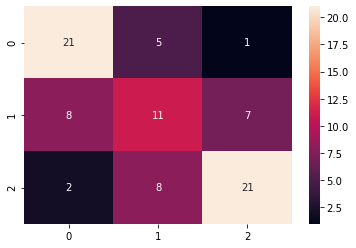

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.68      0.78      0.72        27
         SDS       0.46      0.42      0.44        26
     Tween80       0.72      0.68      0.70        31

    accuracy                           0.63        84
   macro avg       0.62      0.63      0.62        84
weighted avg       0.63      0.63      0.63        84

One-vs-One ROC AUC scores:
0.799498 (macro),
0.803268 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.804196 (macro),
0.809464 (weighted by prevalence)
{0: 0.8976608187134503, 1: 0.6409151193633952, 2: 0.8740109555690809}


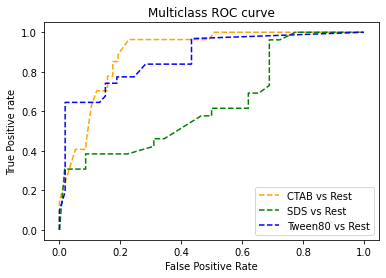


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.7641196013289037
Validation_accuracy_score 0.5757575757575758
Test_accuracy_score 0.6309523809523809


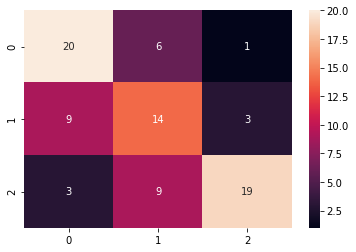

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.62      0.74      0.68        27
         SDS       0.48      0.54      0.51        26
     Tween80       0.83      0.61      0.70        31

    accuracy                           0.63        84
   macro avg       0.64      0.63      0.63        84
weighted avg       0.66      0.63      0.64        84

One-vs-One ROC AUC scores:
0.840881 (macro),
0.842299 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.841849 (macro),
0.845611 (weighted by prevalence)
{0: 0.8905133203378818, 1: 0.7397214854111406, 2: 0.8953134510042604}


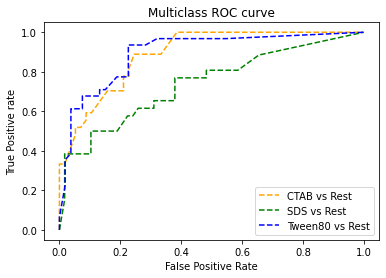

Test_accuracy_score 0.6309523809523809


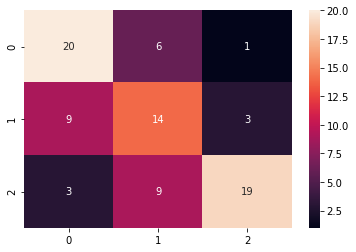

              precision    recall  f1-score   support

        CTAB       0.62      0.74      0.68        27
         SDS       0.48      0.54      0.51        26
     Tween80       0.83      0.61      0.70        31

    accuracy                           0.63        84
   macro avg       0.64      0.63      0.63        84
weighted avg       0.66      0.63      0.64        84

One-vs-One ROC AUC scores:
0.840881 (macro),
0.842299 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.841849 (macro),
0.845611 (weighted by prevalence)
{0: 0.8905133203378818, 1: 0.7397214854111406, 2: 0.8953134510042604}


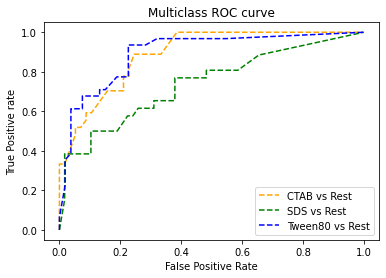

[0.7733333333333333, 0.7966666666666666, 0.78, 0.8033333333333333, 0.813953488372093, 0.8239202657807309, 0.7940199335548173, 0.8006644518272426, 0.7508305647840532, 0.7641196013289037]
[0.5882352941176471, 0.7058823529411765, 0.6470588235294118, 0.6470588235294118, 0.6060606060606061, 0.5757575757575758, 0.5757575757575758, 0.6060606060606061, 0.7575757575757576, 0.5757575757575758]
0.7900841638981173
0.6285204991087345
0.6309523809523809


In [67]:
if __name__ == '__main__':
    run(model, use_grid=True)

In [48]:
model = 'LogisticRegression'
feat = 'Adulterant'


1 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which mean

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

Train_accuracy_score 0.4766666666666667
Validation_accuracy_score 0.4411764705882353
Test_accuracy_score 0.4642857142857143


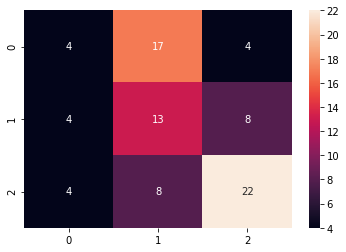

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.33      0.16      0.22        25
         SDS       0.34      0.52      0.41        25
     Tween80       0.65      0.65      0.65        34

    accuracy                           0.46        84
   macro avg       0.44      0.44      0.43        84
weighted avg       0.46      0.46      0.45        84

One-vs-One ROC AUC scores:
0.695702 (macro),
0.707129 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.712090 (macro),
0.721509 (weighted by prevalence)
{0: 0.6752542372881356, 1: 0.6610169491525424, 2: 0.7999999999999999}


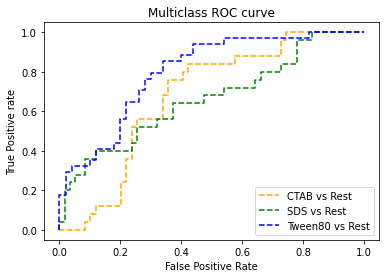


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which mean

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

Train_accuracy_score 0.5133333333333333
Validation_accuracy_score 0.47058823529411764
Test_accuracy_score 0.47619047619047616


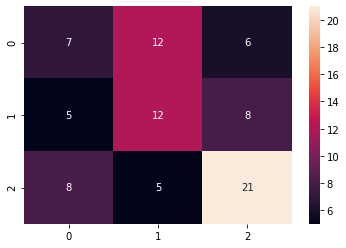

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.35      0.28      0.31        25
         SDS       0.41      0.48      0.44        25
     Tween80       0.60      0.62      0.61        34

    accuracy                           0.48        84
   macro avg       0.45      0.46      0.45        84
weighted avg       0.47      0.48      0.47        84

One-vs-One ROC AUC scores:
0.697545 (macro),
0.707356 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.711349 (macro),
0.720028 (weighted by prevalence)
{0: 0.6596610169491526, 1: 0.6820338983050848, 2: 0.7923529411764706}


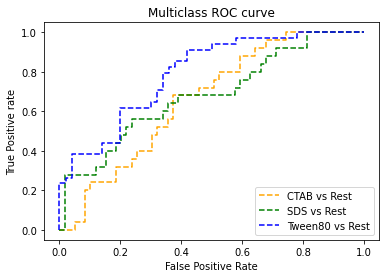


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which mean

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

Train_accuracy_score 0.52
Validation_accuracy_score 0.47058823529411764
Test_accuracy_score 0.4523809523809524


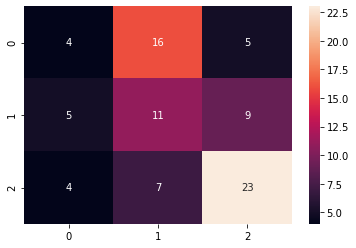

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.31      0.16      0.21        25
         SDS       0.32      0.44      0.37        25
     Tween80       0.62      0.68      0.65        34

    accuracy                           0.45        84
   macro avg       0.42      0.43      0.41        84
weighted avg       0.44      0.45      0.44        84

One-vs-One ROC AUC scores:
0.694314 (macro),
0.704723 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.709299 (macro),
0.717756 (weighted by prevalence)
{0: 0.6799999999999999, 1: 0.6596610169491526, 2: 0.788235294117647}


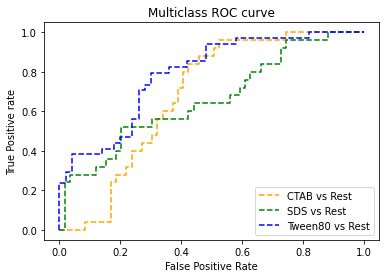


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which mean

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

Train_accuracy_score 0.49666666666666665
Validation_accuracy_score 0.38235294117647056
Test_accuracy_score 0.47619047619047616


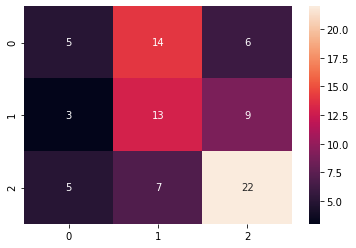

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.38      0.20      0.26        25
         SDS       0.38      0.52      0.44        25
     Tween80       0.59      0.65      0.62        34

    accuracy                           0.48        84
   macro avg       0.45      0.46      0.44        84
weighted avg       0.47      0.48      0.46        84

One-vs-One ROC AUC scores:
0.698078 (macro),
0.707833 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.711891 (macro),
0.720323 (weighted by prevalence)
{0: 0.6677966101694915, 1: 0.6772881355932203, 2: 0.7905882352941176}


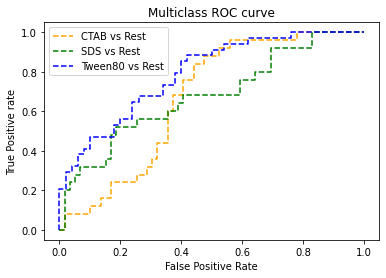


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which mean

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

Train_accuracy_score 0.5016611295681063
Validation_accuracy_score 0.5757575757575758
Test_accuracy_score 0.5


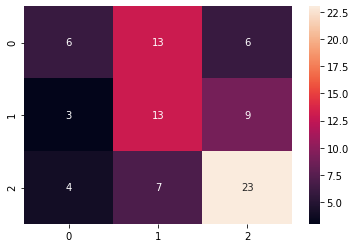

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.46      0.24      0.32        25
         SDS       0.39      0.52      0.45        25
     Tween80       0.61      0.68      0.64        34

    accuracy                           0.50        84
   macro avg       0.49      0.48      0.47        84
weighted avg       0.50      0.50      0.49        84

One-vs-One ROC AUC scores:
0.699576 (macro),
0.709454 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.713579 (macro),
0.722082 (weighted by prevalence)
{0: 0.6650847457627118, 1: 0.6827118644067797, 2: 0.7929411764705883}


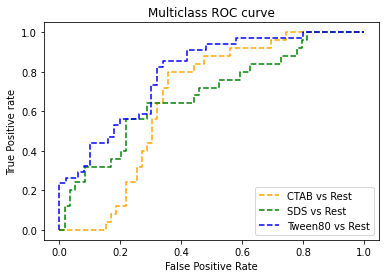


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which mean

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

Train_accuracy_score 0.47840531561461797
Validation_accuracy_score 0.36363636363636365
Test_accuracy_score 0.4166666666666667


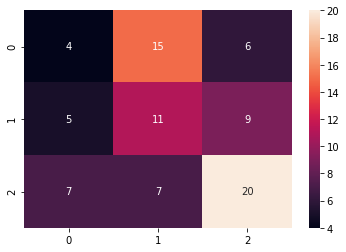

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.25      0.16      0.20        25
         SDS       0.33      0.44      0.38        25
     Tween80       0.57      0.59      0.58        34

    accuracy                           0.42        84
   macro avg       0.38      0.40      0.38        84
weighted avg       0.40      0.42      0.41        84

One-vs-One ROC AUC scores:
0.687302 (macro),
0.698022 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.702788 (macro),
0.711376 (weighted by prevalence)
{0: 0.6732203389830509, 1: 0.6522033898305084, 2: 0.7829411764705883}


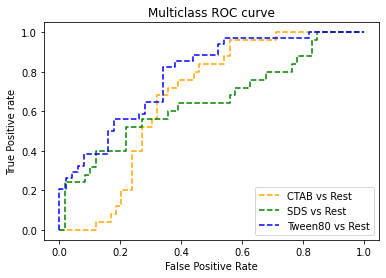


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which mean

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

Train_accuracy_score 0.48172757475083056
Validation_accuracy_score 0.3939393939393939
Test_accuracy_score 0.38095238095238093


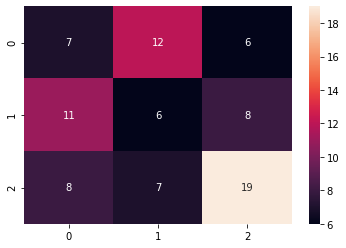

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.27      0.28      0.27        25
         SDS       0.24      0.24      0.24        25
     Tween80       0.58      0.56      0.57        34

    accuracy                           0.38        84
   macro avg       0.36      0.36      0.36        84
weighted avg       0.38      0.38      0.38        84

One-vs-One ROC AUC scores:
0.698463 (macro),
0.709909 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.715148 (macro),
0.723987 (weighted by prevalence)
{0: 0.6616949152542373, 1: 0.6861016949152543, 2: 0.7976470588235294}


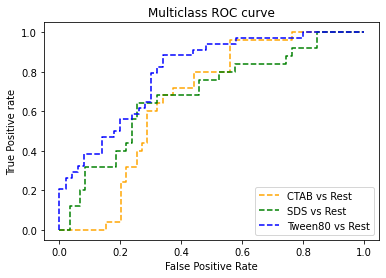


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which mean

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

Train_accuracy_score 0.4684385382059801
Validation_accuracy_score 0.3939393939393939
Test_accuracy_score 0.42857142857142855


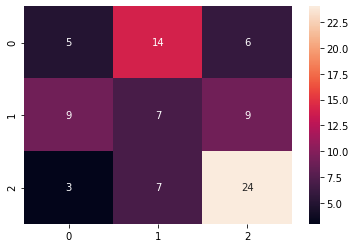

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.29      0.20      0.24        25
         SDS       0.25      0.28      0.26        25
     Tween80       0.62      0.71      0.66        34

    accuracy                           0.43        84
   macro avg       0.39      0.40      0.39        84
weighted avg       0.41      0.43      0.42        84

One-vs-One ROC AUC scores:
0.698980 (macro),
0.709426 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.714241 (macro),
0.722232 (weighted by prevalence)
{0: 0.6847457627118644, 1: 0.6691525423728815, 2: 0.7888235294117647}


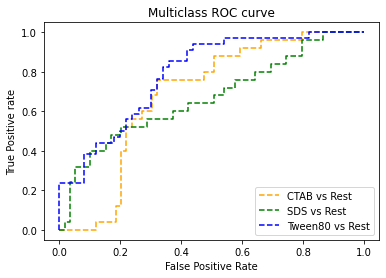


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which mean

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

Train_accuracy_score 0.5049833887043189
Validation_accuracy_score 0.36363636363636365
Test_accuracy_score 0.4880952380952381


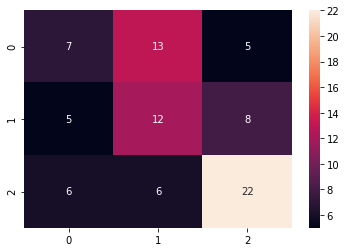

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.39      0.28      0.33        25
         SDS       0.39      0.48      0.43        25
     Tween80       0.63      0.65      0.64        34

    accuracy                           0.49        84
   macro avg       0.47      0.47      0.46        84
weighted avg       0.49      0.49      0.48        84

One-vs-One ROC AUC scores:
0.696761 (macro),
0.707602 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.712330 (macro),
0.721219 (weighted by prevalence)
{0: 0.679322033898305, 1: 0.6623728813559322, 2: 0.7952941176470588}


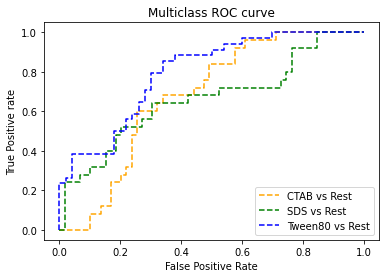


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which mean

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

Train_accuracy_score 0.5016611295681063
Validation_accuracy_score 0.3333333333333333
Test_accuracy_score 0.5


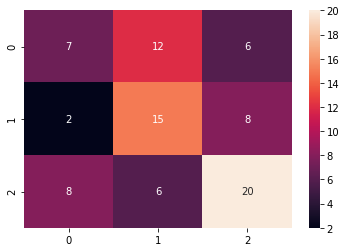

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.41      0.28      0.33        25
         SDS       0.45      0.60      0.52        25
     Tween80       0.59      0.59      0.59        34

    accuracy                           0.50        84
   macro avg       0.48      0.49      0.48        84
weighted avg       0.50      0.50      0.49        84

One-vs-One ROC AUC scores:
0.702643 (macro),
0.712728 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.717016 (macro),
0.725529 (weighted by prevalence)
{0: 0.6901694915254237, 1: 0.6644067796610169, 2: 0.7964705882352942}


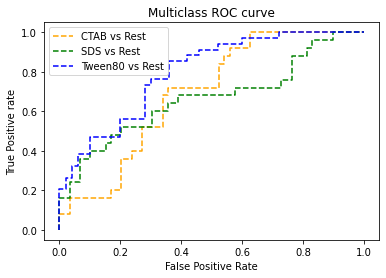

Test_accuracy_score 0.5


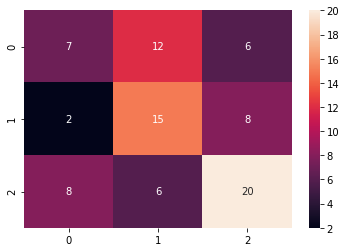

              precision    recall  f1-score   support

        CTAB       0.41      0.28      0.33        25
         SDS       0.45      0.60      0.52        25
     Tween80       0.59      0.59      0.59        34

    accuracy                           0.50        84
   macro avg       0.48      0.49      0.48        84
weighted avg       0.50      0.50      0.49        84

One-vs-One ROC AUC scores:
0.702643 (macro),
0.712728 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.717016 (macro),
0.725529 (weighted by prevalence)
{0: 0.6901694915254237, 1: 0.6644067796610169, 2: 0.7964705882352942}


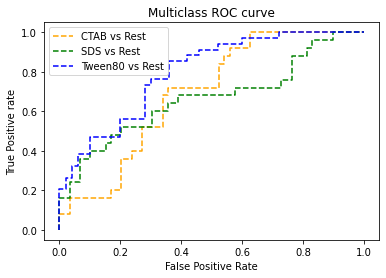

[0.4766666666666667, 0.5133333333333333, 0.52, 0.49666666666666665, 0.5016611295681063, 0.47840531561461797, 0.48172757475083056, 0.4684385382059801, 0.5049833887043189, 0.5016611295681063]
[0.4411764705882353, 0.47058823529411764, 0.47058823529411764, 0.38235294117647056, 0.5757575757575758, 0.36363636363636365, 0.3939393939393939, 0.3939393939393939, 0.36363636363636365, 0.3333333333333333]
0.4943543743078626
0.4188948306595366
0.5


In [49]:
if __name__ == '__main__':
    run(model, use_grid=True)

In [126]:
model = 'randomForestClassifier'
feat = 'Adulterant'

In [127]:
if __name__ == '__main__':
    run(model, use_grid=True)


1 of kfold 5


KeyboardInterrupt: 

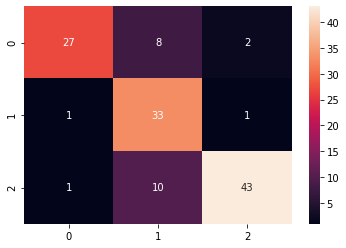

              precision    recall  f1-score   support

        CTAB       0.73      0.93      0.82        29
         SDS       0.94      0.65      0.77        51
     Tween80       0.80      0.93      0.86        46

    accuracy                           0.82       126
   macro avg       0.82      0.84      0.82       126
weighted avg       0.84      0.82      0.81       126

One-vs-One ROC AUC scores:
0.945820 (macro),
0.945379 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.946013 (macro),
0.944431 (weighted by prevalence)


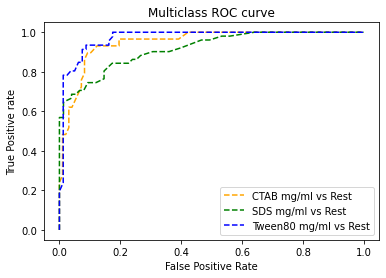

1.0
0.8174603174603174


In [130]:
run(model, use_grid=False)

In [63]:
model = 'svm'
feat = 'Adulterant'


1 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.9466666666666667
Validation_accuracy_score 0.7058823529411765
Test_accuracy_score 0.7261904761904762


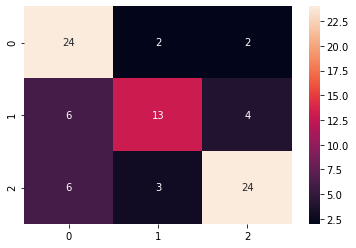

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.67      0.86      0.75        28
         SDS       0.72      0.57      0.63        23
     Tween80       0.80      0.73      0.76        33

    accuracy                           0.73        84
   macro avg       0.73      0.72      0.72        84
weighted avg       0.73      0.73      0.72        84

One-vs-One ROC AUC scores:
0.853606 (macro),
0.854748 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.854899 (macro),
0.857378 (weighted by prevalence)
{0: 0.8737244897959182, 1: 0.8246614397719174, 2: 0.8663101604278075}


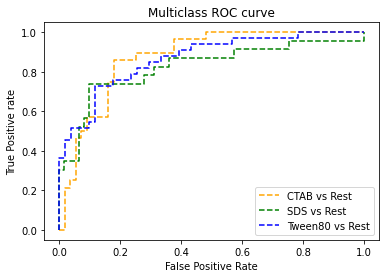


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.9333333333333333
Validation_accuracy_score 0.7647058823529411
Test_accuracy_score 0.7619047619047619


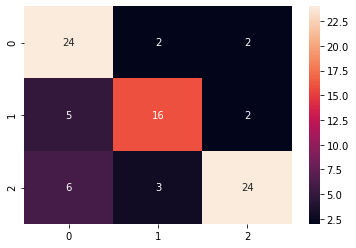

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.69      0.86      0.76        28
         SDS       0.76      0.70      0.73        23
     Tween80       0.86      0.73      0.79        33

    accuracy                           0.76        84
   macro avg       0.77      0.76      0.76        84
weighted avg       0.77      0.76      0.76        84

One-vs-One ROC AUC scores:
0.875714 (macro),
0.876306 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.876488 (macro),
0.877920 (weighted by prevalence)
{0: 0.8947704081632653, 1: 0.8553100498930863, 2: 0.8793820558526441}


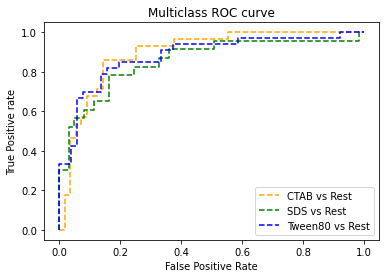


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.9366666666666666
Validation_accuracy_score 0.8235294117647058
Test_accuracy_score 0.7619047619047619


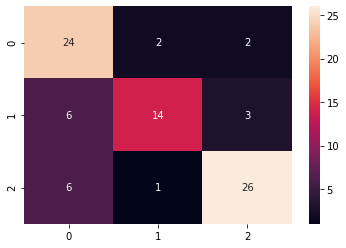

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.67      0.86      0.75        28
         SDS       0.82      0.61      0.70        23
     Tween80       0.84      0.79      0.81        33

    accuracy                           0.76        84
   macro avg       0.78      0.75      0.75        84
weighted avg       0.78      0.76      0.76        84

One-vs-One ROC AUC scores:
0.871416 (macro),
0.873104 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.872935 (macro),
0.876900 (weighted by prevalence)
{0: 0.8743622448979592, 1: 0.8389166072701354, 2: 0.9055258467023173}


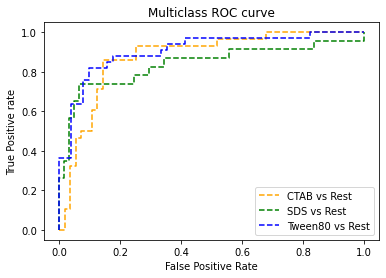


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.95
Validation_accuracy_score 0.6764705882352942
Test_accuracy_score 0.75


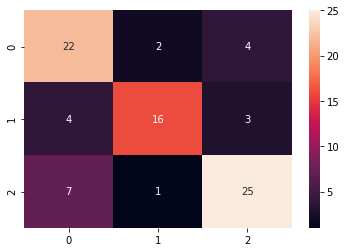

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.67      0.79      0.72        28
         SDS       0.84      0.70      0.76        23
     Tween80       0.78      0.76      0.77        33

    accuracy                           0.75        84
   macro avg       0.76      0.75      0.75        84
weighted avg       0.76      0.75      0.75        84

One-vs-One ROC AUC scores:
0.855088 (macro),
0.854892 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.854714 (macro),
0.854831 (weighted by prevalence)
{0: 0.8501275510204082, 1: 0.8560228082679971, 2: 0.8579916815210933}


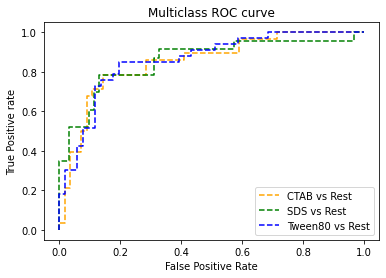


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.9435215946843853
Validation_accuracy_score 0.6666666666666666
Test_accuracy_score 0.7738095238095238


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


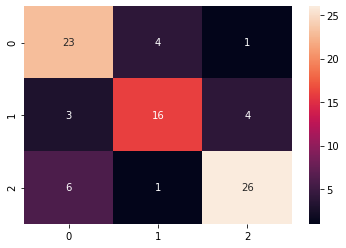

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.72      0.82      0.77        28
         SDS       0.76      0.70      0.73        23
     Tween80       0.84      0.79      0.81        33

    accuracy                           0.77        84
   macro avg       0.77      0.77      0.77        84
weighted avg       0.78      0.77      0.77        84

One-vs-One ROC AUC scores:
0.875808 (macro),
0.876911 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.877070 (macro),
0.879118 (weighted by prevalence)
{0: 0.889030612244898, 1: 0.8538845331432645, 2: 0.8882947118241236}


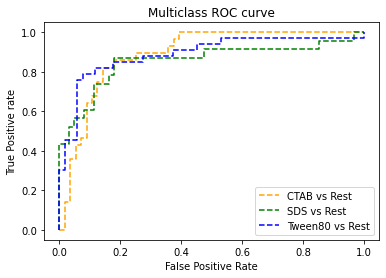


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.9335548172757475
Validation_accuracy_score 0.696969696969697
Test_accuracy_score 0.6904761904761905


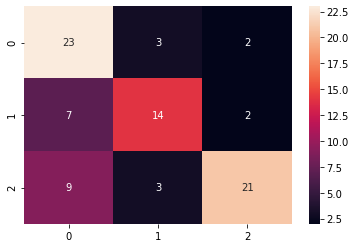

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.59      0.82      0.69        28
         SDS       0.70      0.61      0.65        23
     Tween80       0.84      0.64      0.72        33

    accuracy                           0.69        84
   macro avg       0.71      0.69      0.69        84
weighted avg       0.72      0.69      0.69        84

One-vs-One ROC AUC scores:
0.861346 (macro),
0.862320 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.862032 (macro),
0.864907 (weighted by prevalence)
{0: 0.8756377551020408, 1: 0.8310762651461155, 2: 0.8793820558526441}


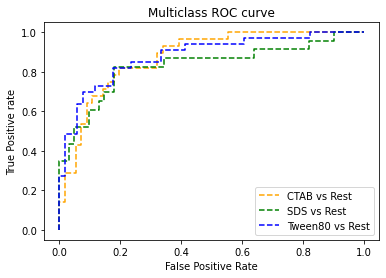


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.9302325581395349
Validation_accuracy_score 0.6363636363636364
Test_accuracy_score 0.75


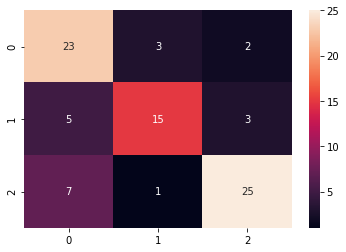

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.66      0.82      0.73        28
         SDS       0.79      0.65      0.71        23
     Tween80       0.83      0.76      0.79        33

    accuracy                           0.75        84
   macro avg       0.76      0.74      0.75        84
weighted avg       0.76      0.75      0.75        84

One-vs-One ROC AUC scores:
0.863911 (macro),
0.865691 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.865889 (macro),
0.869245 (weighted by prevalence)
{0: 0.8762755102040816, 1: 0.8325017818959372, 2: 0.888888888888889}


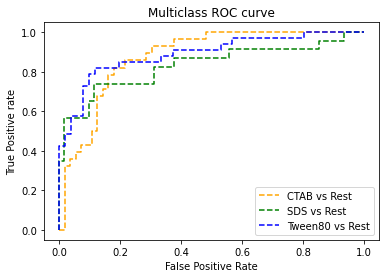


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.9534883720930233
Validation_accuracy_score 0.6666666666666666
Test_accuracy_score 0.75


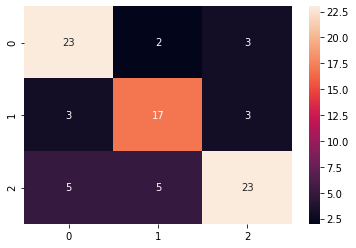

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.74      0.82      0.78        28
         SDS       0.71      0.74      0.72        23
     Tween80       0.79      0.70      0.74        33

    accuracy                           0.75        84
   macro avg       0.75      0.75      0.75        84
weighted avg       0.75      0.75      0.75        84

One-vs-One ROC AUC scores:
0.874177 (macro),
0.874846 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.874679 (macro),
0.876763 (weighted by prevalence)
{0: 0.8883928571428571, 1: 0.8503207412687099, 2: 0.8853238265002971}


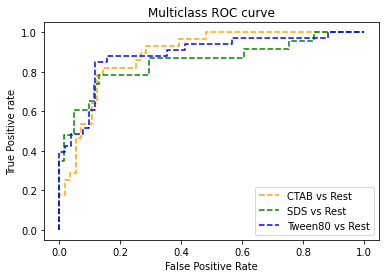


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.9435215946843853
Validation_accuracy_score 0.7878787878787878
Test_accuracy_score 0.8095238095238095


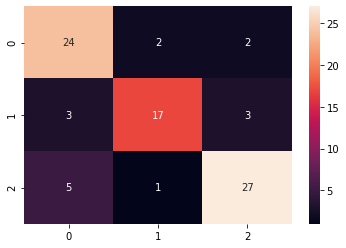

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.75      0.86      0.80        28
         SDS       0.85      0.74      0.79        23
     Tween80       0.84      0.82      0.83        33

    accuracy                           0.81        84
   macro avg       0.81      0.80      0.81        84
weighted avg       0.81      0.81      0.81        84

One-vs-One ROC AUC scores:
0.865205 (macro),
0.866842 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.866612 (macro),
0.870555 (weighted by prevalence)
{0: 0.8871173469387754, 1: 0.8232359230220955, 2: 0.8894830659536541}


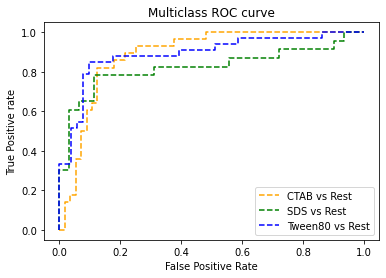


2 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.9368770764119602
Validation_accuracy_score 0.696969696969697
Test_accuracy_score 0.75


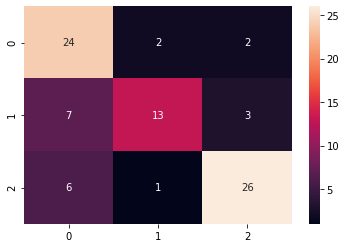

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.65      0.86      0.74        28
         SDS       0.81      0.57      0.67        23
     Tween80       0.84      0.79      0.81        33

    accuracy                           0.75        84
   macro avg       0.77      0.74      0.74        84
weighted avg       0.77      0.75      0.75        84

One-vs-One ROC AUC scores:
0.859958 (macro),
0.861690 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.861834 (macro),
0.865395 (weighted by prevalence)
{0: 0.8877551020408163, 1: 0.81895937277263, 2: 0.8787878787878789}


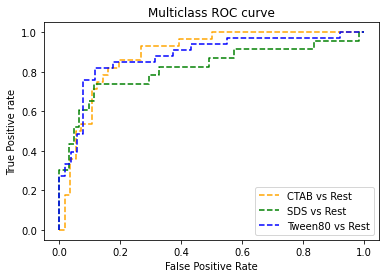

Test_accuracy_score 0.75


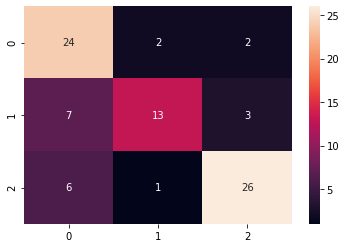

              precision    recall  f1-score   support

        CTAB       0.65      0.86      0.74        28
         SDS       0.81      0.57      0.67        23
     Tween80       0.84      0.79      0.81        33

    accuracy                           0.75        84
   macro avg       0.77      0.74      0.74        84
weighted avg       0.77      0.75      0.75        84

One-vs-One ROC AUC scores:
0.859958 (macro),
0.861690 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.861834 (macro),
0.865395 (weighted by prevalence)
{0: 0.8877551020408163, 1: 0.81895937277263, 2: 0.8787878787878789}


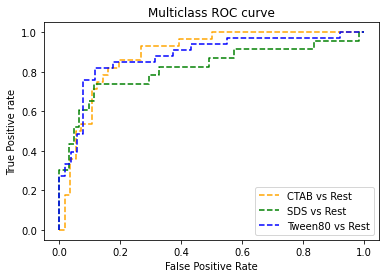

[0.9466666666666667, 0.9333333333333333, 0.9366666666666666, 0.95, 0.9435215946843853, 0.9335548172757475, 0.9302325581395349, 0.9534883720930233, 0.9435215946843853, 0.9368770764119602]
[0.7058823529411765, 0.7647058823529411, 0.8235294117647058, 0.6764705882352942, 0.6666666666666666, 0.696969696969697, 0.6363636363636364, 0.6666666666666666, 0.7878787878787878, 0.696969696969697]
0.9407862679955704
0.712210338680927
0.75


In [65]:
run(model, use_grid=True)

In [142]:
from scipy import interp
from itertools import cycle
from itertools import cycle

from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from scipy import interp


In [ ]:
run(model, use_grid=False)

In [98]:
model = 'naiveBayes'
feat = 'Adulterant'

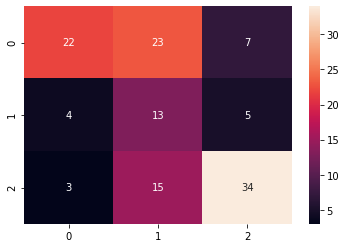

              precision    recall  f1-score   support

        CTAB       0.42      0.76      0.54        29
         SDS       0.59      0.25      0.36        51
     Tween80       0.65      0.74      0.69        46

    accuracy                           0.55       126
   macro avg       0.56      0.58      0.53       126
weighted avg       0.58      0.55      0.52       126

One-vs-One ROC AUC scores:
0.741328 (macro),
0.735587 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.737618 (macro),
0.723370 (weighted by prevalence)


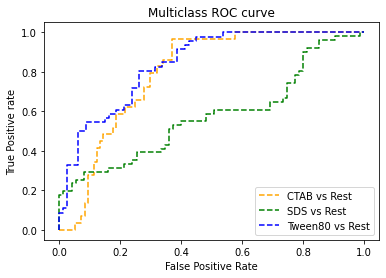

0.5308219178082192
0.5476190476190477


In [99]:
run(model, use_grid=True)

In [79]:
model = 'gbm'
feat = 'Adulterant'


1 of kfold 5


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 1.0
Validation_accuracy_score 0.7313432835820896
Test_accuracy_score 0.8333333333333334


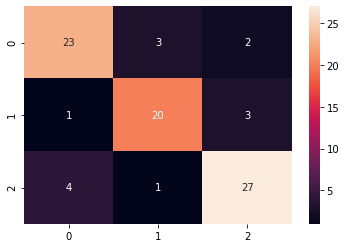

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.82      0.82      0.82        28
         SDS       0.83      0.83      0.83        24
     Tween80       0.84      0.84      0.84        32

    accuracy                           0.83        84
   macro avg       0.83      0.83      0.83        84
weighted avg       0.83      0.83      0.83        84

One-vs-One ROC AUC scores:
0.944785 (macro),
0.945463 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.945470 (macro),
0.946725 (weighted by prevalence)
{0: 0.9336734693877551, 1: 0.9381944444444444, 2: 0.9645432692307692}


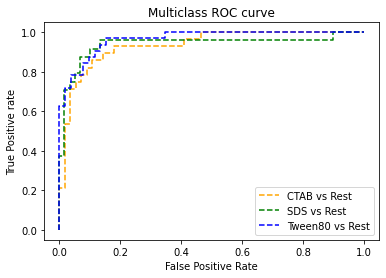


2 of kfold 5


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 1.0
Validation_accuracy_score 0.7313432835820896
Test_accuracy_score 0.7261904761904762


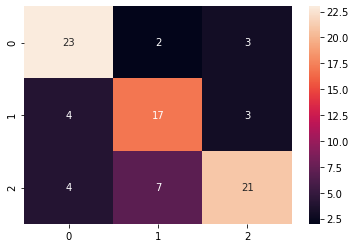

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.74      0.82      0.78        28
         SDS       0.65      0.71      0.68        24
     Tween80       0.78      0.66      0.71        32

    accuracy                           0.73        84
   macro avg       0.72      0.73      0.72        84
weighted avg       0.73      0.73      0.73        84

One-vs-One ROC AUC scores:
0.887060 (macro),
0.888295 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.888599 (macro),
0.890764 (weighted by prevalence)
{0: 0.9119897959183673, 1: 0.8541666666666666, 2: 0.8996394230769231}


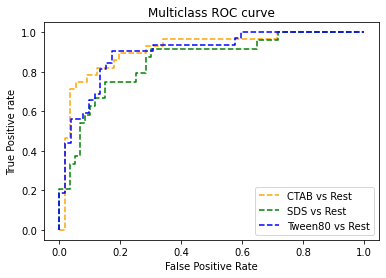


2 of kfold 5


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 1.0
Validation_accuracy_score 0.6417910447761194
Test_accuracy_score 0.75


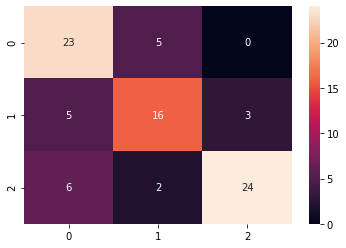

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.68      0.82      0.74        28
         SDS       0.70      0.67      0.68        24
     Tween80       0.89      0.75      0.81        32

    accuracy                           0.75        84
   macro avg       0.75      0.75      0.75        84
weighted avg       0.76      0.75      0.75        84

One-vs-One ROC AUC scores:
0.919643 (macro),
0.921614 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.921970 (macro),
0.925259 (weighted by prevalence)
{0: 0.9107142857142858, 1: 0.8930555555555555, 2: 0.962139423076923}


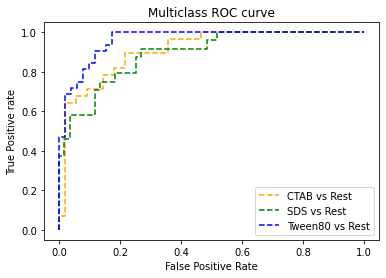


2 of kfold 5


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 1.0
Validation_accuracy_score 0.7164179104477612
Test_accuracy_score 0.7619047619047619


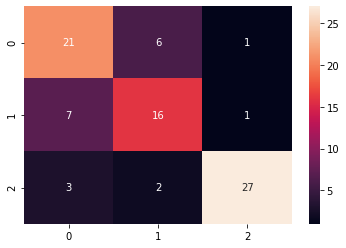

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.68      0.75      0.71        28
         SDS       0.67      0.67      0.67        24
     Tween80       0.93      0.84      0.89        32

    accuracy                           0.76        84
   macro avg       0.76      0.75      0.75        84
weighted avg       0.77      0.76      0.77        84

One-vs-One ROC AUC scores:
0.902809 (macro),
0.904425 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.904267 (macro),
0.907616 (weighted by prevalence)
{0: 0.8660714285714286, 1: 0.8881944444444445, 2: 0.9585336538461539}


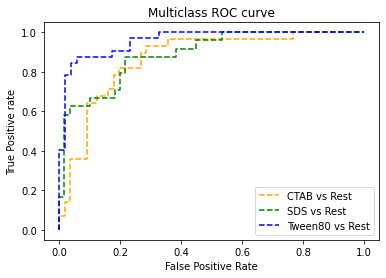


2 of kfold 5


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 1.0
Validation_accuracy_score 0.6818181818181818
Test_accuracy_score 0.8333333333333334


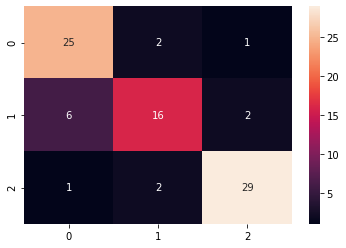

['CTAB', 'SDS', 'Tween80']
              precision    recall  f1-score   support

        CTAB       0.78      0.89      0.83        28
         SDS       0.80      0.67      0.73        24
     Tween80       0.91      0.91      0.91        32

    accuracy                           0.83        84
   macro avg       0.83      0.82      0.82        84
weighted avg       0.83      0.83      0.83        84

One-vs-One ROC AUC scores:
0.907800 (macro),
0.910550 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.910651 (macro),
0.915892 (weighted by prevalence)
{0: 0.9177295918367347, 1: 0.8520833333333333, 2: 0.9621394230769231}


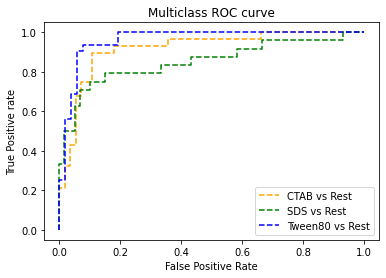

Test_accuracy_score 0.8333333333333334


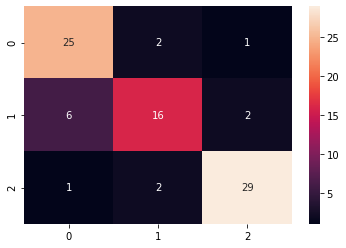

              precision    recall  f1-score   support

        CTAB       0.78      0.89      0.83        28
         SDS       0.80      0.67      0.73        24
     Tween80       0.91      0.91      0.91        32

    accuracy                           0.83        84
   macro avg       0.83      0.82      0.82        84
weighted avg       0.83      0.83      0.83        84

One-vs-One ROC AUC scores:
0.907800 (macro),
0.910550 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.910651 (macro),
0.915892 (weighted by prevalence)
{0: 0.9177295918367347, 1: 0.8520833333333333, 2: 0.9621394230769231}


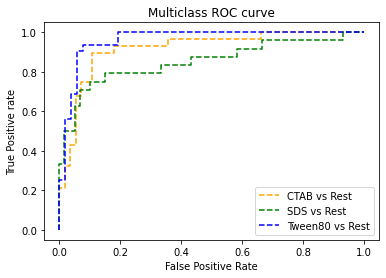

[1.0, 1.0, 1.0, 1.0, 1.0]
[0.7313432835820896, 0.7313432835820896, 0.6417910447761194, 0.7164179104477612, 0.6818181818181818]
1.0
0.7005427408412482
0.8333333333333334


In [80]:
run(model, use_grid=True)

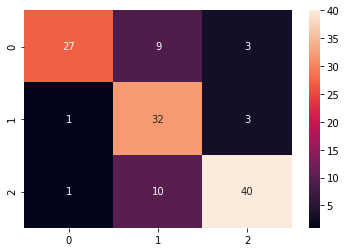

0.9965753424657534
0.7857142857142857


In [ ]:
run(model, use_grid=False)

In [ ]:
model = 'xgb'
feat = 'Adulterant'

In [ ]:
run(model, use_grid=True)


1 of kfold 10
[19:42:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:42:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\harsh\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[19:42:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:42:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:42:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[19:42:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


[20:00:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
{'gamma': 0, 'learning_rate': 0.01, 'max_depth': 4, 'n_estimators': 500, 'subsample': 0.6}
Train_accuracy_score 0.9441489361702128
Test_accuracy_score 0.8571428571428571

2 of kfold 10
[20:00:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:00:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:sof

C:\Users\harsh\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[20:00:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:00:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:00:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:00:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


[20:17:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
{'gamma': 1, 'learning_rate': 0.001, 'max_depth': 4, 'n_estimators': 200, 'subsample': 1.0}
Train_accuracy_score 0.8138297872340425
Test_accuracy_score 0.8095238095238095

3 of kfold 10
[20:17:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:17:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:so

C:\Users\harsh\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[20:17:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:17:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:17:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:17:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


[20:35:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
{'gamma': 2, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 500, 'subsample': 1.0}
Train_accuracy_score 0.8617021276595744
Test_accuracy_score 0.6666666666666666

4 of kfold 10
[20:35:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:35:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:sof

C:\Users\harsh\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[20:35:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:35:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:35:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:35:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


[20:52:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
{'gamma': 1, 'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 500, 'subsample': 0.6}
Train_accuracy_score 0.976063829787234
Test_accuracy_score 0.7619047619047619

5 of kfold 10
[20:52:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:52:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softp

C:\Users\harsh\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[20:52:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:52:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:52:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:52:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


[21:08:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
{'gamma': 0, 'learning_rate': 0.001, 'max_depth': 4, 'n_estimators': 500, 'subsample': 0.8}
Train_accuracy_score 0.8191489361702128
Test_accuracy_score 0.7380952380952381

6 of kfold 10
[21:08:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:08:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:so

C:\Users\harsh\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[21:08:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:08:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:08:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:08:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


[21:28:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
{'gamma': 1, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500, 'subsample': 0.6}
Train_accuracy_score 0.9840425531914894
Test_accuracy_score 0.8571428571428571

7 of kfold 10
[21:28:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:28:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:soft

C:\Users\harsh\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[21:28:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:28:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:28:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:28:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[21:47:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
{'gamma': 1, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.6}
Train_accuracy_score 0.7819148936170213
Test_accuracy_score 0.7380952380952381

8 of kfold 10
[21:47:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[21:47:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:sof

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


[22:07:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
{'gamma': 0, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.6}
Train_accuracy_score 1.0
Test_accuracy_score 0.7142857142857143

9 of kfold 10
[22:07:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:07:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was chang

C:\Users\harsh\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



[22:07:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:07:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:07:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:07:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


[22:26:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
{'gamma': 0, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}
Train_accuracy_score 0.9363395225464191
Test_accuracy_score 0.8048780487804879

10 of kfold 10
[22:26:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:26:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:so

C:\Users\harsh\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[22:26:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:26:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:26:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:26:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


[22:46:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
{'gamma': 2, 'learning_rate': 0.01, 'max_depth': 4, 'n_estimators': 500, 'subsample': 1.0}
Train_accuracy_score 0.8541114058355438
Test_accuracy_score 0.6829268292682927
[0.9441489361702128, 0.8138297872340425, 0.8617021276595744, 0.976063829787234, 0.8191489361702128, 0.9840425531914894, 0.7819148936170213, 1.0, 0.9363395225464191, 0.8541114058355438]
[0.8571428571428571, 0.8095238095238095, 0.6666666666666666, 0.7619047619047619, 0.7380952380952381, 0.8571428571428571, 0.7380952380952381, 0.7142857142857143, 0.8048780487804879, 0.6829268292682927]
0.8971301992211751
0.7630662020905923


In [ ]:
run(model, use_grid=False)

[13:50:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
1.0
0.7936507936507936


C:\Users\harsh\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


In [64]:
model = 'nn'
feat = 'Adulterant'

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:293: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  warnings.warn(


-----Cross Validation 1/5-----
Epoch 1/500
9/9 [==============================] - 15s 160ms/step - loss: 1.5981 - accuracy: 0.3912 - val_loss: 1.0989 - val_accuracy: 0.2985
Epoch 2/500
9/9 [==============================] - 0s 12ms/step - loss: 1.6457 - accuracy: 0.3657 - val_loss: 1.1015 - val_accuracy: 0.2985
Epoch 3/500
9/9 [==============================] - 0s 9ms/step - loss: 1.6375 - accuracy: 0.3235 - val_loss: 1.1047 - val_accuracy: 0.2985
Epoch 4/500
9/9 [==============================] - 0s 9ms/step - loss: 1.5642 - accuracy: 0.3401 - val_loss: 1.1037 - val_accuracy: 0.3582
Epoch 5/500
9/9 [==============================] - 0s 9ms/step - loss: 1.3799 - accuracy: 0.3920 - val_loss: 1.1060 - val_accuracy: 0.3582
Epoch 6/500
9/9 [==============================] - 0s 9ms/step - loss: 1.4565 - accuracy: 0.3452 - val_loss: 1.1111 - val_accuracy: 0.3731
Epoch 7/500
9/9 [==============================] - 0s 9ms/step - loss: 1.4742 - accuracy: 0.3787 - val_loss: 1.1094 - val_accuracy:

9/9 [==============================] - 0s 9ms/step - loss: 0.8272 - accuracy: 0.6609 - val_loss: 0.7842 - val_accuracy: 0.6119
Epoch 60/500
9/9 [==============================] - 0s 9ms/step - loss: 0.8224 - accuracy: 0.6397 - val_loss: 0.7778 - val_accuracy: 0.5970
Epoch 61/500
9/9 [==============================] - 0s 9ms/step - loss: 0.8129 - accuracy: 0.6292 - val_loss: 0.7877 - val_accuracy: 0.6119
Epoch 62/500
9/9 [==============================] - 0s 9ms/step - loss: 0.7565 - accuracy: 0.6679 - val_loss: 0.7903 - val_accuracy: 0.6119
Epoch 63/500
9/9 [==============================] - 0s 9ms/step - loss: 0.6675 - accuracy: 0.7208 - val_loss: 0.7863 - val_accuracy: 0.6269
Epoch 64/500
9/9 [==============================] - 0s 9ms/step - loss: 0.7037 - accuracy: 0.6838 - val_loss: 0.7809 - val_accuracy: 0.6567
Epoch 65/500
9/9 [==============================] - 0s 20ms/step - loss: 0.7801 - accuracy: 0.6491 - val_loss: 0.7855 - val_accuracy: 0.6567
Epoch 66/500
9/9 [==============

Epoch 175/500
9/9 [==============================] - 0s 22ms/step - loss: 0.3917 - accuracy: 0.8306 - val_loss: 0.5926 - val_accuracy: 0.7313
Epoch 176/500
9/9 [==============================] - 0s 21ms/step - loss: 0.3860 - accuracy: 0.8313 - val_loss: 0.6053 - val_accuracy: 0.7313
Epoch 177/500
9/9 [==============================] - 0s 21ms/step - loss: 0.3702 - accuracy: 0.8470 - val_loss: 0.5980 - val_accuracy: 0.7313
Epoch 178/500
9/9 [==============================] - 0s 22ms/step - loss: 0.4106 - accuracy: 0.8153 - val_loss: 0.5903 - val_accuracy: 0.7463
Epoch 179/500
9/9 [==============================] - 0s 22ms/step - loss: 0.3806 - accuracy: 0.8513 - val_loss: 0.6585 - val_accuracy: 0.6866
Epoch 180/500
9/9 [==============================] - 0s 22ms/step - loss: 0.3859 - accuracy: 0.8506 - val_loss: 0.6122 - val_accuracy: 0.7612
Epoch 181/500
9/9 [==============================] - 0s 22ms/step - loss: 0.3363 - accuracy: 0.8680 - val_loss: 0.6056 - val_accuracy: 0.7313
Epoch 

Epoch 233/500
9/9 [==============================] - 0s 21ms/step - loss: 0.3749 - accuracy: 0.8417 - val_loss: 0.6185 - val_accuracy: 0.7313
Epoch 234/500
9/9 [==============================] - 0s 31ms/step - loss: 0.3827 - accuracy: 0.8543 - val_loss: 0.5760 - val_accuracy: 0.7164
Epoch 235/500
9/9 [==============================] - 0s 20ms/step - loss: 0.3155 - accuracy: 0.8748 - val_loss: 0.5921 - val_accuracy: 0.7313
Epoch 236/500
9/9 [==============================] - 0s 31ms/step - loss: 0.2894 - accuracy: 0.8807 - val_loss: 0.5808 - val_accuracy: 0.7612
Epoch 237/500
9/9 [==============================] - 0s 19ms/step - loss: 0.3795 - accuracy: 0.8563 - val_loss: 0.5781 - val_accuracy: 0.7313
Epoch 238/500
9/9 [==============================] - 0s 31ms/step - loss: 0.3379 - accuracy: 0.8772 - val_loss: 0.6388 - val_accuracy: 0.7313
Epoch 239/500
9/9 [==============================] - 0s 19ms/step - loss: 0.3342 - accuracy: 0.8469 - val_loss: 0.8171 - val_accuracy: 0.6716
Epoch 

Epoch 291/500
9/9 [==============================] - 0s 23ms/step - loss: 0.4449 - accuracy: 0.8267 - val_loss: 0.5730 - val_accuracy: 0.7164
Epoch 292/500
9/9 [==============================] - 0s 20ms/step - loss: 0.2737 - accuracy: 0.9078 - val_loss: 0.5918 - val_accuracy: 0.6866
Epoch 293/500
9/9 [==============================] - 0s 21ms/step - loss: 0.3492 - accuracy: 0.8632 - val_loss: 0.5789 - val_accuracy: 0.7612
Epoch 294/500
9/9 [==============================] - 0s 22ms/step - loss: 0.3018 - accuracy: 0.9086 - val_loss: 0.5666 - val_accuracy: 0.7612
Epoch 295/500
9/9 [==============================] - 0s 22ms/step - loss: 0.2824 - accuracy: 0.9012 - val_loss: 0.5523 - val_accuracy: 0.7910
Epoch 296/500
9/9 [==============================] - 0s 21ms/step - loss: 0.4007 - accuracy: 0.8377 - val_loss: 0.5585 - val_accuracy: 0.7761
Epoch 297/500
9/9 [==============================] - 0s 23ms/step - loss: 0.2617 - accuracy: 0.8951 - val_loss: 0.5992 - val_accuracy: 0.7164
Epoch 

Epoch 349/500
9/9 [==============================] - 0s 29ms/step - loss: 0.2625 - accuracy: 0.8974 - val_loss: 0.5548 - val_accuracy: 0.8060
Epoch 350/500
9/9 [==============================] - 0s 30ms/step - loss: 0.3257 - accuracy: 0.8640 - val_loss: 0.6099 - val_accuracy: 0.7463
Epoch 351/500
9/9 [==============================] - 0s 20ms/step - loss: 0.2657 - accuracy: 0.8917 - val_loss: 0.5969 - val_accuracy: 0.7612
Epoch 352/500
9/9 [==============================] - 0s 21ms/step - loss: 0.2950 - accuracy: 0.8873 - val_loss: 0.6941 - val_accuracy: 0.7164
Epoch 353/500
9/9 [==============================] - 0s 32ms/step - loss: 0.3096 - accuracy: 0.8752 - val_loss: 0.6344 - val_accuracy: 0.7463
Epoch 354/500
9/9 [==============================] - 0s 30ms/step - loss: 0.2365 - accuracy: 0.9016 - val_loss: 0.6045 - val_accuracy: 0.7612
Epoch 355/500
9/9 [==============================] - 0s 19ms/step - loss: 0.3555 - accuracy: 0.8663 - val_loss: 0.5893 - val_accuracy: 0.7761
Epoch 

9/9 [==============================] - 0s 31ms/step - loss: 0.1844 - accuracy: 0.9367 - val_loss: 0.5616 - val_accuracy: 0.7910
Epoch 464/500
9/9 [==============================] - 0s 19ms/step - loss: 0.1780 - accuracy: 0.9249 - val_loss: 0.5863 - val_accuracy: 0.8060
Epoch 465/500
9/9 [==============================] - 0s 31ms/step - loss: 0.1947 - accuracy: 0.9209 - val_loss: 0.5946 - val_accuracy: 0.8209
Epoch 466/500
9/9 [==============================] - 0s 30ms/step - loss: 0.2139 - accuracy: 0.9409 - val_loss: 0.5729 - val_accuracy: 0.8060
Epoch 467/500
9/9 [==============================] - 0s 20ms/step - loss: 0.1718 - accuracy: 0.9362 - val_loss: 0.5933 - val_accuracy: 0.7910
Epoch 468/500
9/9 [==============================] - 0s 31ms/step - loss: 0.2528 - accuracy: 0.9045 - val_loss: 0.5769 - val_accuracy: 0.8060
Epoch 469/500
9/9 [==============================] - 0s 31ms/step - loss: 0.1676 - accuracy: 0.9248 - val_loss: 0.5218 - val_accuracy: 0.8209
Epoch 470/500
9/9 [=

9/9 [==============================] - 0s 19ms/step - loss: 0.2718 - accuracy: 0.9064 - val_loss: 0.2904 - val_accuracy: 0.8657
Epoch 79/500
9/9 [==============================] - 0s 19ms/step - loss: 0.1864 - accuracy: 0.9363 - val_loss: 0.3369 - val_accuracy: 0.8209
Epoch 80/500
9/9 [==============================] - 0s 31ms/step - loss: 0.1994 - accuracy: 0.9288 - val_loss: 0.3105 - val_accuracy: 0.8507
Epoch 81/500
9/9 [==============================] - 0s 31ms/step - loss: 0.1985 - accuracy: 0.9251 - val_loss: 0.2784 - val_accuracy: 0.8806
Epoch 82/500
9/9 [==============================] - 0s 31ms/step - loss: 0.1654 - accuracy: 0.9476 - val_loss: 0.2862 - val_accuracy: 0.8657
Epoch 83/500
9/9 [==============================] - 0s 19ms/step - loss: 0.1502 - accuracy: 0.9438 - val_loss: 0.3173 - val_accuracy: 0.8657
Epoch 84/500
9/9 [==============================] - 0s 19ms/step - loss: 0.1805 - accuracy: 0.9401 - val_loss: 0.3481 - val_accuracy: 0.8657
Epoch 85/500
9/9 [========

Epoch 136/500
9/9 [==============================] - 0s 13ms/step - loss: 0.1693 - accuracy: 0.9363 - val_loss: 0.3717 - val_accuracy: 0.8507
Epoch 137/500
9/9 [==============================] - 0s 11ms/step - loss: 0.2582 - accuracy: 0.8989 - val_loss: 0.2827 - val_accuracy: 0.8806
Epoch 138/500
9/9 [==============================] - 0s 19ms/step - loss: 0.2659 - accuracy: 0.8951 - val_loss: 0.3881 - val_accuracy: 0.8507
Epoch 139/500
9/9 [==============================] - 0s 13ms/step - loss: 0.2154 - accuracy: 0.9064 - val_loss: 0.3318 - val_accuracy: 0.8657
Epoch 140/500
9/9 [==============================] - 0s 18ms/step - loss: 0.1905 - accuracy: 0.9326 - val_loss: 0.3265 - val_accuracy: 0.8358
Epoch 141/500
9/9 [==============================] - 0s 20ms/step - loss: 0.1843 - accuracy: 0.9288 - val_loss: 0.4471 - val_accuracy: 0.8060
Epoch 142/500
9/9 [==============================] - 0s 13ms/step - loss: 0.2317 - accuracy: 0.9101 - val_loss: 0.5063 - val_accuracy: 0.8209
Epoch 

Epoch 194/500
9/9 [==============================] - 0s 12ms/step - loss: 0.2248 - accuracy: 0.9251 - val_loss: 0.5014 - val_accuracy: 0.8060
Epoch 195/500
9/9 [==============================] - 0s 12ms/step - loss: 0.1755 - accuracy: 0.9401 - val_loss: 0.4650 - val_accuracy: 0.8358
Epoch 196/500
9/9 [==============================] - 0s 12ms/step - loss: 0.2202 - accuracy: 0.9139 - val_loss: 0.4267 - val_accuracy: 0.8209
Epoch 197/500
9/9 [==============================] - 0s 12ms/step - loss: 0.1932 - accuracy: 0.9176 - val_loss: 0.4146 - val_accuracy: 0.8657
Epoch 198/500
9/9 [==============================] - 0s 12ms/step - loss: 0.2250 - accuracy: 0.9401 - val_loss: 0.4340 - val_accuracy: 0.8209
Epoch 199/500
9/9 [==============================] - 0s 12ms/step - loss: 0.1572 - accuracy: 0.9476 - val_loss: 0.5716 - val_accuracy: 0.7612
Epoch 200/500
9/9 [==============================] - 0s 16ms/step - loss: 0.2198 - accuracy: 0.9139 - val_loss: 0.5801 - val_accuracy: 0.7761
Epoch 

Epoch 252/500
9/9 [==============================] - 0s 17ms/step - loss: 0.1766 - accuracy: 0.9213 - val_loss: 0.6383 - val_accuracy: 0.7761
Epoch 253/500
9/9 [==============================] - 0s 17ms/step - loss: 0.2119 - accuracy: 0.9101 - val_loss: 0.6287 - val_accuracy: 0.8060
Epoch 254/500
9/9 [==============================] - 0s 16ms/step - loss: 0.2570 - accuracy: 0.9064 - val_loss: 0.5610 - val_accuracy: 0.8209
Epoch 255/500
9/9 [==============================] - 0s 17ms/step - loss: 0.1812 - accuracy: 0.9476 - val_loss: 0.5494 - val_accuracy: 0.8358
Epoch 256/500
9/9 [==============================] - 0s 17ms/step - loss: 0.2106 - accuracy: 0.9251 - val_loss: 0.5697 - val_accuracy: 0.8358
Epoch 257/500
9/9 [==============================] - 0s 17ms/step - loss: 0.1718 - accuracy: 0.9363 - val_loss: 0.6146 - val_accuracy: 0.8209
Epoch 258/500
9/9 [==============================] - 0s 17ms/step - loss: 0.1951 - accuracy: 0.9288 - val_loss: 0.6026 - val_accuracy: 0.8209
Epoch 

Epoch 310/500
9/9 [==============================] - 0s 30ms/step - loss: 0.1097 - accuracy: 0.9625 - val_loss: 0.5685 - val_accuracy: 0.8358
Epoch 311/500
9/9 [==============================] - 0s 30ms/step - loss: 0.2005 - accuracy: 0.9213 - val_loss: 0.5665 - val_accuracy: 0.7910
Epoch 312/500
9/9 [==============================] - 0s 30ms/step - loss: 0.1460 - accuracy: 0.9438 - val_loss: 0.5432 - val_accuracy: 0.7612
Epoch 313/500
9/9 [==============================] - 0s 28ms/step - loss: 0.1659 - accuracy: 0.9476 - val_loss: 0.6162 - val_accuracy: 0.8060
Epoch 314/500
9/9 [==============================] - 0s 9ms/step - loss: 0.1680 - accuracy: 0.9326 - val_loss: 0.6604 - val_accuracy: 0.7761
Epoch 315/500
9/9 [==============================] - 0s 9ms/step - loss: 0.1497 - accuracy: 0.9513 - val_loss: 0.6886 - val_accuracy: 0.7761
Epoch 316/500
9/9 [==============================] - 0s 9ms/step - loss: 0.1670 - accuracy: 0.9363 - val_loss: 0.7023 - val_accuracy: 0.7761
Epoch 317

Epoch 368/500
9/9 [==============================] - 0s 21ms/step - loss: 0.1957 - accuracy: 0.9288 - val_loss: 0.7553 - val_accuracy: 0.7761
Epoch 369/500
9/9 [==============================] - 0s 20ms/step - loss: 0.2619 - accuracy: 0.9176 - val_loss: 0.7076 - val_accuracy: 0.7612
Epoch 370/500
9/9 [==============================] - 0s 28ms/step - loss: 0.1763 - accuracy: 0.9438 - val_loss: 0.6257 - val_accuracy: 0.7761
Epoch 371/500
9/9 [==============================] - 0s 9ms/step - loss: 0.1571 - accuracy: 0.9326 - val_loss: 0.5838 - val_accuracy: 0.7761
Epoch 372/500
9/9 [==============================] - 0s 9ms/step - loss: 0.1793 - accuracy: 0.9326 - val_loss: 0.5409 - val_accuracy: 0.7761
Epoch 373/500
9/9 [==============================] - 0s 9ms/step - loss: 0.1425 - accuracy: 0.9513 - val_loss: 0.6405 - val_accuracy: 0.7761
Epoch 374/500
9/9 [==============================] - 0s 9ms/step - loss: 0.2022 - accuracy: 0.9326 - val_loss: 0.6274 - val_accuracy: 0.7910
Epoch 375/

Epoch 426/500
9/9 [==============================] - 0s 19ms/step - loss: 0.1550 - accuracy: 0.9401 - val_loss: 0.7126 - val_accuracy: 0.7761
Epoch 427/500
9/9 [==============================] - 0s 19ms/step - loss: 0.1453 - accuracy: 0.9363 - val_loss: 0.6815 - val_accuracy: 0.7910
Epoch 428/500
9/9 [==============================] - 0s 19ms/step - loss: 0.1602 - accuracy: 0.9513 - val_loss: 0.6717 - val_accuracy: 0.7910
Epoch 429/500
9/9 [==============================] - 0s 30ms/step - loss: 0.1251 - accuracy: 0.9700 - val_loss: 0.6816 - val_accuracy: 0.7910
Epoch 430/500
9/9 [==============================] - 0s 30ms/step - loss: 0.2248 - accuracy: 0.9288 - val_loss: 0.7242 - val_accuracy: 0.7612
Epoch 431/500
9/9 [==============================] - 0s 19ms/step - loss: 0.2366 - accuracy: 0.9176 - val_loss: 0.5993 - val_accuracy: 0.8060
Epoch 432/500
9/9 [==============================] - 0s 9ms/step - loss: 0.1399 - accuracy: 0.9401 - val_loss: 0.6070 - val_accuracy: 0.7910
Epoch 4

Epoch 484/500
9/9 [==============================] - 0s 22ms/step - loss: 0.1145 - accuracy: 0.9476 - val_loss: 0.7390 - val_accuracy: 0.8060
Epoch 485/500
9/9 [==============================] - 0s 22ms/step - loss: 0.0772 - accuracy: 0.9813 - val_loss: 0.7643 - val_accuracy: 0.8060
Epoch 486/500
9/9 [==============================] - 0s 21ms/step - loss: 0.0942 - accuracy: 0.9700 - val_loss: 0.7721 - val_accuracy: 0.8060
Epoch 487/500
9/9 [==============================] - 0s 36ms/step - loss: 0.0843 - accuracy: 0.9738 - val_loss: 0.7963 - val_accuracy: 0.7612
Epoch 488/500
9/9 [==============================] - 0s 35ms/step - loss: 0.1245 - accuracy: 0.9663 - val_loss: 0.7944 - val_accuracy: 0.7910
Epoch 489/500
9/9 [==============================] - 0s 22ms/step - loss: 0.1368 - accuracy: 0.9476 - val_loss: 0.7540 - val_accuracy: 0.8060
Epoch 490/500
9/9 [==============================] - 0s 21ms/step - loss: 0.0992 - accuracy: 0.9663 - val_loss: 0.7643 - val_accuracy: 0.8060
Epoch 

Epoch 42/500
9/9 [==============================] - 0s 10ms/step - loss: 0.1355 - accuracy: 0.9513 - val_loss: 0.2347 - val_accuracy: 0.8955
Epoch 43/500
9/9 [==============================] - 0s 10ms/step - loss: 0.1765 - accuracy: 0.9476 - val_loss: 0.2279 - val_accuracy: 0.8955
Epoch 44/500
9/9 [==============================] - 0s 9ms/step - loss: 0.1354 - accuracy: 0.9588 - val_loss: 0.2262 - val_accuracy: 0.9254
Epoch 45/500
9/9 [==============================] - 0s 10ms/step - loss: 0.1734 - accuracy: 0.9476 - val_loss: 0.2364 - val_accuracy: 0.9254
Epoch 46/500
9/9 [==============================] - 0s 10ms/step - loss: 0.1296 - accuracy: 0.9588 - val_loss: 0.2692 - val_accuracy: 0.9104
Epoch 47/500
9/9 [==============================] - 0s 20ms/step - loss: 0.1556 - accuracy: 0.9363 - val_loss: 0.2995 - val_accuracy: 0.9104
Epoch 48/500
9/9 [==============================] - 0s 22ms/step - loss: 0.1570 - accuracy: 0.9438 - val_loss: 0.2952 - val_accuracy: 0.8955
Epoch 49/500
9

Epoch 158/500
9/9 [==============================] - 0s 13ms/step - loss: 0.0695 - accuracy: 0.9738 - val_loss: 0.5362 - val_accuracy: 0.8209
Epoch 159/500
9/9 [==============================] - 0s 27ms/step - loss: 0.1743 - accuracy: 0.9513 - val_loss: 0.4475 - val_accuracy: 0.8358
Epoch 160/500
9/9 [==============================] - 0s 12ms/step - loss: 0.1229 - accuracy: 0.9551 - val_loss: 0.4844 - val_accuracy: 0.8060
Epoch 161/500
9/9 [==============================] - 0s 12ms/step - loss: 0.1478 - accuracy: 0.9551 - val_loss: 0.4846 - val_accuracy: 0.7761
Epoch 162/500
9/9 [==============================] - 0s 12ms/step - loss: 0.1866 - accuracy: 0.9551 - val_loss: 0.5223 - val_accuracy: 0.7910
Epoch 163/500
9/9 [==============================] - 0s 24ms/step - loss: 0.1803 - accuracy: 0.9363 - val_loss: 0.6053 - val_accuracy: 0.8060
Epoch 164/500
9/9 [==============================] - 0s 24ms/step - loss: 0.1366 - accuracy: 0.9588 - val_loss: 0.6235 - val_accuracy: 0.7612
Epoch 

Epoch 216/500
9/9 [==============================] - 0s 16ms/step - loss: 0.0785 - accuracy: 0.9813 - val_loss: 0.4861 - val_accuracy: 0.8358
Epoch 217/500
9/9 [==============================] - 0s 16ms/step - loss: 0.1805 - accuracy: 0.9401 - val_loss: 0.4672 - val_accuracy: 0.8209
Epoch 218/500
9/9 [==============================] - 0s 17ms/step - loss: 0.0803 - accuracy: 0.9700 - val_loss: 0.6168 - val_accuracy: 0.8060
Epoch 219/500
9/9 [==============================] - 0s 20ms/step - loss: 0.1856 - accuracy: 0.9363 - val_loss: 0.6371 - val_accuracy: 0.8060
Epoch 220/500
9/9 [==============================] - 0s 19ms/step - loss: 0.1743 - accuracy: 0.9363 - val_loss: 0.5915 - val_accuracy: 0.8060
Epoch 221/500
9/9 [==============================] - 0s 20ms/step - loss: 0.0906 - accuracy: 0.9663 - val_loss: 0.5039 - val_accuracy: 0.7910
Epoch 222/500
9/9 [==============================] - 0s 19ms/step - loss: 0.1197 - accuracy: 0.9438 - val_loss: 0.4875 - val_accuracy: 0.8209
Epoch 

Epoch 274/500
9/9 [==============================] - 0s 13ms/step - loss: 0.1173 - accuracy: 0.9551 - val_loss: 0.5218 - val_accuracy: 0.8060
Epoch 275/500
9/9 [==============================] - 0s 14ms/step - loss: 0.1045 - accuracy: 0.9625 - val_loss: 0.5907 - val_accuracy: 0.8209
Epoch 276/500
9/9 [==============================] - 0s 15ms/step - loss: 0.1483 - accuracy: 0.9363 - val_loss: 0.6484 - val_accuracy: 0.8060
Epoch 277/500
9/9 [==============================] - 0s 31ms/step - loss: 0.1270 - accuracy: 0.9551 - val_loss: 0.6487 - val_accuracy: 0.8060
Epoch 278/500
9/9 [==============================] - 0s 22ms/step - loss: 0.0910 - accuracy: 0.9700 - val_loss: 0.6640 - val_accuracy: 0.8060
Epoch 279/500
9/9 [==============================] - 0s 21ms/step - loss: 0.1691 - accuracy: 0.9438 - val_loss: 0.6497 - val_accuracy: 0.8060
Epoch 280/500
9/9 [==============================] - 0s 29ms/step - loss: 0.1494 - accuracy: 0.9476 - val_loss: 0.6513 - val_accuracy: 0.7910
Epoch 

Epoch 332/500
9/9 [==============================] - 0s 10ms/step - loss: 0.1088 - accuracy: 0.9588 - val_loss: 0.5215 - val_accuracy: 0.8358
Epoch 333/500
9/9 [==============================] - 0s 22ms/step - loss: 0.0960 - accuracy: 0.9738 - val_loss: 0.5074 - val_accuracy: 0.8209
Epoch 334/500
9/9 [==============================] - 0s 22ms/step - loss: 0.1128 - accuracy: 0.9625 - val_loss: 0.5145 - val_accuracy: 0.8358
Epoch 335/500
9/9 [==============================] - 0s 9ms/step - loss: 0.0966 - accuracy: 0.9775 - val_loss: 0.5435 - val_accuracy: 0.8209
Epoch 336/500
9/9 [==============================] - 0s 9ms/step - loss: 0.1146 - accuracy: 0.9663 - val_loss: 0.5657 - val_accuracy: 0.8507
Epoch 337/500
9/9 [==============================] - 0s 10ms/step - loss: 0.0784 - accuracy: 0.9700 - val_loss: 0.5493 - val_accuracy: 0.8657
Epoch 338/500
9/9 [==============================] - 0s 10ms/step - loss: 0.0813 - accuracy: 0.9700 - val_loss: 0.5000 - val_accuracy: 0.8806
Epoch 33

Epoch 390/500
9/9 [==============================] - 0s 21ms/step - loss: 0.0895 - accuracy: 0.9700 - val_loss: 0.6119 - val_accuracy: 0.7612
Epoch 391/500
9/9 [==============================] - 0s 9ms/step - loss: 0.1608 - accuracy: 0.9513 - val_loss: 0.5780 - val_accuracy: 0.7910
Epoch 392/500
9/9 [==============================] - 0s 9ms/step - loss: 0.1130 - accuracy: 0.9700 - val_loss: 0.5764 - val_accuracy: 0.7761
Epoch 393/500
9/9 [==============================] - 0s 20ms/step - loss: 0.0736 - accuracy: 0.9850 - val_loss: 0.5926 - val_accuracy: 0.7761
Epoch 394/500
9/9 [==============================] - 0s 9ms/step - loss: 0.1321 - accuracy: 0.9363 - val_loss: 0.5668 - val_accuracy: 0.7910
Epoch 395/500
9/9 [==============================] - 0s 9ms/step - loss: 0.0792 - accuracy: 0.9850 - val_loss: 0.5510 - val_accuracy: 0.7910
Epoch 396/500
9/9 [==============================] - 0s 11ms/step - loss: 0.0755 - accuracy: 0.9738 - val_loss: 0.5480 - val_accuracy: 0.8060
Epoch 397/

Epoch 448/500
9/9 [==============================] - 0s 10ms/step - loss: 0.0822 - accuracy: 0.9738 - val_loss: 0.7265 - val_accuracy: 0.8209
Epoch 449/500
9/9 [==============================] - 0s 10ms/step - loss: 0.1223 - accuracy: 0.9625 - val_loss: 0.7035 - val_accuracy: 0.8209
Epoch 450/500
9/9 [==============================] - 0s 10ms/step - loss: 0.1129 - accuracy: 0.9663 - val_loss: 0.6997 - val_accuracy: 0.8358
Epoch 451/500
9/9 [==============================] - 0s 10ms/step - loss: 0.0739 - accuracy: 0.9813 - val_loss: 0.7187 - val_accuracy: 0.8358
Epoch 452/500
9/9 [==============================] - 0s 10ms/step - loss: 0.0814 - accuracy: 0.9700 - val_loss: 0.7398 - val_accuracy: 0.8209
Epoch 453/500
9/9 [==============================] - 0s 12ms/step - loss: 0.1130 - accuracy: 0.9738 - val_loss: 0.7613 - val_accuracy: 0.8507
Epoch 454/500
9/9 [==============================] - 0s 12ms/step - loss: 0.1313 - accuracy: 0.9551 - val_loss: 0.7240 - val_accuracy: 0.8507
Epoch 

9/9 [==============================] - 0s 16ms/step - loss: 0.0936 - accuracy: 0.9625 - val_loss: 0.1625 - val_accuracy: 0.8955
Epoch 64/500
9/9 [==============================] - 0s 9ms/step - loss: 0.1852 - accuracy: 0.9438 - val_loss: 0.1234 - val_accuracy: 0.9552
Epoch 65/500
9/9 [==============================] - 0s 10ms/step - loss: 0.1001 - accuracy: 0.9551 - val_loss: 0.1106 - val_accuracy: 0.9701
Epoch 66/500
9/9 [==============================] - 0s 20ms/step - loss: 0.2065 - accuracy: 0.9288 - val_loss: 0.1179 - val_accuracy: 0.9552
Epoch 67/500
9/9 [==============================] - 0s 22ms/step - loss: 0.1813 - accuracy: 0.9288 - val_loss: 0.1294 - val_accuracy: 0.9403
Epoch 68/500
9/9 [==============================] - 0s 31ms/step - loss: 0.1329 - accuracy: 0.9551 - val_loss: 0.1417 - val_accuracy: 0.9403
Epoch 69/500
9/9 [==============================] - 0s 20ms/step - loss: 0.1470 - accuracy: 0.9438 - val_loss: 0.1489 - val_accuracy: 0.9403
Epoch 70/500
9/9 [=========

9/9 [==============================] - 0s 26ms/step - loss: 0.1516 - accuracy: 0.9551 - val_loss: 0.2964 - val_accuracy: 0.9104
Epoch 122/500
9/9 [==============================] - 0s 11ms/step - loss: 0.1564 - accuracy: 0.9588 - val_loss: 0.2889 - val_accuracy: 0.9104
Epoch 123/500
9/9 [==============================] - 0s 11ms/step - loss: 0.1501 - accuracy: 0.9438 - val_loss: 0.3035 - val_accuracy: 0.9104
Epoch 124/500
9/9 [==============================] - 0s 24ms/step - loss: 0.0934 - accuracy: 0.9588 - val_loss: 0.3216 - val_accuracy: 0.9254
Epoch 125/500
9/9 [==============================] - 0s 21ms/step - loss: 0.1238 - accuracy: 0.9513 - val_loss: 0.3155 - val_accuracy: 0.9104
Epoch 126/500
9/9 [==============================] - 0s 23ms/step - loss: 0.0879 - accuracy: 0.9663 - val_loss: 0.3344 - val_accuracy: 0.9104
Epoch 127/500
9/9 [==============================] - 0s 34ms/step - loss: 0.0822 - accuracy: 0.9625 - val_loss: 0.3467 - val_accuracy: 0.9104
Epoch 128/500
9/9 [=

Epoch 179/500
9/9 [==============================] - 0s 10ms/step - loss: 0.1087 - accuracy: 0.9663 - val_loss: 0.3885 - val_accuracy: 0.9104
Epoch 180/500
9/9 [==============================] - 0s 10ms/step - loss: 0.1211 - accuracy: 0.9625 - val_loss: 0.3936 - val_accuracy: 0.8955
Epoch 181/500
9/9 [==============================] - 0s 10ms/step - loss: 0.1126 - accuracy: 0.9551 - val_loss: 0.3557 - val_accuracy: 0.9104
Epoch 182/500
9/9 [==============================] - 0s 11ms/step - loss: 0.0755 - accuracy: 0.9813 - val_loss: 0.3252 - val_accuracy: 0.9254
Epoch 183/500
9/9 [==============================] - 0s 19ms/step - loss: 0.0894 - accuracy: 0.9700 - val_loss: 0.3056 - val_accuracy: 0.9403
Epoch 184/500
9/9 [==============================] - 0s 22ms/step - loss: 0.1144 - accuracy: 0.9625 - val_loss: 0.3101 - val_accuracy: 0.9104
Epoch 185/500
9/9 [==============================] - 0s 18ms/step - loss: 0.1419 - accuracy: 0.9438 - val_loss: 0.3089 - val_accuracy: 0.9104
Epoch 

Epoch 237/500
9/9 [==============================] - 0s 12ms/step - loss: 0.1185 - accuracy: 0.9551 - val_loss: 0.3367 - val_accuracy: 0.9104
Epoch 238/500
9/9 [==============================] - 0s 11ms/step - loss: 0.1182 - accuracy: 0.9588 - val_loss: 0.3190 - val_accuracy: 0.8955
Epoch 239/500
9/9 [==============================] - 0s 10ms/step - loss: 0.0900 - accuracy: 0.9700 - val_loss: 0.3140 - val_accuracy: 0.9104
Epoch 240/500
9/9 [==============================] - 0s 23ms/step - loss: 0.1359 - accuracy: 0.9513 - val_loss: 0.2835 - val_accuracy: 0.9254
Epoch 241/500
9/9 [==============================] - 0s 21ms/step - loss: 0.1298 - accuracy: 0.9476 - val_loss: 0.2896 - val_accuracy: 0.9254
Epoch 242/500
9/9 [==============================] - 0s 19ms/step - loss: 0.1089 - accuracy: 0.9625 - val_loss: 0.2920 - val_accuracy: 0.9254
Epoch 243/500
9/9 [==============================] - 0s 20ms/step - loss: 0.1502 - accuracy: 0.9476 - val_loss: 0.2923 - val_accuracy: 0.9254
Epoch 

Epoch 295/500
9/9 [==============================] - 0s 11ms/step - loss: 0.1294 - accuracy: 0.9476 - val_loss: 0.3033 - val_accuracy: 0.9104
Epoch 296/500
9/9 [==============================] - 0s 11ms/step - loss: 0.0950 - accuracy: 0.9513 - val_loss: 0.3124 - val_accuracy: 0.9104
Epoch 297/500
9/9 [==============================] - 0s 11ms/step - loss: 0.0913 - accuracy: 0.9625 - val_loss: 0.3159 - val_accuracy: 0.8955
Epoch 298/500
9/9 [==============================] - 0s 18ms/step - loss: 0.1240 - accuracy: 0.9551 - val_loss: 0.2863 - val_accuracy: 0.9104
Epoch 299/500
9/9 [==============================] - 0s 11ms/step - loss: 0.1085 - accuracy: 0.9588 - val_loss: 0.2946 - val_accuracy: 0.9104
Epoch 300/500
9/9 [==============================] - 0s 11ms/step - loss: 0.1435 - accuracy: 0.9476 - val_loss: 0.3025 - val_accuracy: 0.8955
Epoch 301/500
9/9 [==============================] - 0s 25ms/step - loss: 0.1296 - accuracy: 0.9476 - val_loss: 0.3217 - val_accuracy: 0.8955
Epoch 

Epoch 410/500
9/9 [==============================] - 0s 20ms/step - loss: 0.1251 - accuracy: 0.9513 - val_loss: 0.4980 - val_accuracy: 0.8657
Epoch 411/500
9/9 [==============================] - 0s 21ms/step - loss: 0.1139 - accuracy: 0.9625 - val_loss: 0.4531 - val_accuracy: 0.8806
Epoch 412/500
9/9 [==============================] - 0s 21ms/step - loss: 0.1043 - accuracy: 0.9588 - val_loss: 0.4344 - val_accuracy: 0.8806
Epoch 413/500
9/9 [==============================] - 0s 22ms/step - loss: 0.1157 - accuracy: 0.9551 - val_loss: 0.4310 - val_accuracy: 0.8955
Epoch 414/500
9/9 [==============================] - 0s 33ms/step - loss: 0.1313 - accuracy: 0.9551 - val_loss: 0.4346 - val_accuracy: 0.8955
Epoch 415/500
9/9 [==============================] - 0s 34ms/step - loss: 0.0845 - accuracy: 0.9700 - val_loss: 0.4447 - val_accuracy: 0.8806
Epoch 416/500
9/9 [==============================] - 0s 20ms/step - loss: 0.0822 - accuracy: 0.9663 - val_loss: 0.4497 - val_accuracy: 0.8806
Epoch 

Epoch 468/500
9/9 [==============================] - 0s 10ms/step - loss: 0.1021 - accuracy: 0.9625 - val_loss: 0.4542 - val_accuracy: 0.8806
Epoch 469/500
9/9 [==============================] - 0s 11ms/step - loss: 0.0869 - accuracy: 0.9625 - val_loss: 0.4712 - val_accuracy: 0.8806
Epoch 470/500
9/9 [==============================] - 0s 11ms/step - loss: 0.1423 - accuracy: 0.9513 - val_loss: 0.5659 - val_accuracy: 0.8657
Epoch 471/500
9/9 [==============================] - 0s 19ms/step - loss: 0.0952 - accuracy: 0.9625 - val_loss: 0.6099 - val_accuracy: 0.8657
Epoch 472/500
9/9 [==============================] - 0s 20ms/step - loss: 0.1154 - accuracy: 0.9663 - val_loss: 0.5460 - val_accuracy: 0.8806
Epoch 473/500
9/9 [==============================] - 0s 29ms/step - loss: 0.1052 - accuracy: 0.9588 - val_loss: 0.5342 - val_accuracy: 0.8806
Epoch 474/500
9/9 [==============================] - 0s 21ms/step - loss: 0.1233 - accuracy: 0.9588 - val_loss: 0.5337 - val_accuracy: 0.8806
Epoch 

Epoch 26/500
9/9 [==============================] - 0s 16ms/step - loss: 0.0899 - accuracy: 0.9664 - val_loss: 0.0160 - val_accuracy: 1.0000
Epoch 27/500
9/9 [==============================] - 0s 18ms/step - loss: 0.1441 - accuracy: 0.9478 - val_loss: 0.0183 - val_accuracy: 1.0000
Epoch 28/500
9/9 [==============================] - 0s 16ms/step - loss: 0.1127 - accuracy: 0.9552 - val_loss: 0.0198 - val_accuracy: 1.0000
Epoch 29/500
9/9 [==============================] - 0s 18ms/step - loss: 0.1394 - accuracy: 0.9366 - val_loss: 0.0202 - val_accuracy: 1.0000
Epoch 30/500
9/9 [==============================] - 0s 18ms/step - loss: 0.1242 - accuracy: 0.9478 - val_loss: 0.0213 - val_accuracy: 1.0000
Epoch 31/500
9/9 [==============================] - 0s 19ms/step - loss: 0.1067 - accuracy: 0.9590 - val_loss: 0.0215 - val_accuracy: 1.0000
Epoch 32/500
9/9 [==============================] - 0s 16ms/step - loss: 0.1391 - accuracy: 0.9403 - val_loss: 0.0212 - val_accuracy: 1.0000
Epoch 33/500


Epoch 142/500
9/9 [==============================] - 0s 30ms/step - loss: 0.0830 - accuracy: 0.9701 - val_loss: 0.3201 - val_accuracy: 0.9545
Epoch 143/500
9/9 [==============================] - 0s 29ms/step - loss: 0.0926 - accuracy: 0.9776 - val_loss: 0.3722 - val_accuracy: 0.9545
Epoch 144/500
9/9 [==============================] - 0s 19ms/step - loss: 0.1360 - accuracy: 0.9590 - val_loss: 0.3535 - val_accuracy: 0.9545
Epoch 145/500
9/9 [==============================] - 0s 9ms/step - loss: 0.1157 - accuracy: 0.9515 - val_loss: 0.3852 - val_accuracy: 0.9394
Epoch 146/500
9/9 [==============================] - 0s 9ms/step - loss: 0.1021 - accuracy: 0.9590 - val_loss: 0.3787 - val_accuracy: 0.9242
Epoch 147/500
9/9 [==============================] - 0s 9ms/step - loss: 0.1302 - accuracy: 0.9440 - val_loss: 0.3968 - val_accuracy: 0.9242
Epoch 148/500
9/9 [==============================] - 0s 9ms/step - loss: 0.1058 - accuracy: 0.9701 - val_loss: 0.3566 - val_accuracy: 0.9242
Epoch 149/

Epoch 200/500
9/9 [==============================] - 0s 22ms/step - loss: 0.0787 - accuracy: 0.9739 - val_loss: 0.4348 - val_accuracy: 0.9394
Epoch 201/500
9/9 [==============================] - 0s 14ms/step - loss: 0.1261 - accuracy: 0.9478 - val_loss: 0.4310 - val_accuracy: 0.9242
Epoch 202/500
9/9 [==============================] - 0s 10ms/step - loss: 0.2215 - accuracy: 0.9403 - val_loss: 0.2260 - val_accuracy: 0.9545
Epoch 203/500
9/9 [==============================] - 0s 12ms/step - loss: 0.1394 - accuracy: 0.9403 - val_loss: 0.2343 - val_accuracy: 0.9545
Epoch 204/500
9/9 [==============================] - 0s 12ms/step - loss: 0.1586 - accuracy: 0.9366 - val_loss: 0.2171 - val_accuracy: 0.9545
Epoch 205/500
9/9 [==============================] - 0s 27ms/step - loss: 0.1024 - accuracy: 0.9664 - val_loss: 0.2107 - val_accuracy: 0.9545
Epoch 206/500
9/9 [==============================] - 0s 25ms/step - loss: 0.1312 - accuracy: 0.9515 - val_loss: 0.2167 - val_accuracy: 0.9545
Epoch 

Epoch 258/500
9/9 [==============================] - 0s 25ms/step - loss: 0.1125 - accuracy: 0.9478 - val_loss: 0.5567 - val_accuracy: 0.9545
Epoch 259/500
9/9 [==============================] - 0s 16ms/step - loss: 0.0833 - accuracy: 0.9552 - val_loss: 0.5935 - val_accuracy: 0.9242
Epoch 260/500
9/9 [==============================] - 0s 15ms/step - loss: 0.1188 - accuracy: 0.9590 - val_loss: 0.6237 - val_accuracy: 0.9545
Epoch 261/500
9/9 [==============================] - 0s 18ms/step - loss: 0.1381 - accuracy: 0.9552 - val_loss: 0.6516 - val_accuracy: 0.9394
Epoch 262/500
9/9 [==============================] - 0s 14ms/step - loss: 0.0861 - accuracy: 0.9627 - val_loss: 0.6657 - val_accuracy: 0.9545
Epoch 263/500
9/9 [==============================] - 0s 13ms/step - loss: 0.1613 - accuracy: 0.9515 - val_loss: 0.7076 - val_accuracy: 0.9394
Epoch 264/500
9/9 [==============================] - 0s 15ms/step - loss: 0.0714 - accuracy: 0.9739 - val_loss: 0.8652 - val_accuracy: 0.9242
Epoch 

Epoch 316/500
9/9 [==============================] - 0s 17ms/step - loss: 0.1013 - accuracy: 0.9515 - val_loss: 0.5144 - val_accuracy: 0.9091
Epoch 317/500
9/9 [==============================] - 0s 32ms/step - loss: 0.1087 - accuracy: 0.9515 - val_loss: 0.5051 - val_accuracy: 0.8939
Epoch 318/500
9/9 [==============================] - 0s 20ms/step - loss: 0.0835 - accuracy: 0.9664 - val_loss: 0.5521 - val_accuracy: 0.8939
Epoch 319/500
9/9 [==============================] - 0s 19ms/step - loss: 0.0948 - accuracy: 0.9552 - val_loss: 0.6598 - val_accuracy: 0.8939
Epoch 320/500
9/9 [==============================] - 0s 18ms/step - loss: 0.0960 - accuracy: 0.9627 - val_loss: 0.9357 - val_accuracy: 0.8636
Epoch 321/500
9/9 [==============================] - 0s 14ms/step - loss: 0.0908 - accuracy: 0.9664 - val_loss: 0.9888 - val_accuracy: 0.8636
Epoch 322/500
9/9 [==============================] - 0s 11ms/step - loss: 0.0733 - accuracy: 0.9664 - val_loss: 1.0031 - val_accuracy: 0.8636
Epoch 

Epoch 374/500
9/9 [==============================] - 0s 20ms/step - loss: 0.1228 - accuracy: 0.9552 - val_loss: 0.5863 - val_accuracy: 0.8636
Epoch 375/500
9/9 [==============================] - 0s 21ms/step - loss: 0.0937 - accuracy: 0.9627 - val_loss: 0.6188 - val_accuracy: 0.8636
Epoch 376/500
9/9 [==============================] - 0s 31ms/step - loss: 0.0976 - accuracy: 0.9552 - val_loss: 0.6078 - val_accuracy: 0.8636
Epoch 377/500
9/9 [==============================] - 0s 8ms/step - loss: 0.1022 - accuracy: 0.9627 - val_loss: 0.6464 - val_accuracy: 0.8636
Epoch 378/500
9/9 [==============================] - 0s 9ms/step - loss: 0.1228 - accuracy: 0.9552 - val_loss: 0.5727 - val_accuracy: 0.8788
Epoch 379/500
9/9 [==============================] - 0s 21ms/step - loss: 0.0802 - accuracy: 0.9664 - val_loss: 0.4919 - val_accuracy: 0.8788
Epoch 380/500
9/9 [==============================] - 0s 26ms/step - loss: 0.0716 - accuracy: 0.9627 - val_loss: 0.4986 - val_accuracy: 0.8636
Epoch 38

Epoch 432/500
9/9 [==============================] - 0s 9ms/step - loss: 0.1837 - accuracy: 0.9590 - val_loss: 0.6451 - val_accuracy: 0.9242
Epoch 433/500
9/9 [==============================] - 0s 9ms/step - loss: 0.1025 - accuracy: 0.9627 - val_loss: 0.6253 - val_accuracy: 0.9091
Epoch 434/500
9/9 [==============================] - 0s 9ms/step - loss: 0.0585 - accuracy: 0.9851 - val_loss: 0.6224 - val_accuracy: 0.9091
Epoch 435/500
9/9 [==============================] - 0s 9ms/step - loss: 0.0705 - accuracy: 0.9776 - val_loss: 0.6362 - val_accuracy: 0.9394
Epoch 436/500
9/9 [==============================] - 0s 9ms/step - loss: 0.1031 - accuracy: 0.9590 - val_loss: 0.6204 - val_accuracy: 0.9394
Epoch 437/500
9/9 [==============================] - 0s 9ms/step - loss: 0.0529 - accuracy: 0.9776 - val_loss: 0.6052 - val_accuracy: 0.9394
Epoch 438/500
9/9 [==============================] - 0s 9ms/step - loss: 0.0868 - accuracy: 0.9701 - val_loss: 0.6039 - val_accuracy: 0.9242
Epoch 439/500

Epoch 490/500
9/9 [==============================] - 0s 9ms/step - loss: 0.0700 - accuracy: 0.9590 - val_loss: 1.1093 - val_accuracy: 0.8485
Epoch 491/500
9/9 [==============================] - 0s 9ms/step - loss: 0.1024 - accuracy: 0.9515 - val_loss: 1.0825 - val_accuracy: 0.8636
Epoch 492/500
9/9 [==============================] - 0s 19ms/step - loss: 0.0809 - accuracy: 0.9627 - val_loss: 1.0728 - val_accuracy: 0.8636
Epoch 493/500
9/9 [==============================] - 0s 20ms/step - loss: 0.0618 - accuracy: 0.9664 - val_loss: 1.0363 - val_accuracy: 0.8636
Epoch 494/500
9/9 [==============================] - 0s 20ms/step - loss: 0.1112 - accuracy: 0.9627 - val_loss: 1.0451 - val_accuracy: 0.8485
Epoch 495/500
9/9 [==============================] - 0s 20ms/step - loss: 0.1412 - accuracy: 0.9552 - val_loss: 1.0367 - val_accuracy: 0.8788
Epoch 496/500
9/9 [==============================] - 0s 20ms/step - loss: 0.1809 - accuracy: 0.9403 - val_loss: 0.9726 - val_accuracy: 0.8636
Epoch 49

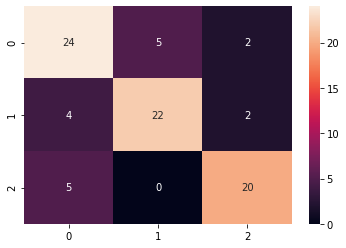

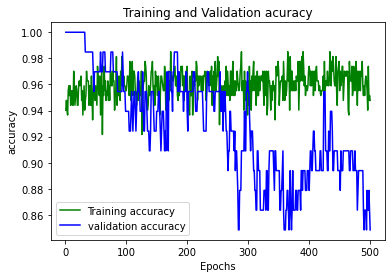

              precision    recall  f1-score   support

        CTAB       0.73      0.77      0.75        31
         SDS       0.81      0.79      0.80        28
     Tween80       0.83      0.80      0.82        25

    accuracy                           0.79        84
   macro avg       0.79      0.79      0.79        84
weighted avg       0.79      0.79      0.79        84



C:\Users\harsh\anaconda3\lib\site-packages\keras\engine\sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


One-vs-One ROC AUC scores:
0.873003 (macro),
0.872228 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.872282 (macro),
0.870722 (weighted by prevalence)
{0: 0.8417528910529519, 1: 0.8896683673469388, 2: 0.8854237288135592}


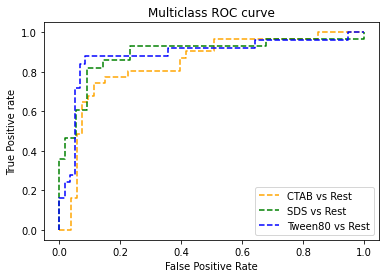

In [65]:
run(model, use_grid=True)

Using models for classification of Concentration 

In [68]:
model = 'DecTree'
feat = 'Conc.(mg/ml)'


1 of kfold 5


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.5580524344569289
Validation_accuracy_score 0.2537313432835821
Test_accuracy_score 0.30952380952380953


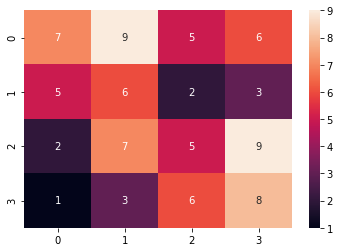

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.47      0.26      0.33        27
          10       0.24      0.38      0.29        16
          70       0.28      0.22      0.24        23
         150       0.31      0.44      0.36        18

    accuracy                           0.31        84
   macro avg       0.32      0.32      0.31        84
weighted avg       0.34      0.31      0.31        84

One-vs-One ROC AUC scores:
0.589731 (macro),
0.586663 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.586630 (macro),
0.582885 (weighted by prevalence)
{0: 0.5695256660168941, 1: 0.5955882352941176, 2: 0.5580898075552387, 3: 0.6233164983164983}


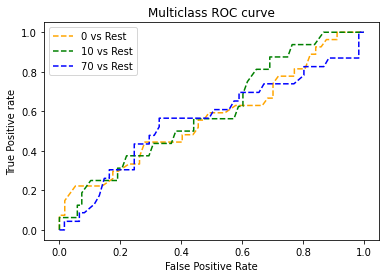


3 of kfold 5


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.4232209737827715
Validation_accuracy_score 0.3582089552238806
Test_accuracy_score 0.25


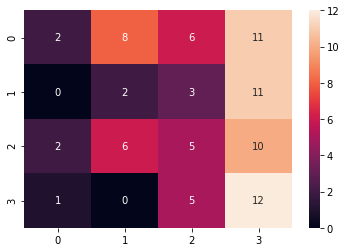

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.40      0.07      0.12        27
          10       0.12      0.12      0.12        16
          70       0.26      0.22      0.24        23
         150       0.27      0.67      0.39        18

    accuracy                           0.25        84
   macro avg       0.27      0.27      0.22        84
weighted avg       0.28      0.25      0.21        84

One-vs-One ROC AUC scores:
0.620054 (macro),
0.620547 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.621156 (macro),
0.620935 (weighted by prevalence)
{0: 0.6390513320337882, 1: 0.5675551470588236, 2: 0.5637918745545261, 3: 0.7142255892255892}


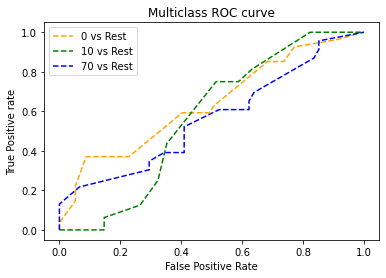


3 of kfold 5


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.3970037453183521
Validation_accuracy_score 0.3582089552238806
Test_accuracy_score 0.2619047619047619


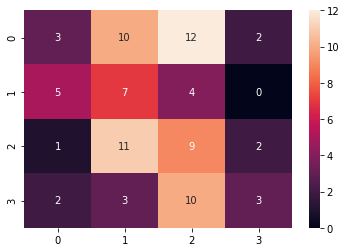

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.27      0.11      0.16        27
          10       0.23      0.44      0.30        16
          70       0.26      0.39      0.31        23
         150       0.43      0.17      0.24        18

    accuracy                           0.26        84
   macro avg       0.30      0.28      0.25        84
weighted avg       0.29      0.26      0.24        84

One-vs-One ROC AUC scores:
0.565960 (macro),
0.561098 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.562752 (macro),
0.555778 (weighted by prevalence)
{0: 0.50909681611436, 1: 0.5758272058823529, 2: 0.5473984319315752, 3: 0.6186868686868686}


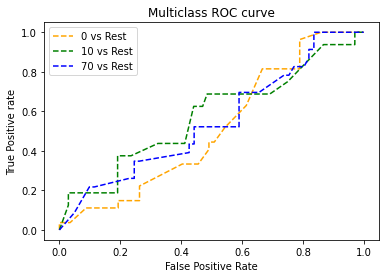


3 of kfold 5


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.48314606741573035
Validation_accuracy_score 0.2537313432835821
Test_accuracy_score 0.2976190476190476


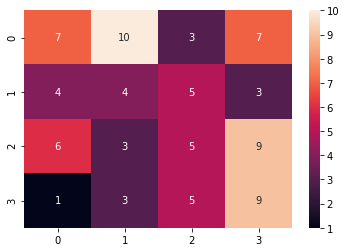

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.39      0.26      0.31        27
          10       0.20      0.25      0.22        16
          70       0.28      0.22      0.24        23
         150       0.32      0.50      0.39        18

    accuracy                           0.30        84
   macro avg       0.30      0.31      0.29        84
weighted avg       0.31      0.30      0.29        84

One-vs-One ROC AUC scores:
0.621447 (macro),
0.619243 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.619660 (macro),
0.617872 (weighted by prevalence)
{0: 0.6159844054580897, 1: 0.6240808823529411, 2: 0.5980042765502496, 3: 0.6405723905723906}


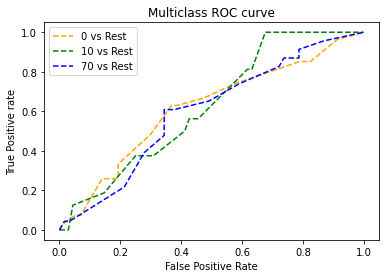


3 of kfold 5


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.44402985074626866
Validation_accuracy_score 0.2727272727272727
Test_accuracy_score 0.3333333333333333


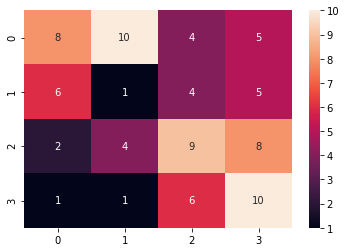

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.47      0.30      0.36        27
          10       0.06      0.06      0.06        16
          70       0.39      0.39      0.39        23
         150       0.36      0.56      0.43        18

    accuracy                           0.33        84
   macro avg       0.32      0.33      0.31        84
weighted avg       0.35      0.33      0.33        84

One-vs-One ROC AUC scores:
0.555599 (macro),
0.559983 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.557534 (macro),
0.568478 (weighted by prevalence)
{0: 0.6039636127355426, 1: 0.419577205882353, 2: 0.6026372059871704, 3: 0.6039562289562289}


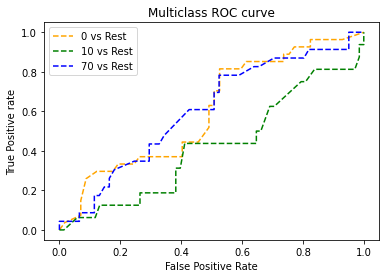

Test_accuracy_score 0.3333333333333333


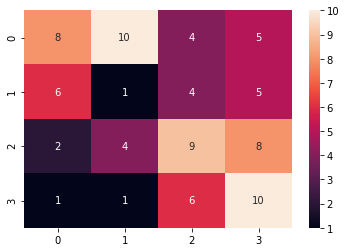

              precision    recall  f1-score   support

           0       0.47      0.30      0.36        27
          10       0.06      0.06      0.06        16
          70       0.39      0.39      0.39        23
         150       0.36      0.56      0.43        18

    accuracy                           0.33        84
   macro avg       0.32      0.33      0.31        84
weighted avg       0.35      0.33      0.33        84

One-vs-One ROC AUC scores:
0.555599 (macro),
0.559983 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.557534 (macro),
0.568478 (weighted by prevalence)
{0: 0.6039636127355426, 1: 0.419577205882353, 2: 0.6026372059871704, 3: 0.6039562289562289}


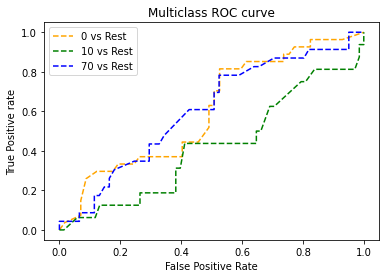

[0.5580524344569289, 0.4232209737827715, 0.3970037453183521, 0.48314606741573035, 0.44402985074626866]
[0.2537313432835821, 0.3582089552238806, 0.3582089552238806, 0.2537313432835821, 0.2727272727272727]
0.46109061434401033
0.2993215739484396
0.3333333333333333


In [55]:
run(model, use_grid=True)


1 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.4633333333333333
Validation_accuracy_score 0.2647058823529412
Test_accuracy_score 0.25


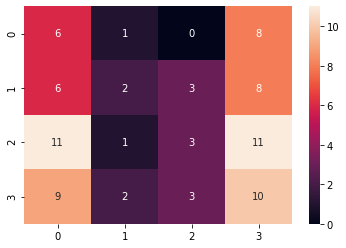

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.19      0.40      0.26        15
          10       0.33      0.11      0.16        19
          70       0.33      0.12      0.17        26
         150       0.27      0.42      0.33        24

    accuracy                           0.25        84
   macro avg       0.28      0.26      0.23        84
weighted avg       0.29      0.25      0.23        84

One-vs-One ROC AUC scores:
0.551669 (macro),
0.546618 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.545934 (macro),
0.541395 (weighted by prevalence)
{0: 0.5743961352657005, 1: 0.5574898785425101, 2: 0.5122679045092838, 3: 0.5395833333333333}


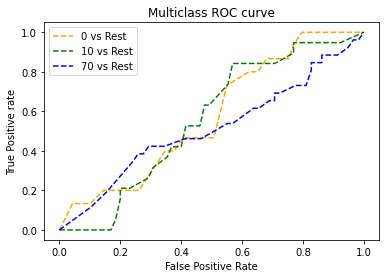


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.48
Validation_accuracy_score 0.4411764705882353
Test_accuracy_score 0.36904761904761907


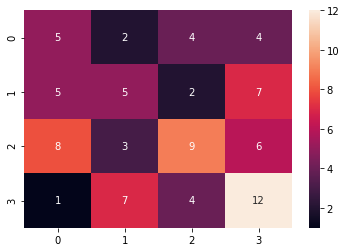

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.26      0.33      0.29        15
          10       0.29      0.26      0.28        19
          70       0.47      0.35      0.40        26
         150       0.41      0.50      0.45        24

    accuracy                           0.37        84
   macro avg       0.36      0.36      0.36        84
weighted avg       0.38      0.37      0.37        84

One-vs-One ROC AUC scores:
0.593372 (macro),
0.593917 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.594404 (macro),
0.592834 (weighted by prevalence)
{0: 0.6835748792270532, 1: 0.4740890688259109, 2: 0.6289787798408488, 3: 0.5909722222222223}


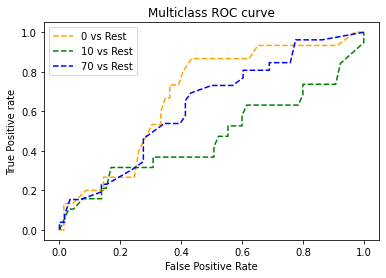


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.44666666666666666
Validation_accuracy_score 0.29411764705882354
Test_accuracy_score 0.2619047619047619


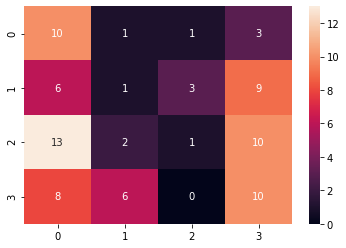

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.27      0.67      0.38        15
          10       0.10      0.05      0.07        19
          70       0.20      0.04      0.06        26
         150       0.31      0.42      0.36        24

    accuracy                           0.26        84
   macro avg       0.22      0.29      0.22        84
weighted avg       0.22      0.26      0.21        84

One-vs-One ROC AUC scores:
0.560701 (macro),
0.555803 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.558895 (macro),
0.547999 (weighted by prevalence)
{0: 0.6922705314009662, 1: 0.47287449392712555, 2: 0.4864058355437666, 3: 0.5840277777777777}


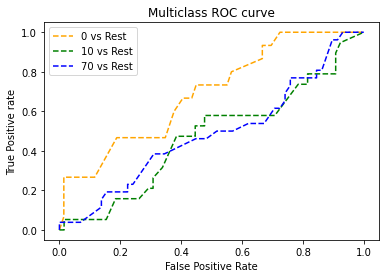


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.36666666666666664
Validation_accuracy_score 0.4117647058823529
Test_accuracy_score 0.21428571428571427


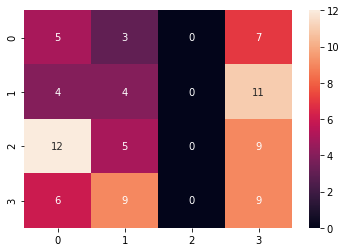

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.19      0.33      0.24        15
          10       0.19      0.21      0.20        19
          70       0.00      0.00      0.00        26
         150       0.25      0.38      0.30        24

    accuracy                           0.21        84
   macro avg       0.16      0.23      0.18        84
weighted avg       0.15      0.21      0.17        84

One-vs-One ROC AUC scores:
0.574622 (macro),
0.572369 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.571698 (macro),
0.570306 (weighted by prevalence)
{0: 0.6371980676328503, 1: 0.5048582995951417, 2: 0.6409151193633953, 3: 0.5038194444444444}


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


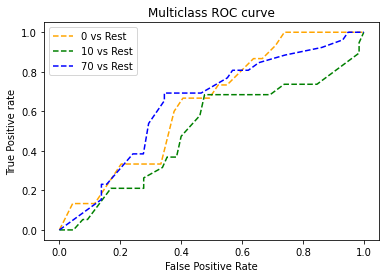


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.5249169435215947
Validation_accuracy_score 0.3333333333333333
Test_accuracy_score 0.3333333333333333


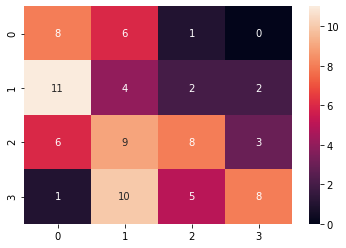

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.31      0.53      0.39        15
          10       0.14      0.21      0.17        19
          70       0.50      0.31      0.38        26
         150       0.62      0.33      0.43        24

    accuracy                           0.33        84
   macro avg       0.39      0.35      0.34        84
weighted avg       0.42      0.33      0.35        84

One-vs-One ROC AUC scores:
0.540913 (macro),
0.544507 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.541305 (macro),
0.548407 (weighted by prevalence)
{0: 0.6169082125603864, 1: 0.2935222672064777, 2: 0.5603448275862069, 3: 0.6944444444444444}


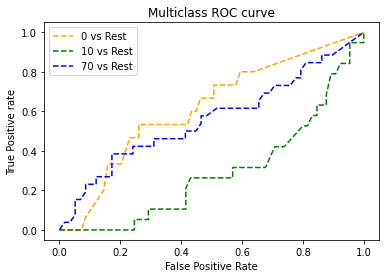


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.4750830564784053
Validation_accuracy_score 0.42424242424242425
Test_accuracy_score 0.20238095238095238


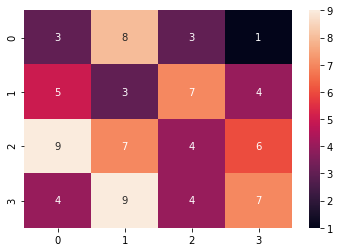

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.14      0.20      0.17        15
          10       0.11      0.16      0.13        19
          70       0.22      0.15      0.18        26
         150       0.39      0.29      0.33        24

    accuracy                           0.20        84
   macro avg       0.22      0.20      0.20        84
weighted avg       0.23      0.20      0.21        84

One-vs-One ROC AUC scores:
0.524340 (macro),
0.520772 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.523042 (macro),
0.513419 (weighted by prevalence)
{0: 0.6545893719806763, 1: 0.4295546558704454, 2: 0.4771220159151193, 3: 0.5309027777777777}


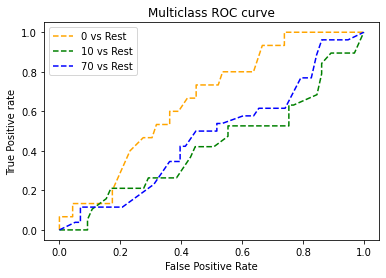


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.4750830564784053
Validation_accuracy_score 0.30303030303030304
Test_accuracy_score 0.35714285714285715


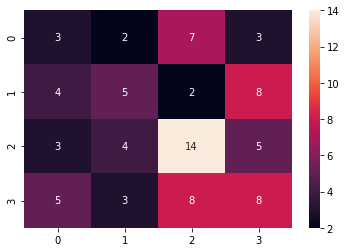

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.20      0.20      0.20        15
          10       0.36      0.26      0.30        19
          70       0.45      0.54      0.49        26
         150       0.33      0.33      0.33        24

    accuracy                           0.36        84
   macro avg       0.34      0.33      0.33        84
weighted avg       0.35      0.36      0.35        84

One-vs-One ROC AUC scores:
0.562408 (macro),
0.563298 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.565611 (macro),
0.562913 (weighted by prevalence)
{0: 0.6545893719806763, 1: 0.4611336032388664, 2: 0.5915119363395226, 3: 0.5552083333333333}


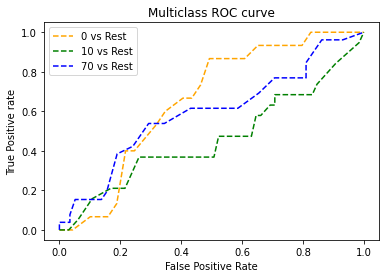


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.40863787375415284
Validation_accuracy_score 0.21212121212121213
Test_accuracy_score 0.25


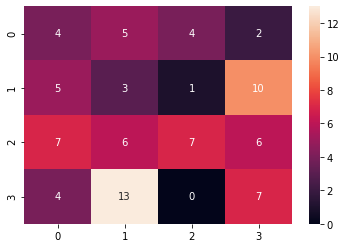

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.20      0.27      0.23        15
          10       0.11      0.16      0.13        19
          70       0.58      0.27      0.37        26
         150       0.28      0.29      0.29        24

    accuracy                           0.25        84
   macro avg       0.29      0.25      0.25        84
weighted avg       0.32      0.25      0.27        84

One-vs-One ROC AUC scores:
0.539325 (macro),
0.540245 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.540393 (macro),
0.542526 (weighted by prevalence)
{0: 0.6236714975845411, 1: 0.3866396761133603, 2: 0.6203580901856763, 3: 0.5309027777777778}


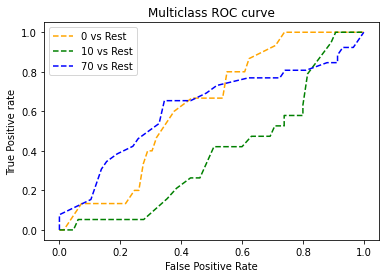


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.4119601328903654
Validation_accuracy_score 0.21212121212121213
Test_accuracy_score 0.2857142857142857


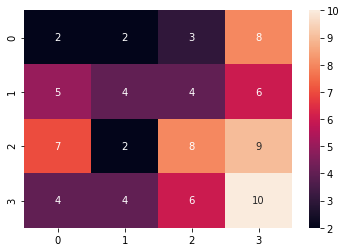

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.11      0.13      0.12        15
          10       0.33      0.21      0.26        19
          70       0.38      0.31      0.34        26
         150       0.30      0.42      0.35        24

    accuracy                           0.29        84
   macro avg       0.28      0.27      0.27        84
weighted avg       0.30      0.29      0.29        84

One-vs-One ROC AUC scores:
0.551568 (macro),
0.552286 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.553233 (macro),
0.552935 (weighted by prevalence)
{0: 0.5859903381642512, 1: 0.5153846153846153, 2: 0.593501326259947, 3: 0.5180555555555555}


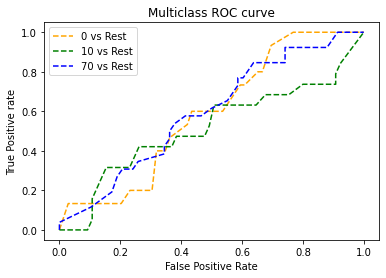


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.5016611295681063
Validation_accuracy_score 0.30303030303030304
Test_accuracy_score 0.25


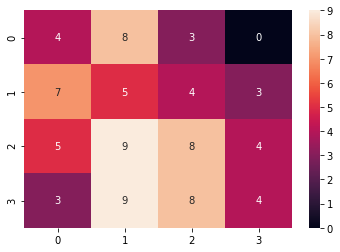

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.21      0.27      0.24        15
          10       0.16      0.26      0.20        19
          70       0.35      0.31      0.33        26
         150       0.36      0.17      0.23        24

    accuracy                           0.25        84
   macro avg       0.27      0.25      0.25        84
weighted avg       0.29      0.25      0.25        84

One-vs-One ROC AUC scores:
0.553795 (macro),
0.553933 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.554606 (macro),
0.551672 (weighted by prevalence)
{0: 0.6333333333333334, 1: 0.44777327935222666, 2: 0.5185676392572944, 3: 0.61875}


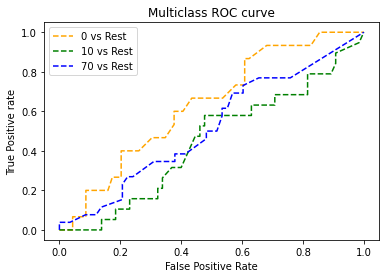

Test_accuracy_score 0.25


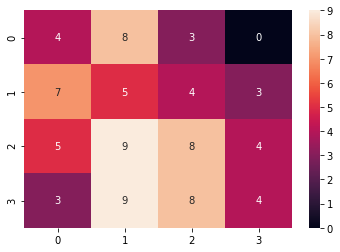

              precision    recall  f1-score   support

           0       0.21      0.27      0.24        15
          10       0.16      0.26      0.20        19
          70       0.35      0.31      0.33        26
         150       0.36      0.17      0.23        24

    accuracy                           0.25        84
   macro avg       0.27      0.25      0.25        84
weighted avg       0.29      0.25      0.25        84

One-vs-One ROC AUC scores:
0.553795 (macro),
0.553933 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.554606 (macro),
0.551672 (weighted by prevalence)
{0: 0.6333333333333334, 1: 0.44777327935222666, 2: 0.5185676392572944, 3: 0.61875}


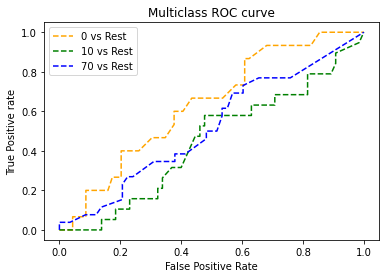

[0.4633333333333333, 0.48, 0.44666666666666666, 0.36666666666666664, 0.5249169435215947, 0.4750830564784053, 0.4750830564784053, 0.40863787375415284, 0.4119601328903654, 0.5016611295681063]
[0.2647058823529412, 0.4411764705882353, 0.29411764705882354, 0.4117647058823529, 0.3333333333333333, 0.42424242424242425, 0.30303030303030304, 0.21212121212121213, 0.21212121212121213, 0.30303030303030304]
0.45540088593576955
0.31996434937611407
0.25


In [69]:
run(model, use_grid=True)

In [48]:
model = 'randomForestClassifier'
feat = 'Conc.(mg/ml)'


1 of kfold 7


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 1.0
Validation_accuracy_score 0.4583333333333333
Test_accuracy_score 0.5119047619047619


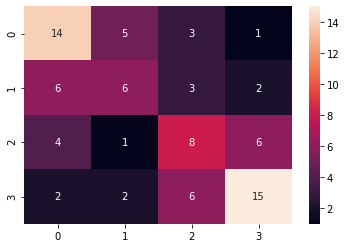

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.54      0.61      0.57        23
          10       0.43      0.35      0.39        17
          70       0.40      0.42      0.41        19
         150       0.62      0.60      0.61        25

    accuracy                           0.51        84
   macro avg       0.50      0.50      0.50        84
weighted avg       0.51      0.51      0.51        84

One-vs-One ROC AUC scores:
0.784331 (macro),
0.787251 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.786642 (macro),
0.792984 (weighted by prevalence)
{0: 0.8296507483962937, 1: 0.7928007023705004, 2: 0.6753036437246963, 3: 0.8488135593220338}


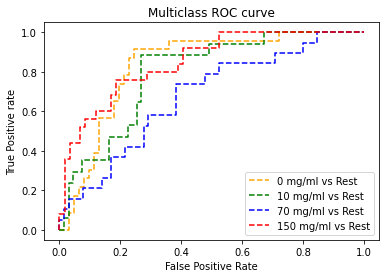


3 of kfold 7


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.9895104895104895
Validation_accuracy_score 0.5
Test_accuracy_score 0.5119047619047619


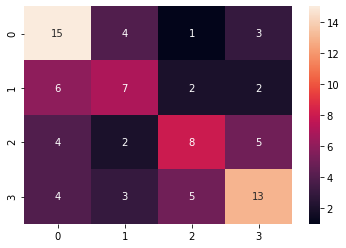

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.52      0.65      0.58        23
          10       0.44      0.41      0.42        17
          70       0.50      0.42      0.46        19
         150       0.57      0.52      0.54        25

    accuracy                           0.51        84
   macro avg       0.50      0.50      0.50        84
weighted avg       0.51      0.51      0.51        84

One-vs-One ROC AUC scores:
0.774382 (macro),
0.775705 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.775230 (macro),
0.778940 (weighted by prevalence)
{0: 0.8189593727726301, 1: 0.7954345917471466, 2: 0.6817813765182186, 3: 0.8047457627118644}


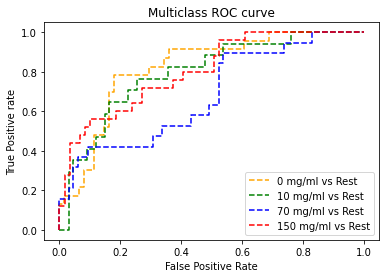


3 of kfold 7


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.9755244755244755
Validation_accuracy_score 0.3541666666666667
Test_accuracy_score 0.4880952380952381


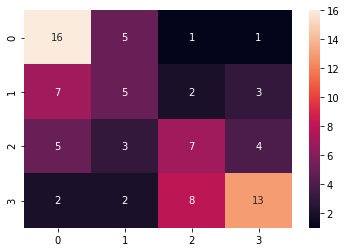

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.53      0.70      0.60        23
          10       0.33      0.29      0.31        17
          70       0.39      0.37      0.38        19
         150       0.62      0.52      0.57        25

    accuracy                           0.49        84
   macro avg       0.47      0.47      0.46        84
weighted avg       0.49      0.49      0.48        84

One-vs-One ROC AUC scores:
0.774207 (macro),
0.776458 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.775732 (macro),
0.781112 (weighted by prevalence)
{0: 0.8317890235210263, 1: 0.7550482879719052, 2: 0.7093117408906883, 3: 0.8067796610169491}


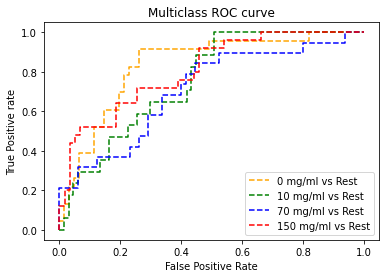


3 of kfold 7


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 1.0
Validation_accuracy_score 0.7083333333333334
Test_accuracy_score 0.5476190476190477


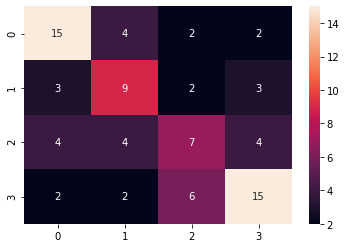

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.62      0.65      0.64        23
          10       0.47      0.53      0.50        17
          70       0.41      0.37      0.39        19
         150       0.62      0.60      0.61        25

    accuracy                           0.55        84
   macro avg       0.53      0.54      0.53        84
weighted avg       0.55      0.55      0.55        84

One-vs-One ROC AUC scores:
0.798910 (macro),
0.801322 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.800955 (macro),
0.806197 (weighted by prevalence)
{0: 0.8439059158945118, 1: 0.8366988586479368, 2: 0.6655870445344129, 3: 0.8576271186440678}


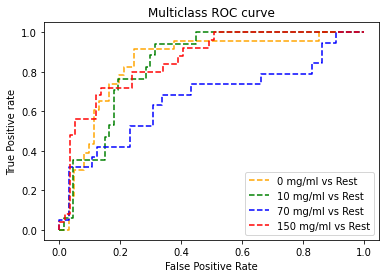


3 of kfold 7


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 1.0
Validation_accuracy_score 0.5
Test_accuracy_score 0.5357142857142857


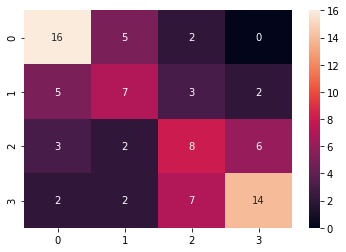

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.62      0.70      0.65        23
          10       0.44      0.41      0.42        17
          70       0.40      0.42      0.41        19
         150       0.64      0.56      0.60        25

    accuracy                           0.54        84
   macro avg       0.52      0.52      0.52        84
weighted avg       0.54      0.54      0.53        84

One-vs-One ROC AUC scores:
0.803628 (macro),
0.806166 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.805914 (macro),
0.810932 (weighted by prevalence)
{0: 0.8731290092658588, 1: 0.8094820017559263, 2: 0.7085020242914979, 3: 0.8325423728813559}


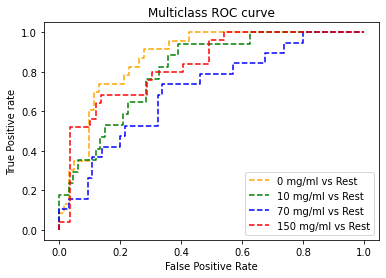


3 of kfold 7


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 1.0
Validation_accuracy_score 0.574468085106383
Test_accuracy_score 0.5119047619047619


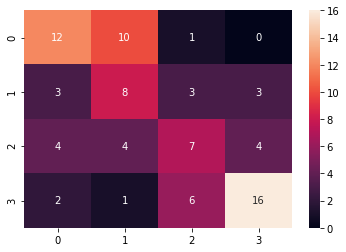

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.57      0.52      0.55        23
          10       0.35      0.47      0.40        17
          70       0.41      0.37      0.39        19
         150       0.70      0.64      0.67        25

    accuracy                           0.51        84
   macro avg       0.51      0.50      0.50        84
weighted avg       0.53      0.51      0.52        84

One-vs-One ROC AUC scores:
0.784458 (macro),
0.786437 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.785827 (macro),
0.790635 (weighted by prevalence)
{0: 0.8374910905203136, 1: 0.8314310798946445, 2: 0.6404858299595141, 3: 0.8338983050847457}


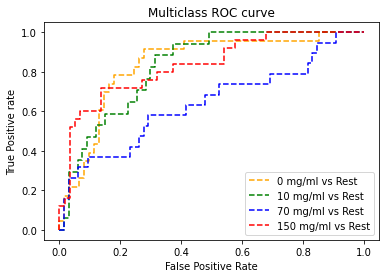


3 of kfold 7


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 1.0
Validation_accuracy_score 0.2978723404255319
Test_accuracy_score 0.47619047619047616


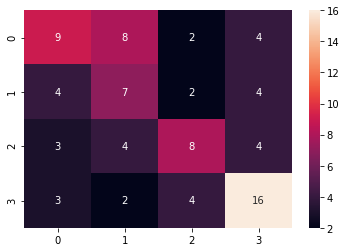

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.47      0.39      0.43        23
          10       0.33      0.41      0.37        17
          70       0.50      0.42      0.46        19
         150       0.57      0.64      0.60        25

    accuracy                           0.48        84
   macro avg       0.47      0.47      0.46        84
weighted avg       0.48      0.48      0.48        84

One-vs-One ROC AUC scores:
0.763882 (macro),
0.768164 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.766028 (macro),
0.776209 (weighted by prevalence)
{0: 0.827512473271561, 1: 0.7585601404741, 2: 0.6129554655870445, 3: 0.8650847457627119}


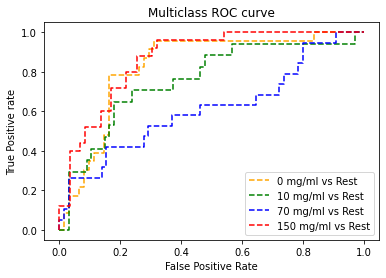

Test_accuracy_score 0.47619047619047616


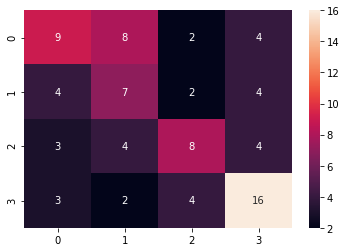

              precision    recall  f1-score   support

           0       0.47      0.39      0.43        23
          10       0.33      0.41      0.37        17
          70       0.50      0.42      0.46        19
         150       0.57      0.64      0.60        25

    accuracy                           0.48        84
   macro avg       0.47      0.47      0.46        84
weighted avg       0.48      0.48      0.48        84

One-vs-One ROC AUC scores:
0.763882 (macro),
0.768164 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.766028 (macro),
0.776209 (weighted by prevalence)
{0: 0.827512473271561, 1: 0.7585601404741, 2: 0.6129554655870445, 3: 0.8650847457627119}


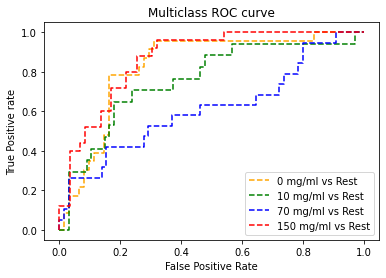

[1.0, 0.9895104895104895, 0.9755244755244755, 1.0, 1.0, 1.0, 1.0]
[0.4583333333333333, 0.5, 0.3541666666666667, 0.7083333333333334, 0.5, 0.574468085106383, 0.2978723404255319]
0.995004995004995
0.4847391084093213
0.47619047619047616


In [49]:
run(model, use_grid=True)

In [ ]:
run(model, use_grid=False)

1.0
0.49206349206349204


In [72]:
model = 'svm'
feat = 'Conc.(mg/ml)'


1 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.5966666666666667
Validation_accuracy_score 0.35294117647058826
Test_accuracy_score 0.39285714285714285


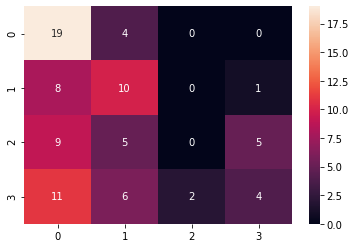

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.40      0.83      0.54        23
          10       0.40      0.53      0.45        19
          70       0.00      0.00      0.00        19
         150       0.40      0.17      0.24        23

    accuracy                           0.39        84
   macro avg       0.30      0.38      0.31        84
weighted avg       0.31      0.39      0.32        84

One-vs-One ROC AUC scores:
0.712716 (macro),
0.715975 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.715845 (macro),
0.721287 (weighted by prevalence)
{0: 0.8446186742694226, 1: 0.7036437246963563, 2: 0.6137651821862348, 3: 0.7013542409123308}


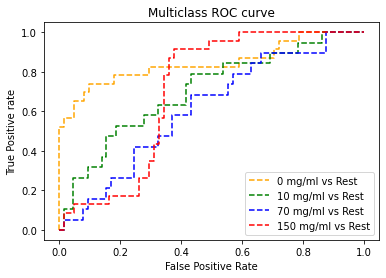


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.5866666666666667
Validation_accuracy_score 0.35294117647058826
Test_accuracy_score 0.42857142857142855


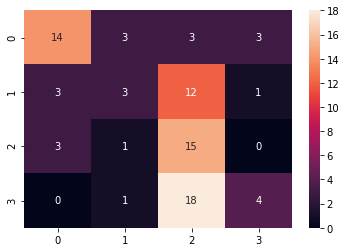

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.70      0.61      0.65        23
          10       0.38      0.16      0.22        19
          70       0.31      0.79      0.45        19
         150       0.50      0.17      0.26        23

    accuracy                           0.43        84
   macro avg       0.47      0.43      0.39        84
weighted avg       0.48      0.43      0.40        84

One-vs-One ROC AUC scores:
0.678494 (macro),
0.681813 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.681032 (macro),
0.687516 (weighted by prevalence)
{0: 0.8517462580185318, 1: 0.5635627530364372, 2: 0.6623481781376518, 3: 0.6464718460441911}


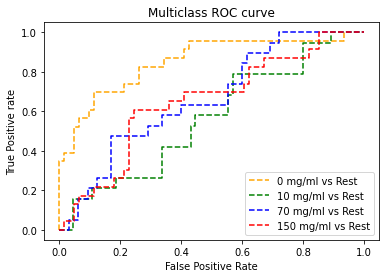


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.7466666666666667
Validation_accuracy_score 0.29411764705882354
Test_accuracy_score 0.5238095238095238


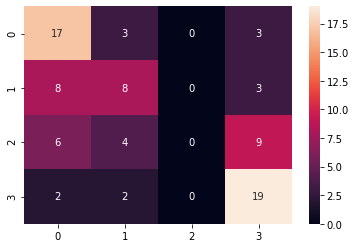

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.52      0.74      0.61        23
          10       0.47      0.42      0.44        19
          70       0.00      0.00      0.00        19
         150       0.56      0.83      0.67        23

    accuracy                           0.52        84
   macro avg       0.39      0.50      0.43        84
weighted avg       0.40      0.52      0.45        84

One-vs-One ROC AUC scores:
0.739610 (macro),
0.744606 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.744008 (macro),
0.752402 (weighted by prevalence)
{0: 0.8104062722736992, 1: 0.6663967611336032, 2: 0.6453441295546558, 3: 0.8538845331432644}


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


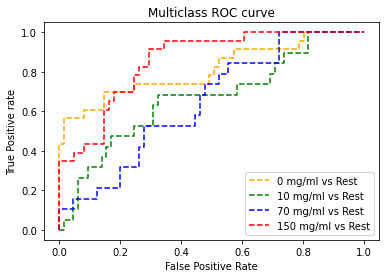


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.65
Validation_accuracy_score 0.38235294117647056
Test_accuracy_score 0.5


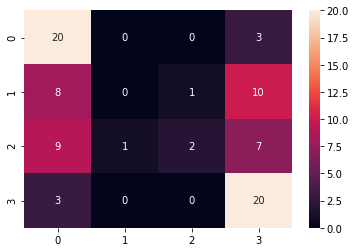

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.50      0.87      0.63        23
          10       0.00      0.00      0.00        19
          70       0.67      0.11      0.18        19
         150       0.50      0.87      0.63        23

    accuracy                           0.50        84
   macro avg       0.42      0.46      0.36        84
weighted avg       0.42      0.50      0.39        84

One-vs-One ROC AUC scores:
0.708099 (macro),
0.715130 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.712846 (macro),
0.727025 (weighted by prevalence)
{0: 0.8731290092658588, 1: 0.5481781376518218, 2: 0.5797570850202429, 3: 0.8503207412687099}


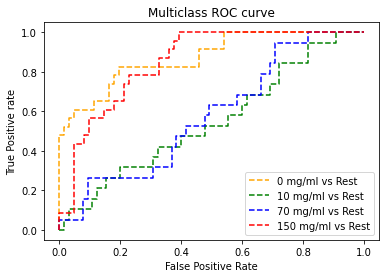


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.6212624584717608
Validation_accuracy_score 0.42424242424242425
Test_accuracy_score 0.42857142857142855


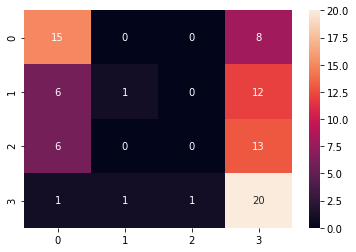

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.54      0.65      0.59        23
          10       0.50      0.05      0.10        19
          70       0.00      0.00      0.00        19
         150       0.38      0.87      0.53        23

    accuracy                           0.43        84
   macro avg       0.35      0.39      0.30        84
weighted avg       0.36      0.43      0.33        84

One-vs-One ROC AUC scores:
0.723373 (macro),
0.730340 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.729880 (macro),
0.740978 (weighted by prevalence)
{0: 0.857448325017819, 1: 0.5927125506072874, 2: 0.6340080971659918, 3: 0.8353528153955808}


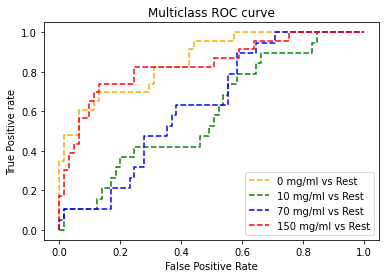


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.6013289036544851
Validation_accuracy_score 0.42424242424242425
Test_accuracy_score 0.47619047619047616


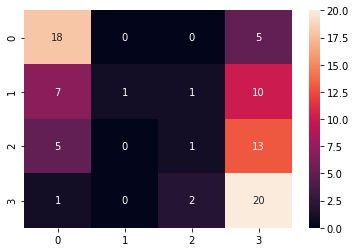

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.58      0.78      0.67        23
          10       1.00      0.05      0.10        19
          70       0.25      0.05      0.09        19
         150       0.42      0.87      0.56        23

    accuracy                           0.48        84
   macro avg       0.56      0.44      0.35        84
weighted avg       0.56      0.48      0.38        84

One-vs-One ROC AUC scores:
0.739478 (macro),
0.746123 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.745292 (macro),
0.756584 (weighted by prevalence)
{0: 0.8631503920171062, 1: 0.5846153846153845, 2: 0.6688259109311742, 3: 0.864575908766928}


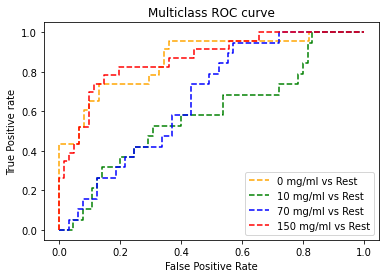


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.6179401993355482
Validation_accuracy_score 0.18181818181818182
Test_accuracy_score 0.47619047619047616


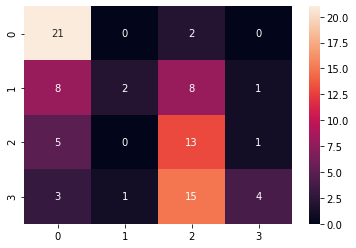

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.57      0.91      0.70        23
          10       0.67      0.11      0.18        19
          70       0.34      0.68      0.46        19
         150       0.67      0.17      0.28        23

    accuracy                           0.48        84
   macro avg       0.56      0.47      0.40        84
weighted avg       0.57      0.48      0.41        84

One-vs-One ROC AUC scores:
0.657247 (macro),
0.658739 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.659532 (macro),
0.661037 (weighted by prevalence)
{0: 0.8588738417676408, 1: 0.6121457489878542, 2: 0.6753036437246963, 3: 0.4918032786885246}


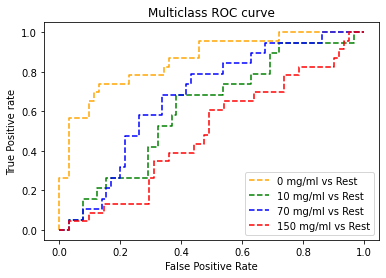


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.7342192691029901
Validation_accuracy_score 0.3333333333333333
Test_accuracy_score 0.42857142857142855


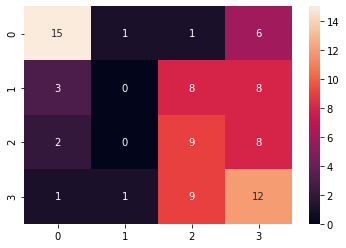

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.71      0.65      0.68        23
          10       0.00      0.00      0.00        19
          70       0.33      0.47      0.39        19
         150       0.35      0.52      0.42        23

    accuracy                           0.43        84
   macro avg       0.35      0.41      0.37        84
weighted avg       0.37      0.43      0.39        84

One-vs-One ROC AUC scores:
0.764973 (macro),
0.769260 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.767947 (macro),
0.776539 (weighted by prevalence)
{0: 0.9002138275124733, 1: 0.6226720647773278, 2: 0.7327935222672065, 3: 0.8161083392729864}


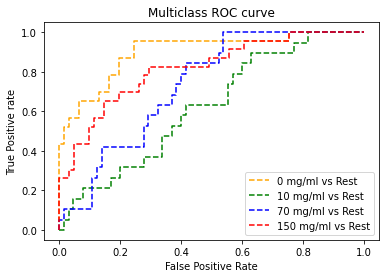


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.584717607973422
Validation_accuracy_score 0.45454545454545453
Test_accuracy_score 0.4523809523809524


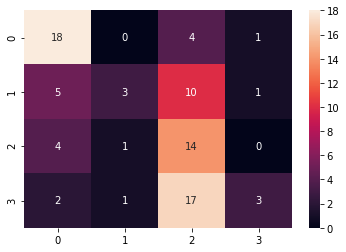

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.62      0.78      0.69        23
          10       0.60      0.16      0.25        19
          70       0.31      0.74      0.44        19
         150       0.60      0.13      0.21        23

    accuracy                           0.45        84
   macro avg       0.53      0.45      0.40        84
weighted avg       0.54      0.45      0.40        84

One-vs-One ROC AUC scores:
0.667796 (macro),
0.672642 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.672378 (macro),
0.680466 (weighted by prevalence)
{0: 0.8809693513898789, 1: 0.5506072874493927, 2: 0.6242914979757085, 3: 0.6336421952957947}


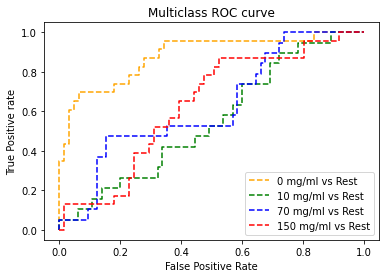


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.5913621262458472
Validation_accuracy_score 0.3333333333333333
Test_accuracy_score 0.4166666666666667


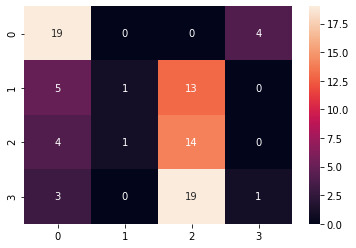

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.61      0.83      0.70        23
          10       0.50      0.05      0.10        19
          70       0.30      0.74      0.43        19
         150       0.20      0.04      0.07        23

    accuracy                           0.42        84
   macro avg       0.40      0.41      0.33        84
weighted avg       0.40      0.42      0.33        84

One-vs-One ROC AUC scores:
0.697833 (macro),
0.700710 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.700401 (macro),
0.705413 (weighted by prevalence)
{0: 0.8681397006414827, 1: 0.6097165991902833, 2: 0.6858299595141699, 3: 0.6379187455452602}


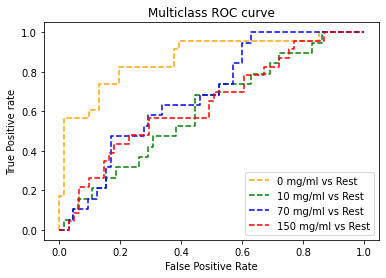

Test_accuracy_score 0.4166666666666667


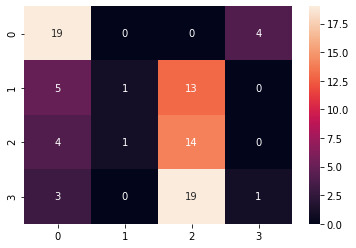

              precision    recall  f1-score   support

           0       0.61      0.83      0.70        23
          10       0.50      0.05      0.10        19
          70       0.30      0.74      0.43        19
         150       0.20      0.04      0.07        23

    accuracy                           0.42        84
   macro avg       0.40      0.41      0.33        84
weighted avg       0.40      0.42      0.33        84

One-vs-One ROC AUC scores:
0.697833 (macro),
0.700710 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.700401 (macro),
0.705413 (weighted by prevalence)
{0: 0.8681397006414827, 1: 0.6097165991902833, 2: 0.6858299595141699, 3: 0.6379187455452602}


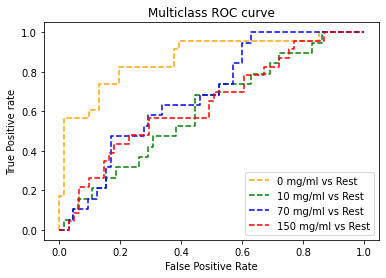

[0.5966666666666667, 0.5866666666666667, 0.7466666666666667, 0.65, 0.6212624584717608, 0.6013289036544851, 0.6179401993355482, 0.7342192691029901, 0.584717607973422, 0.5913621262458472]
[0.35294117647058826, 0.35294117647058826, 0.29411764705882354, 0.38235294117647056, 0.42424242424242425, 0.42424242424242425, 0.18181818181818182, 0.3333333333333333, 0.45454545454545453, 0.3333333333333333]
0.6330830564784053
0.3533868092691622
0.4166666666666667


In [74]:
run(model, use_grid=True)

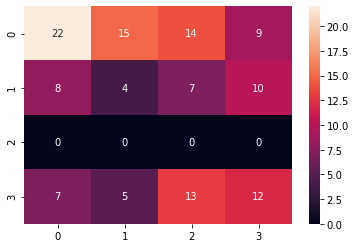

              precision    recall  f1-score   support

           0       0.37      0.59      0.45        37
          10       0.14      0.17      0.15        24
          70       0.00      0.00      0.00        34
         150       0.32      0.39      0.35        31

    accuracy                           0.30       126
   macro avg       0.21      0.29      0.24       126
weighted avg       0.21      0.30      0.25       126

One-vs-One ROC AUC scores:
0.555208 (macro),
0.555187 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.555546 (macro),
0.555415 (weighted by prevalence)


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


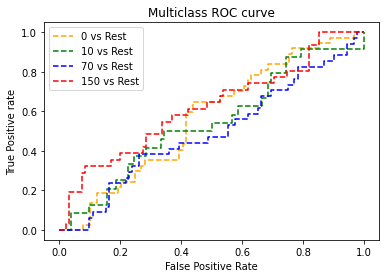

0.3287671232876712
0.30158730158730157


In [99]:
run(model, use_grid=False)

In [67]:
model = 'gbm'
feat = 'Conc.(mg/ml)'


1 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.86
Validation_accuracy_score 0.38235294117647056
Test_accuracy_score 0.36904761904761907


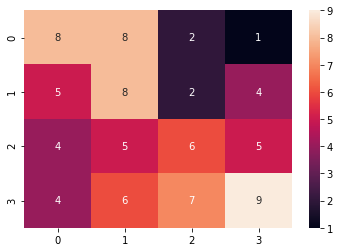

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.38      0.42      0.40        19
          10       0.30      0.42      0.35        19
          70       0.35      0.30      0.32        20
         150       0.47      0.35      0.40        26

    accuracy                           0.37        84
   macro avg       0.38      0.37      0.37        84
weighted avg       0.38      0.37      0.37        84

One-vs-One ROC AUC scores:
0.642677 (macro),
0.643049 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.642841 (macro),
0.643411 (weighted by prevalence)
{0: 0.6582995951417003, 1: 0.6097165991902833, 2: 0.65546875, 3: 0.6478779840848806}


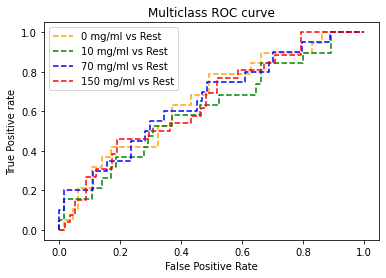


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.9133333333333333
Validation_accuracy_score 0.23529411764705882
Test_accuracy_score 0.40476190476190477


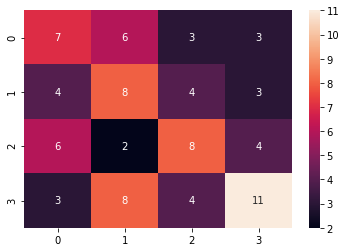

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.35      0.37      0.36        19
          10       0.33      0.42      0.37        19
          70       0.42      0.40      0.41        20
         150       0.52      0.42      0.47        26

    accuracy                           0.40        84
   macro avg       0.41      0.40      0.40        84
weighted avg       0.42      0.40      0.41        84

One-vs-One ROC AUC scores:
0.634849 (macro),
0.635335 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.635337 (macro),
0.635780 (weighted by prevalence)
{0: 0.6615384615384615, 1: 0.6113360323886639, 2: 0.6265625, 3: 0.6419098143236075}


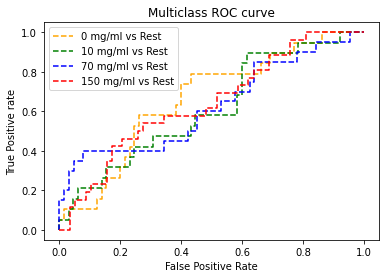


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.74
Validation_accuracy_score 0.4117647058823529
Test_accuracy_score 0.35714285714285715


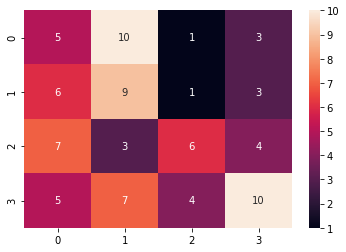

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.22      0.26      0.24        19
          10       0.31      0.47      0.38        19
          70       0.50      0.30      0.37        20
         150       0.50      0.38      0.43        26

    accuracy                           0.36        84
   macro avg       0.38      0.36      0.36        84
weighted avg       0.39      0.36      0.36        84

One-vs-One ROC AUC scores:
0.615192 (macro),
0.617441 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.617943 (macro),
0.620067 (weighted by prevalence)
{0: 0.5967611336032388, 1: 0.6283400809716599, 2: 0.60078125, 3: 0.6458885941644563}


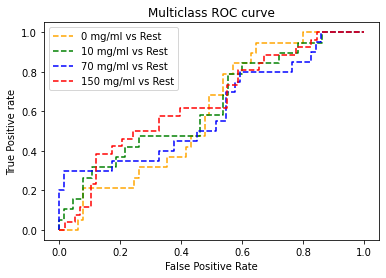


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.8633333333333333
Validation_accuracy_score 0.4411764705882353
Test_accuracy_score 0.40476190476190477


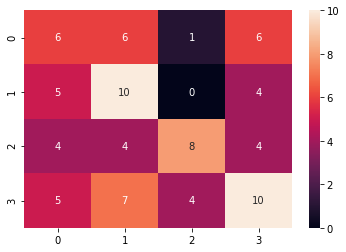

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.30      0.32      0.31        19
          10       0.37      0.53      0.43        19
          70       0.62      0.40      0.48        20
         150       0.42      0.38      0.40        26

    accuracy                           0.40        84
   macro avg       0.43      0.41      0.41        84
weighted avg       0.43      0.40      0.41        84

One-vs-One ROC AUC scores:
0.647428 (macro),
0.646795 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.646928 (macro),
0.645742 (weighted by prevalence)
{0: 0.6097165991902833, 1: 0.6502024291497976, 2: 0.7031250000000001, 3: 0.6246684350132626}


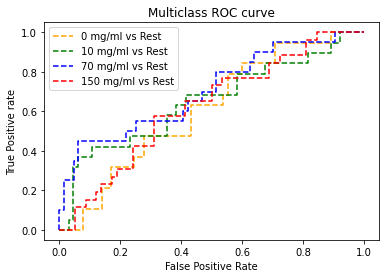


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.7774086378737541
Validation_accuracy_score 0.5151515151515151
Test_accuracy_score 0.36904761904761907


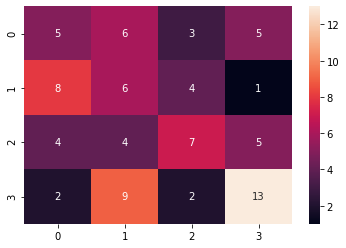

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.26      0.26      0.26        19
          10       0.24      0.32      0.27        19
          70       0.44      0.35      0.39        20
         150       0.54      0.50      0.52        26

    accuracy                           0.37        84
   macro avg       0.37      0.36      0.36        84
weighted avg       0.39      0.37      0.37        84

One-vs-One ROC AUC scores:
0.616577 (macro),
0.621112 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.621885 (macro),
0.626779 (weighted by prevalence)
{0: 0.5514170040485831, 1: 0.620242914979757, 2: 0.6375, 3: 0.6783819628647214}


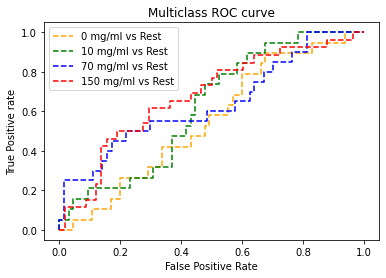


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.8704318936877077
Validation_accuracy_score 0.42424242424242425
Test_accuracy_score 0.38095238095238093


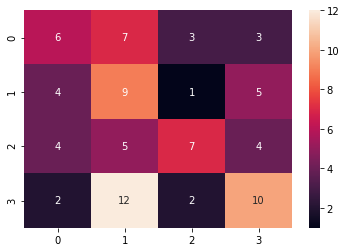

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.38      0.32      0.34        19
          10       0.27      0.47      0.35        19
          70       0.54      0.35      0.42        20
         150       0.45      0.38      0.42        26

    accuracy                           0.38        84
   macro avg       0.41      0.38      0.38        84
weighted avg       0.42      0.38      0.39        84

One-vs-One ROC AUC scores:
0.656611 (macro),
0.655779 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.656429 (macro),
0.654061 (weighted by prevalence)
{0: 0.7109311740890688, 1: 0.5943319838056679, 2: 0.6984374999999999, 3: 0.6220159151193634}


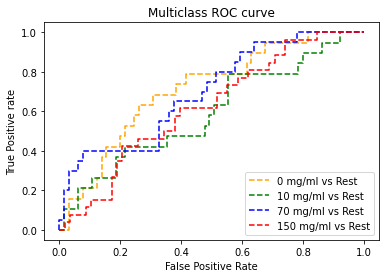


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.9136212624584718
Validation_accuracy_score 0.48484848484848486
Test_accuracy_score 0.4166666666666667


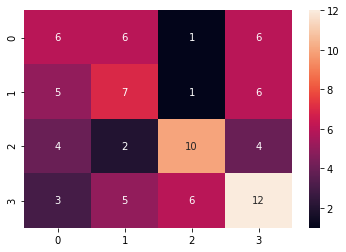

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.33      0.32      0.32        19
          10       0.35      0.37      0.36        19
          70       0.56      0.50      0.53        20
         150       0.43      0.46      0.44        26

    accuracy                           0.42        84
   macro avg       0.42      0.41      0.41        84
weighted avg       0.42      0.42      0.42        84

One-vs-One ROC AUC scores:
0.646327 (macro),
0.645664 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.646498 (macro),
0.644122 (weighted by prevalence)
{0: 0.6421052631578946, 1: 0.6080971659919028, 2: 0.7296875, 3: 0.6061007957559682}


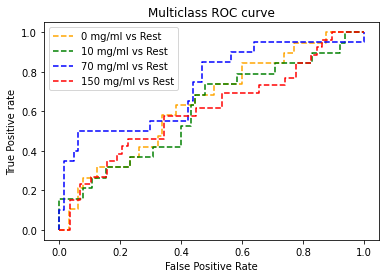


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.7807308970099668
Validation_accuracy_score 0.36363636363636365
Test_accuracy_score 0.38095238095238093


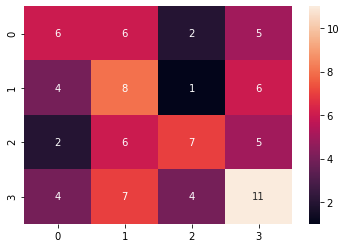

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.38      0.32      0.34        19
          10       0.30      0.42      0.35        19
          70       0.50      0.35      0.41        20
         150       0.41      0.42      0.42        26

    accuracy                           0.38        84
   macro avg       0.39      0.38      0.38        84
weighted avg       0.40      0.38      0.38        84

One-vs-One ROC AUC scores:
0.616922 (macro),
0.615766 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.615702 (macro),
0.613985 (weighted by prevalence)
{0: 0.6421052631578947, 1: 0.5724696356275303, 2: 0.6593749999999999, 3: 0.5888594164456233}


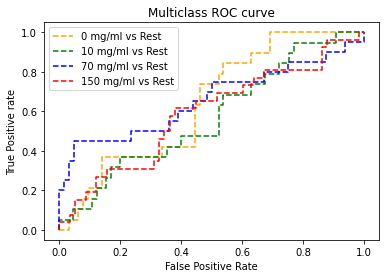


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.7906976744186046
Validation_accuracy_score 0.45454545454545453
Test_accuracy_score 0.39285714285714285


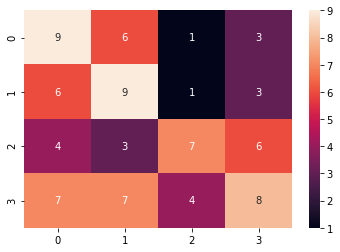

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.35      0.47      0.40        19
          10       0.36      0.47      0.41        19
          70       0.54      0.35      0.42        20
         150       0.40      0.31      0.35        26

    accuracy                           0.39        84
   macro avg       0.41      0.40      0.40        84
weighted avg       0.41      0.39      0.39        84

One-vs-One ROC AUC scores:
0.645042 (macro),
0.643001 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.643313 (macro),
0.639707 (weighted by prevalence)
{0: 0.6817813765182186, 1: 0.608906882591093, 2: 0.6890625, 3: 0.5935013262599469}


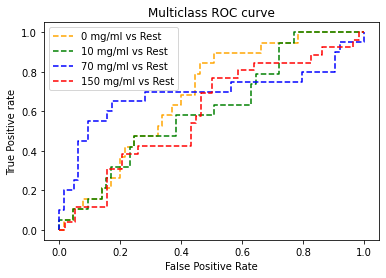


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.920265780730897
Validation_accuracy_score 0.36363636363636365
Test_accuracy_score 0.40476190476190477


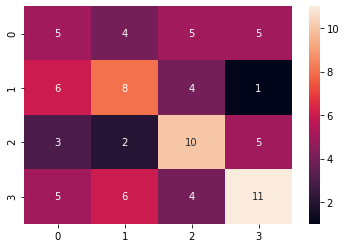

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.26      0.26      0.26        19
          10       0.40      0.42      0.41        19
          70       0.43      0.50      0.47        20
         150       0.50      0.42      0.46        26

    accuracy                           0.40        84
   macro avg       0.40      0.40      0.40        84
weighted avg       0.41      0.40      0.40        84

One-vs-One ROC AUC scores:
0.660613 (macro),
0.662224 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.662989 (macro),
0.663881 (weighted by prevalence)
{0: 0.6323886639676113, 1: 0.671255060728745, 2: 0.6765625000000001, 3: 0.6717506631299734}


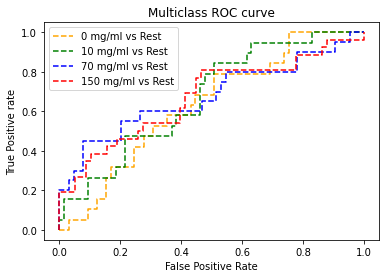

Test_accuracy_score 0.40476190476190477


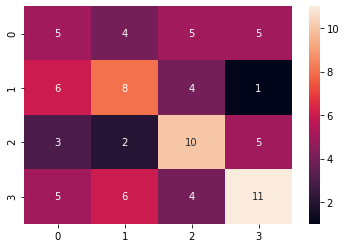

              precision    recall  f1-score   support

           0       0.26      0.26      0.26        19
          10       0.40      0.42      0.41        19
          70       0.43      0.50      0.47        20
         150       0.50      0.42      0.46        26

    accuracy                           0.40        84
   macro avg       0.40      0.40      0.40        84
weighted avg       0.41      0.40      0.40        84

One-vs-One ROC AUC scores:
0.660613 (macro),
0.662224 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.662989 (macro),
0.663881 (weighted by prevalence)
{0: 0.6323886639676113, 1: 0.671255060728745, 2: 0.6765625000000001, 3: 0.6717506631299734}


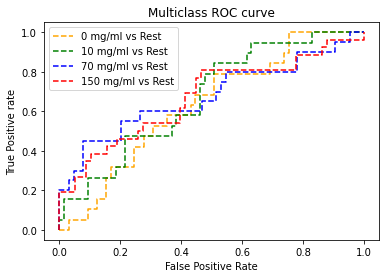

[0.86, 0.9133333333333333, 0.74, 0.8633333333333333, 0.7774086378737541, 0.8704318936877077, 0.9136212624584718, 0.7807308970099668, 0.7906976744186046, 0.920265780730897]
[0.38235294117647056, 0.23529411764705882, 0.4117647058823529, 0.4411764705882353, 0.5151515151515151, 0.42424242424242425, 0.48484848484848486, 0.36363636363636365, 0.45454545454545453, 0.36363636363636365]
0.842982281284607
0.4076648841354724
0.40476190476190477


In [68]:
run(model, use_grid=True)

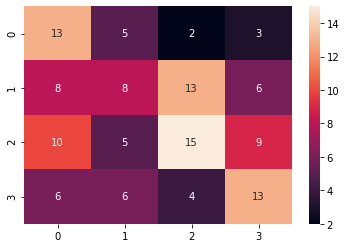

              precision    recall  f1-score   support

           0       0.57      0.35      0.43        37
          10       0.23      0.33      0.27        24
          70       0.38      0.44      0.41        34
         150       0.45      0.42      0.43        31

    accuracy                           0.39       126
   macro avg       0.41      0.39      0.39       126
weighted avg       0.42      0.39      0.40       126

One-vs-One ROC AUC scores:
0.658914 (macro),
0.661032 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.662818 (macro),
0.664043 (weighted by prevalence)


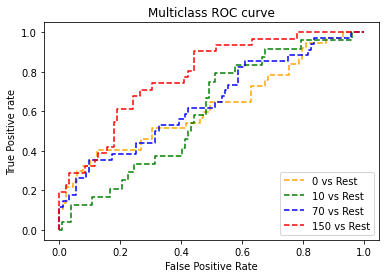

0.9863013698630136
0.3888888888888889


In [208]:
run(model, use_grid=False)

In [77]:
model = 'naiveBayes'
feat = 'Conc.(mg/ml)'

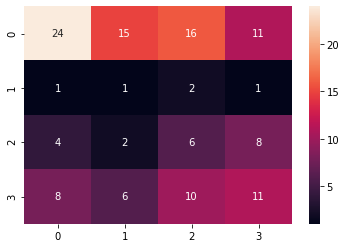

              precision    recall  f1-score   support

           0       0.36      0.65      0.47        37
          10       0.20      0.04      0.07        24
          70       0.30      0.18      0.22        34
         150       0.31      0.35      0.33        31

    accuracy                           0.33       126
   macro avg       0.29      0.31      0.27       126
weighted avg       0.30      0.33      0.29       126

One-vs-One ROC AUC scores:
0.522089 (macro),
0.523979 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.523670 (macro),
0.527148 (weighted by prevalence)


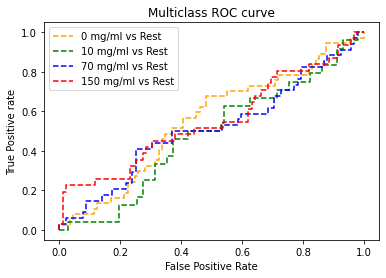

0.3493150684931507
0.3333333333333333


In [78]:
run(model, use_grid=True)

In [61]:
model = 'nn'
feat = 'Conc.(mg/ml)'

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:293: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  warnings.warn(


-----Cross Validation 1/5-----
Epoch 1/500
9/9 [==============================] - 4s 103ms/step - loss: 2.2422 - accuracy: 0.2777 - val_loss: 1.3955 - val_accuracy: 0.2537
Epoch 2/500
9/9 [==============================] - 0s 10ms/step - loss: 2.0665 - accuracy: 0.2816 - val_loss: 1.4000 - val_accuracy: 0.2388
Epoch 3/500
9/9 [==============================] - 0s 11ms/step - loss: 1.8869 - accuracy: 0.2702 - val_loss: 1.4122 - val_accuracy: 0.2388
Epoch 4/500
9/9 [==============================] - 0s 11ms/step - loss: 1.9702 - accuracy: 0.2728 - val_loss: 1.4265 - val_accuracy: 0.2388
Epoch 5/500
9/9 [==============================] - 0s 11ms/step - loss: 1.8660 - accuracy: 0.3045 - val_loss: 1.4415 - val_accuracy: 0.1940
Epoch 6/500
9/9 [==============================] - 0s 11ms/step - loss: 1.9948 - accuracy: 0.2918 - val_loss: 1.4498 - val_accuracy: 0.1940
Epoch 7/500
9/9 [==============================] - 0s 11ms/step - loss: 1.9044 - accuracy: 0.2745 - val_loss: 1.4547 - val_accur

Epoch 59/500
9/9 [==============================] - 0s 12ms/step - loss: 1.3312 - accuracy: 0.3413 - val_loss: 1.4625 - val_accuracy: 0.2537
Epoch 60/500
9/9 [==============================] - 0s 12ms/step - loss: 1.2940 - accuracy: 0.3697 - val_loss: 1.4615 - val_accuracy: 0.2388
Epoch 61/500
9/9 [==============================] - 0s 12ms/step - loss: 1.2631 - accuracy: 0.3954 - val_loss: 1.4553 - val_accuracy: 0.2388
Epoch 62/500
9/9 [==============================] - 0s 13ms/step - loss: 1.2825 - accuracy: 0.4126 - val_loss: 1.4548 - val_accuracy: 0.2537
Epoch 63/500
9/9 [==============================] - 0s 13ms/step - loss: 1.2576 - accuracy: 0.4173 - val_loss: 1.4585 - val_accuracy: 0.2687
Epoch 64/500
9/9 [==============================] - 0s 13ms/step - loss: 1.2753 - accuracy: 0.4004 - val_loss: 1.4512 - val_accuracy: 0.2687
Epoch 65/500
9/9 [==============================] - 0s 13ms/step - loss: 1.2871 - accuracy: 0.3738 - val_loss: 1.4480 - val_accuracy: 0.2687
Epoch 66/500


Epoch 117/500
9/9 [==============================] - 0s 17ms/step - loss: 1.1808 - accuracy: 0.4423 - val_loss: 1.3669 - val_accuracy: 0.2687
Epoch 118/500
9/9 [==============================] - 0s 18ms/step - loss: 1.2201 - accuracy: 0.3716 - val_loss: 1.3636 - val_accuracy: 0.2687
Epoch 119/500
9/9 [==============================] - 0s 19ms/step - loss: 1.1728 - accuracy: 0.4624 - val_loss: 1.3621 - val_accuracy: 0.2388
Epoch 120/500
9/9 [==============================] - 0s 18ms/step - loss: 1.2392 - accuracy: 0.3776 - val_loss: 1.3602 - val_accuracy: 0.2537
Epoch 121/500
9/9 [==============================] - 0s 19ms/step - loss: 1.1413 - accuracy: 0.4550 - val_loss: 1.3492 - val_accuracy: 0.2537
Epoch 122/500
9/9 [==============================] - 0s 18ms/step - loss: 1.2010 - accuracy: 0.4217 - val_loss: 1.3444 - val_accuracy: 0.2687
Epoch 123/500
9/9 [==============================] - 0s 17ms/step - loss: 1.1980 - accuracy: 0.4545 - val_loss: 1.3594 - val_accuracy: 0.2537
Epoch 

Epoch 175/500
9/9 [==============================] - 0s 19ms/step - loss: 0.9848 - accuracy: 0.5268 - val_loss: 1.3872 - val_accuracy: 0.2687
Epoch 176/500
9/9 [==============================] - 0s 20ms/step - loss: 1.0283 - accuracy: 0.5149 - val_loss: 1.3956 - val_accuracy: 0.2985
Epoch 177/500
9/9 [==============================] - 0s 19ms/step - loss: 1.0505 - accuracy: 0.4993 - val_loss: 1.4193 - val_accuracy: 0.2687
Epoch 178/500
9/9 [==============================] - 0s 20ms/step - loss: 0.9645 - accuracy: 0.5503 - val_loss: 1.4299 - val_accuracy: 0.2388
Epoch 179/500
9/9 [==============================] - 0s 19ms/step - loss: 1.0019 - accuracy: 0.5474 - val_loss: 1.4586 - val_accuracy: 0.2687
Epoch 180/500
9/9 [==============================] - 0s 20ms/step - loss: 0.9694 - accuracy: 0.5688 - val_loss: 1.4644 - val_accuracy: 0.2836
Epoch 181/500
9/9 [==============================] - 0s 20ms/step - loss: 0.9801 - accuracy: 0.5666 - val_loss: 1.4704 - val_accuracy: 0.2388
Epoch 

Epoch 233/500
9/9 [==============================] - 0s 17ms/step - loss: 0.8721 - accuracy: 0.5883 - val_loss: 1.5503 - val_accuracy: 0.2836
Epoch 234/500
9/9 [==============================] - 0s 18ms/step - loss: 0.9707 - accuracy: 0.5415 - val_loss: 1.5756 - val_accuracy: 0.3134
Epoch 235/500
9/9 [==============================] - 0s 18ms/step - loss: 0.9242 - accuracy: 0.5932 - val_loss: 1.5587 - val_accuracy: 0.3284
Epoch 236/500
9/9 [==============================] - 0s 17ms/step - loss: 0.8696 - accuracy: 0.6199 - val_loss: 1.5486 - val_accuracy: 0.2985
Epoch 237/500
9/9 [==============================] - 0s 17ms/step - loss: 0.9163 - accuracy: 0.6332 - val_loss: 1.5433 - val_accuracy: 0.2985
Epoch 238/500
9/9 [==============================] - 0s 17ms/step - loss: 0.9541 - accuracy: 0.5824 - val_loss: 1.5655 - val_accuracy: 0.2687
Epoch 239/500
9/9 [==============================] - 0s 18ms/step - loss: 0.9089 - accuracy: 0.5780 - val_loss: 1.5988 - val_accuracy: 0.3134
Epoch 

Epoch 291/500
9/9 [==============================] - 0s 18ms/step - loss: 0.8387 - accuracy: 0.6644 - val_loss: 1.4532 - val_accuracy: 0.3731
Epoch 292/500
9/9 [==============================] - 0s 18ms/step - loss: 0.9231 - accuracy: 0.6127 - val_loss: 1.5114 - val_accuracy: 0.3284
Epoch 293/500
9/9 [==============================] - 0s 18ms/step - loss: 0.8157 - accuracy: 0.6159 - val_loss: 1.5700 - val_accuracy: 0.3284
Epoch 294/500
9/9 [==============================] - 0s 16ms/step - loss: 0.8423 - accuracy: 0.6535 - val_loss: 1.5189 - val_accuracy: 0.3582
Epoch 295/500
9/9 [==============================] - 0s 16ms/step - loss: 0.8465 - accuracy: 0.6442 - val_loss: 1.5265 - val_accuracy: 0.3881
Epoch 296/500
9/9 [==============================] - 0s 17ms/step - loss: 0.7761 - accuracy: 0.6879 - val_loss: 1.5972 - val_accuracy: 0.3582
Epoch 297/500
9/9 [==============================] - 0s 18ms/step - loss: 0.7824 - accuracy: 0.6793 - val_loss: 1.6025 - val_accuracy: 0.3582
Epoch 

Epoch 349/500
9/9 [==============================] - 0s 17ms/step - loss: 0.8117 - accuracy: 0.6737 - val_loss: 1.6846 - val_accuracy: 0.3881
Epoch 350/500
9/9 [==============================] - 0s 17ms/step - loss: 0.6765 - accuracy: 0.6997 - val_loss: 1.6877 - val_accuracy: 0.4030
Epoch 351/500
9/9 [==============================] - 0s 16ms/step - loss: 0.7898 - accuracy: 0.6760 - val_loss: 1.6356 - val_accuracy: 0.3881
Epoch 352/500
9/9 [==============================] - 0s 17ms/step - loss: 0.6916 - accuracy: 0.7468 - val_loss: 1.6545 - val_accuracy: 0.4030
Epoch 353/500
9/9 [==============================] - 0s 17ms/step - loss: 0.7175 - accuracy: 0.7001 - val_loss: 1.7216 - val_accuracy: 0.4030
Epoch 354/500
9/9 [==============================] - 0s 18ms/step - loss: 0.7552 - accuracy: 0.6745 - val_loss: 1.6688 - val_accuracy: 0.4179
Epoch 355/500
9/9 [==============================] - 0s 18ms/step - loss: 0.5930 - accuracy: 0.7808 - val_loss: 1.6523 - val_accuracy: 0.4030
Epoch 

Epoch 407/500
9/9 [==============================] - 0s 17ms/step - loss: 0.6417 - accuracy: 0.6996 - val_loss: 1.7292 - val_accuracy: 0.4328
Epoch 408/500
9/9 [==============================] - 0s 18ms/step - loss: 0.5864 - accuracy: 0.7512 - val_loss: 1.7553 - val_accuracy: 0.4030
Epoch 409/500
9/9 [==============================] - 0s 17ms/step - loss: 0.6679 - accuracy: 0.7596 - val_loss: 1.7126 - val_accuracy: 0.4627
Epoch 410/500
9/9 [==============================] - 0s 17ms/step - loss: 0.5728 - accuracy: 0.7553 - val_loss: 1.7442 - val_accuracy: 0.4627
Epoch 411/500
9/9 [==============================] - 0s 17ms/step - loss: 0.6169 - accuracy: 0.7556 - val_loss: 1.6961 - val_accuracy: 0.4776
Epoch 412/500
9/9 [==============================] - 0s 18ms/step - loss: 0.5242 - accuracy: 0.7907 - val_loss: 1.7049 - val_accuracy: 0.4627
Epoch 413/500
9/9 [==============================] - 0s 18ms/step - loss: 0.6018 - accuracy: 0.7586 - val_loss: 1.7454 - val_accuracy: 0.4179
Epoch 

Epoch 465/500
9/9 [==============================] - 0s 18ms/step - loss: 0.5201 - accuracy: 0.7961 - val_loss: 1.8040 - val_accuracy: 0.4478
Epoch 466/500
9/9 [==============================] - 0s 18ms/step - loss: 0.5483 - accuracy: 0.7876 - val_loss: 1.8714 - val_accuracy: 0.4328
Epoch 467/500
9/9 [==============================] - 0s 18ms/step - loss: 0.5708 - accuracy: 0.7847 - val_loss: 1.8998 - val_accuracy: 0.4179
Epoch 468/500
9/9 [==============================] - 0s 18ms/step - loss: 0.5636 - accuracy: 0.7526 - val_loss: 1.8517 - val_accuracy: 0.4478
Epoch 469/500
9/9 [==============================] - 0s 17ms/step - loss: 0.6167 - accuracy: 0.7349 - val_loss: 1.7951 - val_accuracy: 0.4478
Epoch 470/500
9/9 [==============================] - 0s 18ms/step - loss: 0.7659 - accuracy: 0.7001 - val_loss: 1.8700 - val_accuracy: 0.4030
Epoch 471/500
9/9 [==============================] - 0s 17ms/step - loss: 0.5908 - accuracy: 0.7858 - val_loss: 1.9292 - val_accuracy: 0.4030
Epoch 

Epoch 23/500
9/9 [==============================] - 0s 16ms/step - loss: 0.5984 - accuracy: 0.7566 - val_loss: 0.7812 - val_accuracy: 0.6866
Epoch 24/500
9/9 [==============================] - 0s 16ms/step - loss: 0.5581 - accuracy: 0.7865 - val_loss: 0.7509 - val_accuracy: 0.7313
Epoch 25/500
9/9 [==============================] - 0s 16ms/step - loss: 0.5915 - accuracy: 0.7640 - val_loss: 0.7846 - val_accuracy: 0.7015
Epoch 26/500
9/9 [==============================] - 0s 17ms/step - loss: 0.5594 - accuracy: 0.7753 - val_loss: 0.8075 - val_accuracy: 0.6418
Epoch 27/500
9/9 [==============================] - 0s 16ms/step - loss: 0.5344 - accuracy: 0.8015 - val_loss: 0.8190 - val_accuracy: 0.6716
Epoch 28/500
9/9 [==============================] - 0s 16ms/step - loss: 0.5603 - accuracy: 0.7715 - val_loss: 0.8691 - val_accuracy: 0.6119
Epoch 29/500
9/9 [==============================] - 0s 17ms/step - loss: 0.5404 - accuracy: 0.7940 - val_loss: 0.9763 - val_accuracy: 0.5821
Epoch 30/500


Epoch 139/500
9/9 [==============================] - 0s 16ms/step - loss: 0.4448 - accuracy: 0.8165 - val_loss: 1.4020 - val_accuracy: 0.5522
Epoch 140/500
9/9 [==============================] - 0s 17ms/step - loss: 0.4236 - accuracy: 0.8352 - val_loss: 1.3433 - val_accuracy: 0.5672
Epoch 141/500
9/9 [==============================] - 0s 18ms/step - loss: 0.4045 - accuracy: 0.8390 - val_loss: 1.4129 - val_accuracy: 0.5522
Epoch 142/500
9/9 [==============================] - 0s 17ms/step - loss: 0.5000 - accuracy: 0.8240 - val_loss: 1.4137 - val_accuracy: 0.5522
Epoch 143/500
9/9 [==============================] - 0s 20ms/step - loss: 0.4702 - accuracy: 0.8277 - val_loss: 1.4425 - val_accuracy: 0.5522
Epoch 144/500
9/9 [==============================] - 0s 20ms/step - loss: 0.4105 - accuracy: 0.8464 - val_loss: 1.4269 - val_accuracy: 0.5672
Epoch 145/500
9/9 [==============================] - 0s 20ms/step - loss: 0.4308 - accuracy: 0.8502 - val_loss: 1.4247 - val_accuracy: 0.5522
Epoch 

Epoch 197/500
9/9 [==============================] - 0s 18ms/step - loss: 0.4189 - accuracy: 0.8352 - val_loss: 1.5311 - val_accuracy: 0.5224
Epoch 198/500
9/9 [==============================] - 0s 18ms/step - loss: 0.4276 - accuracy: 0.8352 - val_loss: 1.4382 - val_accuracy: 0.5522
Epoch 199/500
9/9 [==============================] - 0s 20ms/step - loss: 0.3704 - accuracy: 0.8464 - val_loss: 1.4670 - val_accuracy: 0.5672
Epoch 200/500
9/9 [==============================] - 0s 17ms/step - loss: 0.4079 - accuracy: 0.8464 - val_loss: 1.5834 - val_accuracy: 0.5224
Epoch 201/500
9/9 [==============================] - 0s 17ms/step - loss: 0.4050 - accuracy: 0.8727 - val_loss: 1.5827 - val_accuracy: 0.5075
Epoch 202/500
9/9 [==============================] - 0s 18ms/step - loss: 0.3564 - accuracy: 0.8727 - val_loss: 1.5429 - val_accuracy: 0.5821
Epoch 203/500
9/9 [==============================] - 0s 18ms/step - loss: 0.3872 - accuracy: 0.8577 - val_loss: 1.5152 - val_accuracy: 0.5522
Epoch 

Epoch 255/500
9/9 [==============================] - 0s 17ms/step - loss: 0.3919 - accuracy: 0.8577 - val_loss: 1.8129 - val_accuracy: 0.4925
Epoch 256/500
9/9 [==============================] - 0s 18ms/step - loss: 0.3660 - accuracy: 0.8689 - val_loss: 1.7454 - val_accuracy: 0.4776
Epoch 257/500
9/9 [==============================] - 0s 18ms/step - loss: 0.3411 - accuracy: 0.8652 - val_loss: 1.6998 - val_accuracy: 0.4776
Epoch 258/500
9/9 [==============================] - 0s 17ms/step - loss: 0.3249 - accuracy: 0.8689 - val_loss: 1.6692 - val_accuracy: 0.4925
Epoch 259/500
9/9 [==============================] - 0s 17ms/step - loss: 0.3256 - accuracy: 0.8951 - val_loss: 1.6847 - val_accuracy: 0.5075
Epoch 260/500
9/9 [==============================] - 0s 18ms/step - loss: 0.4037 - accuracy: 0.8277 - val_loss: 1.6940 - val_accuracy: 0.5522
Epoch 261/500
9/9 [==============================] - 0s 16ms/step - loss: 0.3301 - accuracy: 0.8764 - val_loss: 1.6589 - val_accuracy: 0.5373
Epoch 

Epoch 313/500
9/9 [==============================] - 0s 17ms/step - loss: 0.3222 - accuracy: 0.8652 - val_loss: 1.9161 - val_accuracy: 0.4179
Epoch 314/500
9/9 [==============================] - 0s 18ms/step - loss: 0.3813 - accuracy: 0.8502 - val_loss: 1.9008 - val_accuracy: 0.4478
Epoch 315/500
9/9 [==============================] - 0s 17ms/step - loss: 0.2976 - accuracy: 0.8577 - val_loss: 1.8818 - val_accuracy: 0.4179
Epoch 316/500
9/9 [==============================] - 0s 17ms/step - loss: 0.3749 - accuracy: 0.8577 - val_loss: 2.0061 - val_accuracy: 0.3731
Epoch 317/500
9/9 [==============================] - 0s 17ms/step - loss: 0.3351 - accuracy: 0.8727 - val_loss: 2.0425 - val_accuracy: 0.4030
Epoch 318/500
9/9 [==============================] - 0s 18ms/step - loss: 0.3492 - accuracy: 0.8764 - val_loss: 2.0125 - val_accuracy: 0.4478
Epoch 319/500
9/9 [==============================] - 0s 20ms/step - loss: 0.3411 - accuracy: 0.8801 - val_loss: 2.0172 - val_accuracy: 0.4328
Epoch 

Epoch 371/500
9/9 [==============================] - 0s 18ms/step - loss: 0.4200 - accuracy: 0.8464 - val_loss: 1.9143 - val_accuracy: 0.4776
Epoch 372/500
9/9 [==============================] - 0s 17ms/step - loss: 0.3619 - accuracy: 0.8689 - val_loss: 1.9257 - val_accuracy: 0.4328
Epoch 373/500
9/9 [==============================] - 0s 18ms/step - loss: 0.2764 - accuracy: 0.9026 - val_loss: 1.8829 - val_accuracy: 0.4478
Epoch 374/500
9/9 [==============================] - 0s 17ms/step - loss: 0.2871 - accuracy: 0.8839 - val_loss: 1.8564 - val_accuracy: 0.4179
Epoch 375/500
9/9 [==============================] - 0s 17ms/step - loss: 0.2888 - accuracy: 0.8839 - val_loss: 1.8387 - val_accuracy: 0.4478
Epoch 376/500
9/9 [==============================] - 0s 20ms/step - loss: 0.3376 - accuracy: 0.8652 - val_loss: 1.8045 - val_accuracy: 0.4925
Epoch 377/500
9/9 [==============================] - 0s 18ms/step - loss: 0.3838 - accuracy: 0.8652 - val_loss: 1.7116 - val_accuracy: 0.5522
Epoch 

Epoch 429/500
9/9 [==============================] - 0s 18ms/step - loss: 0.3473 - accuracy: 0.8727 - val_loss: 1.9550 - val_accuracy: 0.4478
Epoch 430/500
9/9 [==============================] - 0s 17ms/step - loss: 0.2939 - accuracy: 0.8801 - val_loss: 1.9559 - val_accuracy: 0.4925
Epoch 431/500
9/9 [==============================] - 0s 19ms/step - loss: 0.3529 - accuracy: 0.8689 - val_loss: 1.8631 - val_accuracy: 0.5075
Epoch 432/500
9/9 [==============================] - 0s 17ms/step - loss: 0.3252 - accuracy: 0.8839 - val_loss: 1.7965 - val_accuracy: 0.5224
Epoch 433/500
9/9 [==============================] - 0s 17ms/step - loss: 0.3056 - accuracy: 0.8764 - val_loss: 1.8464 - val_accuracy: 0.4627
Epoch 434/500
9/9 [==============================] - 0s 16ms/step - loss: 0.3525 - accuracy: 0.8614 - val_loss: 1.8693 - val_accuracy: 0.4478
Epoch 435/500
9/9 [==============================] - 0s 17ms/step - loss: 0.4137 - accuracy: 0.8390 - val_loss: 1.9024 - val_accuracy: 0.4627
Epoch 

Epoch 44/500
9/9 [==============================] - 0s 18ms/step - loss: 0.3586 - accuracy: 0.8652 - val_loss: 0.6241 - val_accuracy: 0.7313
Epoch 45/500
9/9 [==============================] - 0s 16ms/step - loss: 0.3439 - accuracy: 0.8614 - val_loss: 0.6787 - val_accuracy: 0.7463
Epoch 46/500
9/9 [==============================] - 0s 20ms/step - loss: 0.3604 - accuracy: 0.8801 - val_loss: 0.7179 - val_accuracy: 0.7612
Epoch 47/500
9/9 [==============================] - 0s 19ms/step - loss: 0.4113 - accuracy: 0.8464 - val_loss: 0.6386 - val_accuracy: 0.7612
Epoch 48/500
9/9 [==============================] - 0s 18ms/step - loss: 0.3954 - accuracy: 0.8315 - val_loss: 0.5939 - val_accuracy: 0.7910
Epoch 49/500
9/9 [==============================] - 0s 19ms/step - loss: 0.3655 - accuracy: 0.8464 - val_loss: 0.6251 - val_accuracy: 0.7612
Epoch 50/500
9/9 [==============================] - 0s 19ms/step - loss: 0.2941 - accuracy: 0.8989 - val_loss: 0.6607 - val_accuracy: 0.7313
Epoch 51/500


9/9 [==============================] - 0s 10ms/step - loss: 0.4100 - accuracy: 0.8427 - val_loss: 0.8430 - val_accuracy: 0.6866
Epoch 103/500
9/9 [==============================] - 0s 11ms/step - loss: 0.3567 - accuracy: 0.8427 - val_loss: 0.8371 - val_accuracy: 0.6866
Epoch 104/500
9/9 [==============================] - 0s 12ms/step - loss: 0.4211 - accuracy: 0.8390 - val_loss: 0.7891 - val_accuracy: 0.6866
Epoch 105/500
9/9 [==============================] - 0s 24ms/step - loss: 0.4169 - accuracy: 0.8464 - val_loss: 0.8068 - val_accuracy: 0.7164
Epoch 106/500
9/9 [==============================] - 0s 30ms/step - loss: 0.3654 - accuracy: 0.8352 - val_loss: 0.9085 - val_accuracy: 0.6866
Epoch 107/500
9/9 [==============================] - 0s 10ms/step - loss: 0.3258 - accuracy: 0.8539 - val_loss: 0.9213 - val_accuracy: 0.6269
Epoch 108/500
9/9 [==============================] - 0s 10ms/step - loss: 0.4202 - accuracy: 0.8390 - val_loss: 0.9570 - val_accuracy: 0.6269
Epoch 109/500
9/9 [=

Epoch 160/500
9/9 [==============================] - 0s 35ms/step - loss: 0.2950 - accuracy: 0.8689 - val_loss: 1.2844 - val_accuracy: 0.5970
Epoch 161/500
9/9 [==============================] - 0s 21ms/step - loss: 0.3144 - accuracy: 0.8727 - val_loss: 1.2819 - val_accuracy: 0.5672
Epoch 162/500
9/9 [==============================] - 0s 37ms/step - loss: 0.2886 - accuracy: 0.8989 - val_loss: 1.2896 - val_accuracy: 0.5522
Epoch 163/500
9/9 [==============================] - 0s 21ms/step - loss: 0.3372 - accuracy: 0.8801 - val_loss: 1.2706 - val_accuracy: 0.5672
Epoch 164/500
9/9 [==============================] - 0s 32ms/step - loss: 0.3172 - accuracy: 0.8801 - val_loss: 1.2743 - val_accuracy: 0.5970
Epoch 165/500
9/9 [==============================] - 0s 21ms/step - loss: 0.2732 - accuracy: 0.8876 - val_loss: 1.2770 - val_accuracy: 0.5821
Epoch 166/500
9/9 [==============================] - 0s 22ms/step - loss: 0.3491 - accuracy: 0.8614 - val_loss: 1.3077 - val_accuracy: 0.5522
Epoch 

Epoch 218/500
9/9 [==============================] - 0s 18ms/step - loss: 0.1589 - accuracy: 0.9401 - val_loss: 1.1861 - val_accuracy: 0.6418
Epoch 219/500
9/9 [==============================] - 0s 23ms/step - loss: 0.2883 - accuracy: 0.8727 - val_loss: 1.2127 - val_accuracy: 0.6269
Epoch 220/500
9/9 [==============================] - 0s 31ms/step - loss: 0.3881 - accuracy: 0.8614 - val_loss: 1.2294 - val_accuracy: 0.5970
Epoch 221/500
9/9 [==============================] - 0s 30ms/step - loss: 0.2603 - accuracy: 0.8876 - val_loss: 1.1889 - val_accuracy: 0.6269
Epoch 222/500
9/9 [==============================] - 0s 10ms/step - loss: 0.3275 - accuracy: 0.8727 - val_loss: 1.1787 - val_accuracy: 0.5821
Epoch 223/500
9/9 [==============================] - 0s 9ms/step - loss: 0.2703 - accuracy: 0.9101 - val_loss: 1.2541 - val_accuracy: 0.5672
Epoch 224/500
9/9 [==============================] - 0s 10ms/step - loss: 0.2771 - accuracy: 0.8914 - val_loss: 1.2474 - val_accuracy: 0.5373
Epoch 2

Epoch 276/500
9/9 [==============================] - 0s 14ms/step - loss: 0.3293 - accuracy: 0.8764 - val_loss: 1.6514 - val_accuracy: 0.5224
Epoch 277/500
9/9 [==============================] - 0s 14ms/step - loss: 0.2713 - accuracy: 0.8876 - val_loss: 1.6049 - val_accuracy: 0.5224
Epoch 278/500
9/9 [==============================] - 0s 15ms/step - loss: 0.3393 - accuracy: 0.8764 - val_loss: 1.5354 - val_accuracy: 0.5224
Epoch 279/500
9/9 [==============================] - 0s 15ms/step - loss: 0.3237 - accuracy: 0.8689 - val_loss: 1.5224 - val_accuracy: 0.5373
Epoch 280/500
9/9 [==============================] - 0s 16ms/step - loss: 0.2654 - accuracy: 0.9176 - val_loss: 1.5181 - val_accuracy: 0.5373
Epoch 281/500
9/9 [==============================] - 0s 16ms/step - loss: 0.2792 - accuracy: 0.8764 - val_loss: 1.5024 - val_accuracy: 0.5672
Epoch 282/500
9/9 [==============================] - 0s 32ms/step - loss: 0.2844 - accuracy: 0.9101 - val_loss: 1.5002 - val_accuracy: 0.5970
Epoch 

Epoch 334/500
9/9 [==============================] - 0s 22ms/step - loss: 0.3241 - accuracy: 0.8801 - val_loss: 1.5873 - val_accuracy: 0.5373
Epoch 335/500
9/9 [==============================] - 0s 32ms/step - loss: 0.2655 - accuracy: 0.8989 - val_loss: 1.6558 - val_accuracy: 0.5373
Epoch 336/500
9/9 [==============================] - 0s 22ms/step - loss: 0.2905 - accuracy: 0.8839 - val_loss: 1.7044 - val_accuracy: 0.5075
Epoch 337/500
9/9 [==============================] - 0s 31ms/step - loss: 0.3620 - accuracy: 0.8689 - val_loss: 1.6865 - val_accuracy: 0.5224
Epoch 338/500
9/9 [==============================] - 0s 10ms/step - loss: 0.3029 - accuracy: 0.8689 - val_loss: 1.7076 - val_accuracy: 0.5821
Epoch 339/500
9/9 [==============================] - 0s 10ms/step - loss: 0.2894 - accuracy: 0.8876 - val_loss: 1.6652 - val_accuracy: 0.5522
Epoch 340/500
9/9 [==============================] - 0s 10ms/step - loss: 0.2575 - accuracy: 0.9139 - val_loss: 1.6829 - val_accuracy: 0.5373
Epoch 

Epoch 392/500
9/9 [==============================] - 0s 19ms/step - loss: 0.2455 - accuracy: 0.9176 - val_loss: 1.8348 - val_accuracy: 0.4627
Epoch 393/500
9/9 [==============================] - 0s 19ms/step - loss: 0.1837 - accuracy: 0.9363 - val_loss: 1.8279 - val_accuracy: 0.5075
Epoch 394/500
9/9 [==============================] - 0s 18ms/step - loss: 0.2182 - accuracy: 0.9213 - val_loss: 1.9002 - val_accuracy: 0.5075
Epoch 395/500
9/9 [==============================] - 0s 18ms/step - loss: 0.2228 - accuracy: 0.9176 - val_loss: 1.9106 - val_accuracy: 0.5224
Epoch 396/500
9/9 [==============================] - 0s 17ms/step - loss: 0.2572 - accuracy: 0.9026 - val_loss: 1.8865 - val_accuracy: 0.5224
Epoch 397/500
9/9 [==============================] - 0s 18ms/step - loss: 0.3002 - accuracy: 0.8951 - val_loss: 1.8779 - val_accuracy: 0.5075
Epoch 398/500
9/9 [==============================] - 0s 18ms/step - loss: 0.2933 - accuracy: 0.9064 - val_loss: 1.7941 - val_accuracy: 0.5522
Epoch 

Epoch 450/500
9/9 [==============================] - 0s 18ms/step - loss: 0.2624 - accuracy: 0.8989 - val_loss: 1.7526 - val_accuracy: 0.5522
Epoch 451/500
9/9 [==============================] - 0s 18ms/step - loss: 0.2344 - accuracy: 0.9101 - val_loss: 1.7548 - val_accuracy: 0.5373
Epoch 452/500
9/9 [==============================] - 0s 17ms/step - loss: 0.2267 - accuracy: 0.9438 - val_loss: 1.7562 - val_accuracy: 0.5373
Epoch 453/500
9/9 [==============================] - 0s 16ms/step - loss: 0.2442 - accuracy: 0.8989 - val_loss: 1.8109 - val_accuracy: 0.5522
Epoch 454/500
9/9 [==============================] - 0s 19ms/step - loss: 0.2763 - accuracy: 0.8801 - val_loss: 1.9468 - val_accuracy: 0.5373
Epoch 455/500
9/9 [==============================] - 0s 18ms/step - loss: 0.3568 - accuracy: 0.8914 - val_loss: 1.9136 - val_accuracy: 0.5373
Epoch 456/500
9/9 [==============================] - 0s 18ms/step - loss: 0.2621 - accuracy: 0.9176 - val_loss: 1.9046 - val_accuracy: 0.5224
Epoch 

9/9 [==============================] - 0s 18ms/step - loss: 0.2650 - accuracy: 0.8989 - val_loss: 0.2825 - val_accuracy: 0.8657
Epoch 66/500
9/9 [==============================] - 0s 17ms/step - loss: 0.3138 - accuracy: 0.8876 - val_loss: 0.2884 - val_accuracy: 0.8657
Epoch 67/500
9/9 [==============================] - 0s 18ms/step - loss: 0.3774 - accuracy: 0.8614 - val_loss: 0.2942 - val_accuracy: 0.8657
Epoch 68/500
9/9 [==============================] - 0s 18ms/step - loss: 0.3087 - accuracy: 0.8839 - val_loss: 0.3190 - val_accuracy: 0.8955
Epoch 69/500
9/9 [==============================] - 0s 18ms/step - loss: 0.2814 - accuracy: 0.8914 - val_loss: 0.4287 - val_accuracy: 0.8507
Epoch 70/500
9/9 [==============================] - 0s 18ms/step - loss: 0.3985 - accuracy: 0.8539 - val_loss: 0.4161 - val_accuracy: 0.8657
Epoch 71/500
9/9 [==============================] - 0s 19ms/step - loss: 0.3471 - accuracy: 0.8502 - val_loss: 0.4015 - val_accuracy: 0.8657
Epoch 72/500
9/9 [========

9/9 [==============================] - 0s 19ms/step - loss: 0.3447 - accuracy: 0.8614 - val_loss: 0.5836 - val_accuracy: 0.7761
Epoch 124/500
9/9 [==============================] - 0s 18ms/step - loss: 0.2549 - accuracy: 0.9101 - val_loss: 0.5761 - val_accuracy: 0.8060
Epoch 125/500
9/9 [==============================] - 0s 18ms/step - loss: 0.3656 - accuracy: 0.8652 - val_loss: 0.5609 - val_accuracy: 0.8060
Epoch 126/500
9/9 [==============================] - 0s 19ms/step - loss: 0.2458 - accuracy: 0.9251 - val_loss: 0.5942 - val_accuracy: 0.7910
Epoch 127/500
9/9 [==============================] - 0s 18ms/step - loss: 0.2980 - accuracy: 0.8801 - val_loss: 0.6089 - val_accuracy: 0.7761
Epoch 128/500
9/9 [==============================] - 0s 19ms/step - loss: 0.2838 - accuracy: 0.8989 - val_loss: 0.5756 - val_accuracy: 0.7612
Epoch 129/500
9/9 [==============================] - 0s 17ms/step - loss: 0.3090 - accuracy: 0.8914 - val_loss: 0.5444 - val_accuracy: 0.7761
Epoch 130/500
9/9 [=

Epoch 181/500
9/9 [==============================] - 0s 19ms/step - loss: 0.2508 - accuracy: 0.9026 - val_loss: 0.6040 - val_accuracy: 0.8209
Epoch 182/500
9/9 [==============================] - 0s 18ms/step - loss: 0.2974 - accuracy: 0.8989 - val_loss: 0.5569 - val_accuracy: 0.8060
Epoch 183/500
9/9 [==============================] - 0s 19ms/step - loss: 0.3431 - accuracy: 0.8427 - val_loss: 0.5355 - val_accuracy: 0.8060
Epoch 184/500
9/9 [==============================] - 0s 18ms/step - loss: 0.2971 - accuracy: 0.8764 - val_loss: 0.5642 - val_accuracy: 0.8060
Epoch 185/500
9/9 [==============================] - 0s 18ms/step - loss: 0.3451 - accuracy: 0.8614 - val_loss: 0.5737 - val_accuracy: 0.8209
Epoch 186/500
9/9 [==============================] - 0s 17ms/step - loss: 0.3484 - accuracy: 0.8390 - val_loss: 0.5799 - val_accuracy: 0.7910
Epoch 187/500
9/9 [==============================] - 0s 18ms/step - loss: 0.3036 - accuracy: 0.8989 - val_loss: 0.5314 - val_accuracy: 0.8358
Epoch 

Epoch 239/500
9/9 [==============================] - 0s 18ms/step - loss: 0.2943 - accuracy: 0.8951 - val_loss: 0.7901 - val_accuracy: 0.7463
Epoch 240/500
9/9 [==============================] - 0s 18ms/step - loss: 0.2349 - accuracy: 0.9101 - val_loss: 0.7984 - val_accuracy: 0.7463
Epoch 241/500
9/9 [==============================] - 0s 17ms/step - loss: 0.2768 - accuracy: 0.8876 - val_loss: 0.7760 - val_accuracy: 0.7164
Epoch 242/500
9/9 [==============================] - 0s 17ms/step - loss: 0.2476 - accuracy: 0.9176 - val_loss: 0.7576 - val_accuracy: 0.7761
Epoch 243/500
9/9 [==============================] - 0s 18ms/step - loss: 0.2673 - accuracy: 0.9064 - val_loss: 0.6669 - val_accuracy: 0.8060
Epoch 244/500
9/9 [==============================] - 0s 18ms/step - loss: 0.2297 - accuracy: 0.9288 - val_loss: 0.6297 - val_accuracy: 0.8060
Epoch 245/500
9/9 [==============================] - 0s 19ms/step - loss: 0.2915 - accuracy: 0.8876 - val_loss: 0.6186 - val_accuracy: 0.7761
Epoch 

Epoch 297/500
9/9 [==============================] - 0s 16ms/step - loss: 0.2260 - accuracy: 0.9064 - val_loss: 0.8244 - val_accuracy: 0.7313
Epoch 298/500
9/9 [==============================] - 0s 16ms/step - loss: 0.2942 - accuracy: 0.8839 - val_loss: 0.9257 - val_accuracy: 0.7463
Epoch 299/500
9/9 [==============================] - 0s 17ms/step - loss: 0.2924 - accuracy: 0.9026 - val_loss: 0.9325 - val_accuracy: 0.7463
Epoch 300/500
9/9 [==============================] - 0s 17ms/step - loss: 0.2598 - accuracy: 0.9026 - val_loss: 0.8512 - val_accuracy: 0.7612
Epoch 301/500
9/9 [==============================] - 0s 17ms/step - loss: 0.2681 - accuracy: 0.8914 - val_loss: 0.7899 - val_accuracy: 0.7612
Epoch 302/500
9/9 [==============================] - 0s 17ms/step - loss: 0.2693 - accuracy: 0.8839 - val_loss: 0.7400 - val_accuracy: 0.7612
Epoch 303/500
9/9 [==============================] - 0s 17ms/step - loss: 0.2560 - accuracy: 0.9026 - val_loss: 0.7695 - val_accuracy: 0.7910
Epoch 

Epoch 355/500
9/9 [==============================] - 0s 16ms/step - loss: 0.2471 - accuracy: 0.8989 - val_loss: 0.7847 - val_accuracy: 0.7612
Epoch 356/500
9/9 [==============================] - 0s 14ms/step - loss: 0.1945 - accuracy: 0.9326 - val_loss: 0.7237 - val_accuracy: 0.7910
Epoch 357/500
9/9 [==============================] - 0s 13ms/step - loss: 0.2888 - accuracy: 0.8876 - val_loss: 0.7085 - val_accuracy: 0.8060
Epoch 358/500
9/9 [==============================] - 0s 14ms/step - loss: 0.2739 - accuracy: 0.8689 - val_loss: 0.6826 - val_accuracy: 0.8060
Epoch 359/500
9/9 [==============================] - 0s 13ms/step - loss: 0.1919 - accuracy: 0.9326 - val_loss: 0.6566 - val_accuracy: 0.7910
Epoch 360/500
9/9 [==============================] - 0s 14ms/step - loss: 0.2653 - accuracy: 0.8951 - val_loss: 0.6964 - val_accuracy: 0.7612
Epoch 361/500
9/9 [==============================] - 0s 16ms/step - loss: 0.2548 - accuracy: 0.9101 - val_loss: 0.7531 - val_accuracy: 0.7612
Epoch 

Epoch 413/500
9/9 [==============================] - 0s 16ms/step - loss: 0.2501 - accuracy: 0.8951 - val_loss: 0.9172 - val_accuracy: 0.7164
Epoch 414/500
9/9 [==============================] - 0s 16ms/step - loss: 0.2401 - accuracy: 0.9101 - val_loss: 0.9134 - val_accuracy: 0.7463
Epoch 415/500
9/9 [==============================] - 0s 17ms/step - loss: 0.2706 - accuracy: 0.8801 - val_loss: 0.9424 - val_accuracy: 0.7463
Epoch 416/500
9/9 [==============================] - 0s 16ms/step - loss: 0.3308 - accuracy: 0.8689 - val_loss: 0.9941 - val_accuracy: 0.7313
Epoch 417/500
9/9 [==============================] - 0s 16ms/step - loss: 0.2726 - accuracy: 0.8839 - val_loss: 1.0086 - val_accuracy: 0.7463
Epoch 418/500
9/9 [==============================] - 0s 18ms/step - loss: 0.2854 - accuracy: 0.8914 - val_loss: 0.9965 - val_accuracy: 0.7761
Epoch 419/500
9/9 [==============================] - 0s 17ms/step - loss: 0.2377 - accuracy: 0.8989 - val_loss: 0.9909 - val_accuracy: 0.7910
Epoch 

Epoch 471/500
9/9 [==============================] - 0s 17ms/step - loss: 0.2930 - accuracy: 0.8839 - val_loss: 1.0080 - val_accuracy: 0.7313
Epoch 472/500
9/9 [==============================] - 0s 18ms/step - loss: 0.2029 - accuracy: 0.9176 - val_loss: 1.0528 - val_accuracy: 0.7015
Epoch 473/500
9/9 [==============================] - 0s 19ms/step - loss: 0.3257 - accuracy: 0.8839 - val_loss: 1.1215 - val_accuracy: 0.6866
Epoch 474/500
9/9 [==============================] - 0s 20ms/step - loss: 0.2641 - accuracy: 0.8839 - val_loss: 1.0512 - val_accuracy: 0.7164
Epoch 475/500
9/9 [==============================] - 0s 19ms/step - loss: 0.2213 - accuracy: 0.9064 - val_loss: 0.9904 - val_accuracy: 0.7463
Epoch 476/500
9/9 [==============================] - 0s 19ms/step - loss: 0.2686 - accuracy: 0.8914 - val_loss: 0.9644 - val_accuracy: 0.7463
Epoch 477/500
9/9 [==============================] - 0s 20ms/step - loss: 0.2714 - accuracy: 0.9176 - val_loss: 0.9078 - val_accuracy: 0.7761
Epoch 

Epoch 29/500
9/9 [==============================] - 0s 16ms/step - loss: 0.2103 - accuracy: 0.9104 - val_loss: 0.3425 - val_accuracy: 0.8333
Epoch 30/500
9/9 [==============================] - 0s 16ms/step - loss: 0.2157 - accuracy: 0.9179 - val_loss: 0.3565 - val_accuracy: 0.8333
Epoch 31/500
9/9 [==============================] - 0s 17ms/step - loss: 0.1963 - accuracy: 0.9366 - val_loss: 0.3627 - val_accuracy: 0.8333
Epoch 32/500
9/9 [==============================] - 0s 17ms/step - loss: 0.2291 - accuracy: 0.9104 - val_loss: 0.3949 - val_accuracy: 0.8333
Epoch 33/500
9/9 [==============================] - 0s 16ms/step - loss: 0.2695 - accuracy: 0.8881 - val_loss: 0.4224 - val_accuracy: 0.8030
Epoch 34/500
9/9 [==============================] - 0s 16ms/step - loss: 0.2571 - accuracy: 0.8918 - val_loss: 0.3926 - val_accuracy: 0.8485
Epoch 35/500
9/9 [==============================] - 0s 17ms/step - loss: 0.2565 - accuracy: 0.8955 - val_loss: 0.3598 - val_accuracy: 0.8485
Epoch 36/500


Epoch 145/500
9/9 [==============================] - 0s 18ms/step - loss: 0.2094 - accuracy: 0.9366 - val_loss: 0.6179 - val_accuracy: 0.8030
Epoch 146/500
9/9 [==============================] - 0s 19ms/step - loss: 0.1956 - accuracy: 0.9142 - val_loss: 0.6655 - val_accuracy: 0.7879
Epoch 147/500
9/9 [==============================] - 0s 19ms/step - loss: 0.2496 - accuracy: 0.9179 - val_loss: 0.7193 - val_accuracy: 0.7727
Epoch 148/500
9/9 [==============================] - 0s 16ms/step - loss: 0.2049 - accuracy: 0.9030 - val_loss: 0.7422 - val_accuracy: 0.7727
Epoch 149/500
9/9 [==============================] - 0s 17ms/step - loss: 0.2611 - accuracy: 0.9030 - val_loss: 0.7424 - val_accuracy: 0.7576
Epoch 150/500
9/9 [==============================] - 0s 17ms/step - loss: 0.2980 - accuracy: 0.8993 - val_loss: 0.7128 - val_accuracy: 0.7727
Epoch 151/500
9/9 [==============================] - 0s 17ms/step - loss: 0.2122 - accuracy: 0.9403 - val_loss: 0.7354 - val_accuracy: 0.7576
Epoch 

Epoch 203/500
9/9 [==============================] - 0s 15ms/step - loss: 0.1967 - accuracy: 0.9254 - val_loss: 0.8619 - val_accuracy: 0.7727
Epoch 204/500
9/9 [==============================] - 0s 16ms/step - loss: 0.1775 - accuracy: 0.9478 - val_loss: 0.7777 - val_accuracy: 0.7576
Epoch 205/500
9/9 [==============================] - 0s 17ms/step - loss: 0.2450 - accuracy: 0.9142 - val_loss: 0.7761 - val_accuracy: 0.7727
Epoch 206/500
9/9 [==============================] - 0s 16ms/step - loss: 0.1518 - accuracy: 0.9478 - val_loss: 0.7718 - val_accuracy: 0.7727
Epoch 207/500
9/9 [==============================] - 0s 18ms/step - loss: 0.1769 - accuracy: 0.9179 - val_loss: 0.7819 - val_accuracy: 0.7727
Epoch 208/500
9/9 [==============================] - 0s 17ms/step - loss: 0.1852 - accuracy: 0.9216 - val_loss: 0.8429 - val_accuracy: 0.7576
Epoch 209/500
9/9 [==============================] - 0s 16ms/step - loss: 0.3617 - accuracy: 0.8843 - val_loss: 0.8159 - val_accuracy: 0.7727
Epoch 

Epoch 261/500
9/9 [==============================] - 0s 12ms/step - loss: 0.2488 - accuracy: 0.9067 - val_loss: 1.1008 - val_accuracy: 0.6667
Epoch 262/500
9/9 [==============================] - 0s 9ms/step - loss: 0.2895 - accuracy: 0.9030 - val_loss: 1.1123 - val_accuracy: 0.6212
Epoch 263/500
9/9 [==============================] - 0s 9ms/step - loss: 0.2499 - accuracy: 0.9067 - val_loss: 1.1252 - val_accuracy: 0.6212
Epoch 264/500
9/9 [==============================] - 0s 9ms/step - loss: 0.2724 - accuracy: 0.9067 - val_loss: 1.1470 - val_accuracy: 0.6212
Epoch 265/500
9/9 [==============================] - 0s 9ms/step - loss: 0.1987 - accuracy: 0.9179 - val_loss: 1.0565 - val_accuracy: 0.6515
Epoch 266/500
9/9 [==============================] - 0s 10ms/step - loss: 0.1991 - accuracy: 0.9328 - val_loss: 1.0649 - val_accuracy: 0.6364
Epoch 267/500
9/9 [==============================] - 0s 11ms/step - loss: 0.1943 - accuracy: 0.9328 - val_loss: 1.0949 - val_accuracy: 0.6515
Epoch 268/

Epoch 319/500
9/9 [==============================] - 0s 31ms/step - loss: 0.2707 - accuracy: 0.8993 - val_loss: 1.1569 - val_accuracy: 0.6818
Epoch 320/500
9/9 [==============================] - 0s 20ms/step - loss: 0.2010 - accuracy: 0.9254 - val_loss: 1.1134 - val_accuracy: 0.6818
Epoch 321/500
9/9 [==============================] - 0s 21ms/step - loss: 0.1871 - accuracy: 0.9291 - val_loss: 1.1130 - val_accuracy: 0.6970
Epoch 322/500
9/9 [==============================] - 0s 32ms/step - loss: 0.2099 - accuracy: 0.9179 - val_loss: 1.1101 - val_accuracy: 0.7121
Epoch 323/500
9/9 [==============================] - 0s 18ms/step - loss: 0.2934 - accuracy: 0.9142 - val_loss: 1.0619 - val_accuracy: 0.7121
Epoch 324/500
9/9 [==============================] - 0s 26ms/step - loss: 0.1670 - accuracy: 0.9142 - val_loss: 1.1046 - val_accuracy: 0.6667
Epoch 325/500
9/9 [==============================] - 0s 20ms/step - loss: 0.1838 - accuracy: 0.9403 - val_loss: 1.1367 - val_accuracy: 0.6818
Epoch 

Epoch 377/500
9/9 [==============================] - 0s 16ms/step - loss: 0.1419 - accuracy: 0.9403 - val_loss: 1.3274 - val_accuracy: 0.6667
Epoch 378/500
9/9 [==============================] - 0s 12ms/step - loss: 0.1865 - accuracy: 0.9328 - val_loss: 1.2784 - val_accuracy: 0.6818
Epoch 379/500
9/9 [==============================] - 0s 10ms/step - loss: 0.1405 - accuracy: 0.9478 - val_loss: 1.2769 - val_accuracy: 0.6970
Epoch 380/500
9/9 [==============================] - 0s 11ms/step - loss: 0.2084 - accuracy: 0.9142 - val_loss: 1.3098 - val_accuracy: 0.6818
Epoch 381/500
9/9 [==============================] - 0s 11ms/step - loss: 0.2414 - accuracy: 0.9291 - val_loss: 1.3706 - val_accuracy: 0.6818
Epoch 382/500
9/9 [==============================] - 0s 13ms/step - loss: 0.1912 - accuracy: 0.9328 - val_loss: 1.3464 - val_accuracy: 0.6667
Epoch 383/500
9/9 [==============================] - 0s 13ms/step - loss: 0.1706 - accuracy: 0.9328 - val_loss: 1.3681 - val_accuracy: 0.6515
Epoch 

Epoch 435/500
9/9 [==============================] - 0s 11ms/step - loss: 0.2400 - accuracy: 0.8993 - val_loss: 1.3211 - val_accuracy: 0.6515
Epoch 436/500
9/9 [==============================] - 0s 11ms/step - loss: 0.1181 - accuracy: 0.9701 - val_loss: 1.2967 - val_accuracy: 0.6364
Epoch 437/500
9/9 [==============================] - 0s 11ms/step - loss: 0.1677 - accuracy: 0.9403 - val_loss: 1.3250 - val_accuracy: 0.6818
Epoch 438/500
9/9 [==============================] - 0s 24ms/step - loss: 0.2018 - accuracy: 0.9291 - val_loss: 1.3299 - val_accuracy: 0.6667
Epoch 439/500
9/9 [==============================] - 0s 11ms/step - loss: 0.2426 - accuracy: 0.9104 - val_loss: 1.3453 - val_accuracy: 0.6667
Epoch 440/500
9/9 [==============================] - 0s 12ms/step - loss: 0.2009 - accuracy: 0.9254 - val_loss: 1.4209 - val_accuracy: 0.6515
Epoch 441/500
9/9 [==============================] - 0s 26ms/step - loss: 0.1673 - accuracy: 0.9478 - val_loss: 1.5048 - val_accuracy: 0.6212
Epoch 

Epoch 493/500
9/9 [==============================] - 0s 31ms/step - loss: 0.1977 - accuracy: 0.9291 - val_loss: 1.7928 - val_accuracy: 0.5758
Epoch 494/500
9/9 [==============================] - 0s 21ms/step - loss: 0.1588 - accuracy: 0.9291 - val_loss: 1.7899 - val_accuracy: 0.5606
Epoch 495/500
9/9 [==============================] - 0s 32ms/step - loss: 0.2390 - accuracy: 0.9104 - val_loss: 1.7654 - val_accuracy: 0.5758
Epoch 496/500
9/9 [==============================] - 0s 21ms/step - loss: 0.1704 - accuracy: 0.9552 - val_loss: 1.7664 - val_accuracy: 0.5455
Epoch 497/500
9/9 [==============================] - 0s 33ms/step - loss: 0.2631 - accuracy: 0.9328 - val_loss: 1.8503 - val_accuracy: 0.5303
Epoch 498/500
9/9 [==============================] - 0s 23ms/step - loss: 0.1859 - accuracy: 0.9291 - val_loss: 1.8776 - val_accuracy: 0.5455
Epoch 499/500
9/9 [==============================] - 0s 24ms/step - loss: 0.1896 - accuracy: 0.9366 - val_loss: 1.8466 - val_accuracy: 0.5606
Epoch 

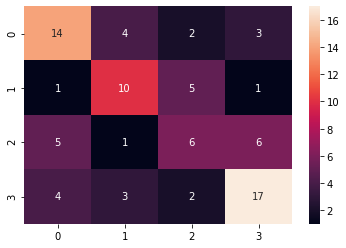

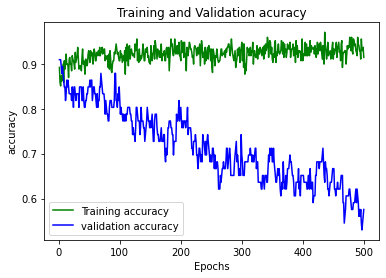

              precision    recall  f1-score   support

           0       0.58      0.61      0.60        23
          10       0.56      0.59      0.57        17
          70       0.40      0.33      0.36        18
         150       0.63      0.65      0.64        26

    accuracy                           0.56        84
   macro avg       0.54      0.55      0.54        84
weighted avg       0.55      0.56      0.56        84



C:\Users\harsh\anaconda3\lib\site-packages\keras\engine\sequential.py:425: UserWarning: `model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
  warnings.warn('`model.predict_proba()` is deprecated and '


One-vs-One ROC AUC scores:
0.803740 (macro),
0.807217 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.809048 (macro),
0.811463 (weighted by prevalence)
{0: 0.8382038488952246, 1: 0.8472344161545216, 2: 0.7297979797979798, 3: 0.8209549071618036}


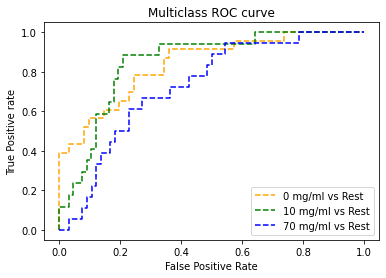

In [62]:
run(model, use_grid=True)

In [55]:
model = 'LogisticRegression'
feat = 'Conc.(mg/ml)'


1 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which mean

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.42333333333333334
Validation_accuracy_score 0.20588235294117646
Test_accuracy_score 0.2976190476190476


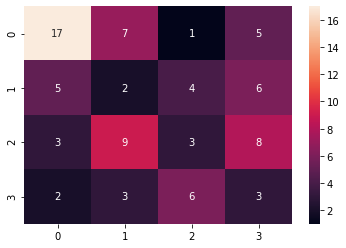

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.63      0.57      0.60        30
          10       0.10      0.12      0.11        17
          70       0.21      0.13      0.16        23
         150       0.14      0.21      0.17        14

    accuracy                           0.30        84
   macro avg       0.27      0.26      0.26        84
weighted avg       0.33      0.30      0.31        84

One-vs-One ROC AUC scores:
0.566431 (macro),
0.574267 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.573659 (macro),
0.585730 (weighted by prevalence)
{0: 0.7376543209876544, 1: 0.46005267778753295, 2: 0.43264433357091947, 3: 0.6642857142857143}


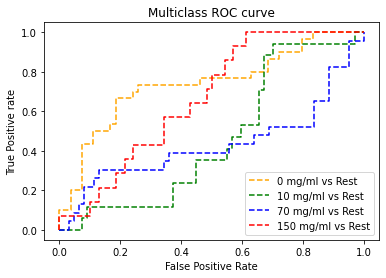


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which mean

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.3933333333333333
Validation_accuracy_score 0.38235294117647056
Test_accuracy_score 0.32142857142857145


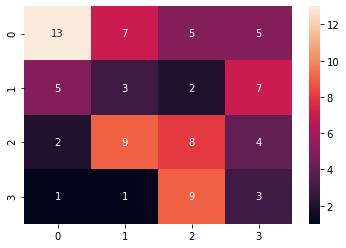

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.62      0.43      0.51        30
          10       0.15      0.18      0.16        17
          70       0.33      0.35      0.34        23
         150       0.16      0.21      0.18        14

    accuracy                           0.32        84
   macro avg       0.32      0.29      0.30        84
weighted avg       0.37      0.32      0.34        84

One-vs-One ROC AUC scores:
0.621387 (macro),
0.629361 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.629599 (macro),
0.640278 (weighted by prevalence)
{0: 0.7549382716049383, 1: 0.5452151009657594, 2: 0.534568781183179, 3: 0.6836734693877551}


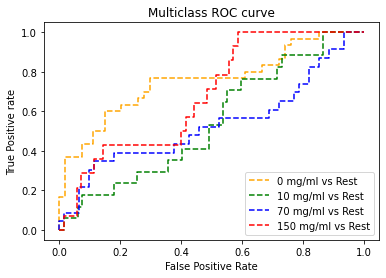


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which mean

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.37666666666666665
Validation_accuracy_score 0.3235294117647059
Test_accuracy_score 0.32142857142857145


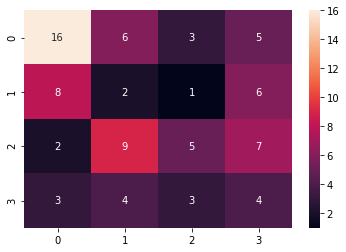

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.55      0.53      0.54        30
          10       0.10      0.12      0.11        17
          70       0.42      0.22      0.29        23
         150       0.18      0.29      0.22        14

    accuracy                           0.32        84
   macro avg       0.31      0.29      0.29        84
weighted avg       0.36      0.32      0.33        84

One-vs-One ROC AUC scores:
0.594904 (macro),
0.606679 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.608664 (macro),
0.623083 (weighted by prevalence)
{0: 0.7358024691358025, 1: 0.4732221246707638, 2: 0.5623663578047042, 3: 0.6632653061224489}


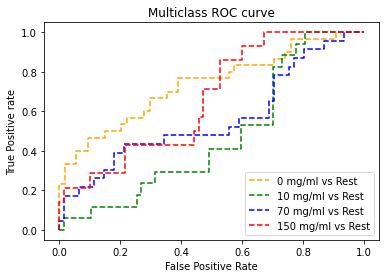


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which mean

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.39666666666666667
Validation_accuracy_score 0.23529411764705882
Test_accuracy_score 0.30952380952380953


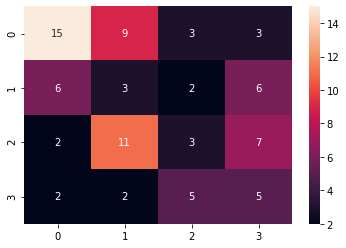

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.60      0.50      0.55        30
          10       0.12      0.18      0.14        17
          70       0.23      0.13      0.17        23
         150       0.24      0.36      0.29        14

    accuracy                           0.31        84
   macro avg       0.30      0.29      0.29        84
weighted avg       0.34      0.31      0.32        84

One-vs-One ROC AUC scores:
0.594778 (macro),
0.608599 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.611567 (macro),
0.625919 (weighted by prevalence)
{0: 0.7580246913580246, 1: 0.5039508340649692, 2: 0.5210263720598717, 3: 0.6632653061224489}


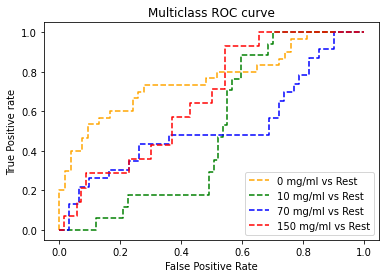


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which mean

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.40863787375415284
Validation_accuracy_score 0.3333333333333333
Test_accuracy_score 0.35714285714285715


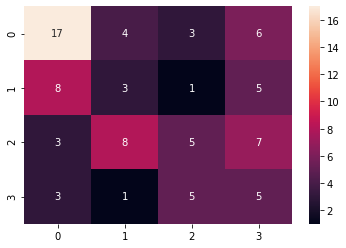

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.55      0.57      0.56        30
          10       0.19      0.18      0.18        17
          70       0.36      0.22      0.27        23
         150       0.22      0.36      0.27        14

    accuracy                           0.36        84
   macro avg       0.33      0.33      0.32        84
weighted avg       0.37      0.36      0.35        84

One-vs-One ROC AUC scores:
0.598982 (macro),
0.607801 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.609024 (macro),
0.621479 (weighted by prevalence)
{0: 0.7271604938271605, 1: 0.5232660228270413, 2: 0.5438346400570206, 3: 0.6418367346938775}


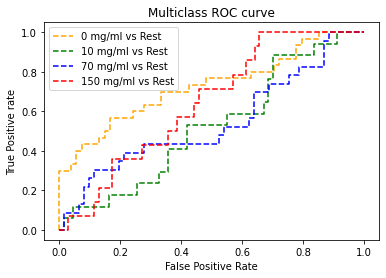


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which mean

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.3787375415282392
Validation_accuracy_score 0.21212121212121213
Test_accuracy_score 0.3333333333333333


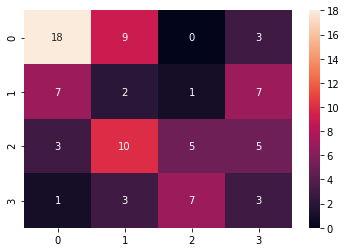

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.62      0.60      0.61        30
          10       0.08      0.12      0.10        17
          70       0.38      0.22      0.28        23
         150       0.17      0.21      0.19        14

    accuracy                           0.33        84
   macro avg       0.31      0.29      0.29        84
weighted avg       0.37      0.33      0.34        84

One-vs-One ROC AUC scores:
0.554729 (macro),
0.565550 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.564520 (macro),
0.581859 (weighted by prevalence)
{0: 0.7296296296296295, 1: 0.46883230904302015, 2: 0.46471846044191023, 3: 0.5948979591836735}


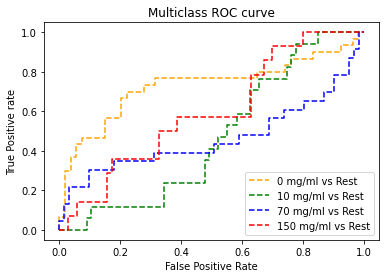


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which mean

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.39867109634551495
Validation_accuracy_score 0.21212121212121213
Test_accuracy_score 0.32142857142857145


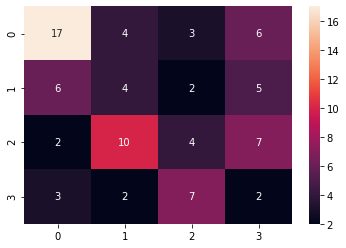

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.61      0.57      0.59        30
          10       0.20      0.24      0.22        17
          70       0.25      0.17      0.21        23
         150       0.10      0.14      0.12        14

    accuracy                           0.32        84
   macro avg       0.29      0.28      0.28        84
weighted avg       0.34      0.32      0.33        84

One-vs-One ROC AUC scores:
0.617391 (macro),
0.626279 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.629242 (macro),
0.638367 (weighted by prevalence)
{0: 0.7512345679012346, 1: 0.5223880597014925, 2: 0.5331432644333571, 3: 0.7102040816326529}


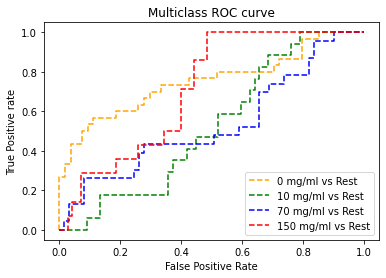


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which mean

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.3687707641196013
Validation_accuracy_score 0.3333333333333333
Test_accuracy_score 0.39285714285714285


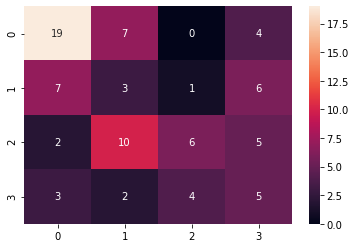

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.61      0.63      0.62        30
          10       0.14      0.18      0.15        17
          70       0.55      0.26      0.35        23
         150       0.25      0.36      0.29        14

    accuracy                           0.39        84
   macro avg       0.39      0.36      0.36        84
weighted avg       0.44      0.39      0.40        84

One-vs-One ROC AUC scores:
0.609757 (macro),
0.620707 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.622954 (macro),
0.635980 (weighted by prevalence)
{0: 0.758641975308642, 1: 0.4863915715539947, 2: 0.548823948681397, 3: 0.6979591836734693}


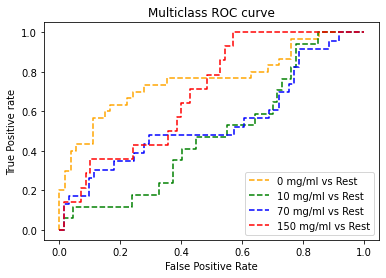


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which mean

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.4053156146179402
Validation_accuracy_score 0.18181818181818182
Test_accuracy_score 0.2976190476190476


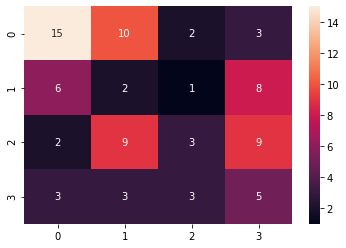

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.58      0.50      0.54        30
          10       0.08      0.12      0.10        17
          70       0.33      0.13      0.19        23
         150       0.20      0.36      0.26        14

    accuracy                           0.30        84
   macro avg       0.30      0.28      0.27        84
weighted avg       0.35      0.30      0.31        84

One-vs-One ROC AUC scores:
0.599223 (macro),
0.611644 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.615898 (macro),
0.627394 (weighted by prevalence)
{0: 0.7395061728395061, 1: 0.4776119402985075, 2: 0.549536707056308, 3: 0.6969387755102041}


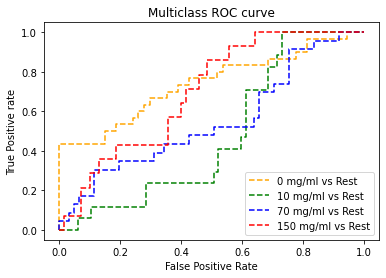


3 of kfold 10


C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which mean

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  

C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\harsh\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:847: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  warnings.warn(


Train_accuracy_score 0.4019933554817276
Validation_accuracy_score 0.30303030303030304
Test_accuracy_score 0.34523809523809523


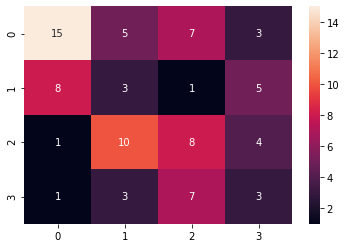

['0', '10', '70', '150']
              precision    recall  f1-score   support

           0       0.60      0.50      0.55        30
          10       0.14      0.18      0.16        17
          70       0.35      0.35      0.35        23
         150       0.20      0.21      0.21        14

    accuracy                           0.35        84
   macro avg       0.32      0.31      0.31        84
weighted avg       0.37      0.35      0.36        84

One-vs-One ROC AUC scores:
0.622348 (macro),
0.629334 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.630916 (macro),
0.638652 (weighted by prevalence)
{0: 0.7283950617283951, 1: 0.5311676909569798, 2: 0.563079116179615, 3: 0.7010204081632654}


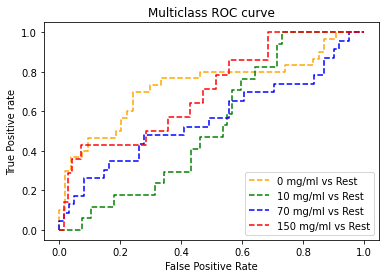

Test_accuracy_score 0.34523809523809523


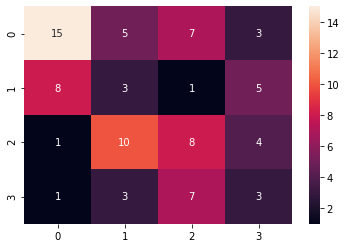

              precision    recall  f1-score   support

           0       0.60      0.50      0.55        30
          10       0.14      0.18      0.16        17
          70       0.35      0.35      0.35        23
         150       0.20      0.21      0.21        14

    accuracy                           0.35        84
   macro avg       0.32      0.31      0.31        84
weighted avg       0.37      0.35      0.36        84

One-vs-One ROC AUC scores:
0.622348 (macro),
0.629334 (weighted by prevalence)
One-vs-Rest ROC AUC scores:
0.630916 (macro),
0.638652 (weighted by prevalence)
{0: 0.7283950617283951, 1: 0.5311676909569798, 2: 0.563079116179615, 3: 0.7010204081632654}


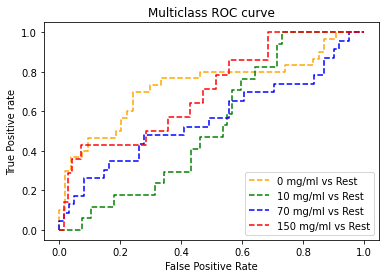

[0.42333333333333334, 0.3933333333333333, 0.37666666666666665, 0.39666666666666667, 0.40863787375415284, 0.3787375415282392, 0.39867109634551495, 0.3687707641196013, 0.4053156146179402, 0.4019933554817276]
[0.20588235294117646, 0.38235294117647056, 0.3235294117647059, 0.23529411764705882, 0.3333333333333333, 0.21212121212121213, 0.21212121212121213, 0.3333333333333333, 0.18181818181818182, 0.30303030303030304]
0.3952126245847176
0.27228163992869875
0.34523809523809523


In [56]:
run(model, use_grid=True)